In [1]:
%load_ext autoreload
%autoreload 2

# 1. Create dataset
Use Sam to extract proposals from input images (100 images) then for proposals with same regions as the ground truth masks, they are considered as positive sameple to the templates ( use the BlenderProc 42 templates), negative otherwise

Run through 100 images - then return positive proposals and negative proposals

Use IoU >0.5 to get the postive proposals

## 1.1 Extract positive proposals, negative proposals, anchors

In [2]:
# this is the one we use
from src.model.contrastive_learning import extract_dataset_train_pbr_xyz

dataset = "daoliuzhao"
data_type = "train_pbr"
scene_id = 1
target_object_id = 1
pos_proposals, neg_proposals = extract_dataset_train_pbr_xyz(dataset, data_type, scene_id, target_object_id) # Take 2.21 minutes

[2024-10-19 15:03:45,057] [INFO] src.model.contrastive_learning: loading sam
[2024-10-19 15:03:45,058] [INFO] root: Loading SAM model from datasets/bop23_challenge/pretrained/segment-anything
[2024-10-19 15:03:49,048] [INFO] root: Init CustomSamAutomaticMaskGenerator done!
  0%|          | 0/195 [00:00<?, ?it/s][2024-10-19 15:03:53,548] [INFO] src.model.contrastive_learning: Keeping only 59 from 78 masks
[2024-10-19 15:04:06,150] [INFO] src.model.contrastive_learning: Number of prediction masks: 59, positive proposals: 31, negative proposals: 0
  1%|          | 1/195 [00:16<52:43, 16.31s/it][2024-10-19 15:04:08,849] [INFO] src.model.contrastive_learning: Keeping only 44 from 60 masks
[2024-10-19 15:04:18,120] [INFO] src.model.contrastive_learning: Number of prediction masks: 44, positive proposals: 20, negative proposals: 0
  1%|          | 2/195 [00:28<44:14, 13.76s/it][2024-10-19 15:04:20,922] [INFO] src.model.contrastive_learning: Keeping only 49 from 92 masks
[2024-10-19 15:04:31,4

In [3]:
all_pos_proposals = [item for sublist in pos_proposals for item in sublist if item["rgb"] is not None]
all_neg_proposals = [item for sublist in neg_proposals for item in sublist]
print("len(all_pos_proposals), len(all_neg_proposals)", len(all_pos_proposals), len(all_neg_proposals))

len(all_pos_proposals), len(all_neg_proposals) 5836 26


In [7]:
# import matplotlib.pyplot as plt
# import numpy as np

# # Number of images to display at a time
# images_per_page = 25

# # Define the number of rows and columns for the grid
# rows = 5
# cols = 5

# # Iterate over the images in steps of images_per_page
# for i in range(5500, len(all_pos_proposals), images_per_page):
#     # Create a new figure for each set of 25 images
#     plt.figure(figsize=(15, 15))

#     for j in range(images_per_page):
#         # Calculate the current image index
#         image_index = i + j

#         # Check if the image_index is within the bounds of the list
#         if image_index >= len(all_pos_proposals):
#             break

#         # Add a subplot for the current image
#         plt.subplot(rows, cols, j + 1)
#         plt.imshow(np.array(all_pos_proposals[image_index]["rgb"]))
#         plt.title(f"Image {image_index}")
#         plt.axis('off')

#     # Display the figure containing 25 images
#     plt.show()


In [5]:
# import matplotlib.pyplot as plt
# import numpy as np

# # Number of images to display at a time
# images_per_page = 25

# # Define the number of rows and columns for the grid
# rows = 5
# cols = 5

# # Iterate over the images in steps of images_per_page
# for i in range(0, len(all_neg_proposals), images_per_page):
#     # Create a new figure for each set of 25 images
#     plt.figure(figsize=(15, 15))

#     for j in range(images_per_page):
#         # Calculate the current image index
#         image_index = i + j

#         # Check if the image_index is within the bounds of the list
#         if image_index >= len(all_neg_proposals):
#             break

#         # Add a subplot for the current image
#         plt.subplot(rows, cols, j + 1)
#         plt.imshow(np.array(all_neg_proposals[image_index]))
#         plt.title(f"Image {image_index}")
#         plt.axis('off')

#     # Display the figure containing 25 images
#     plt.show()


In [6]:
# # Filtering out all wrong image in the neg (it should be ignored)
# # Indices to remove
# indices_to_remove = [
#     16, 48, 49, 67, 82, 100, 171, 180, 201,
#     222, 223, 240, 241, 279, 280, 283, 320,
#     334, 344, 349, 387, 388, 400, 403, 407,
#     408, 411, 412, 417, 419, 421, 442, 458,
#     460, 461, 472, 474, 485
# ]

# # Create a new list excluding the specified indices
# filtered_all_neg_proposals = [item for index, item in enumerate(all_neg_proposals) if index not in indices_to_remove]


In [36]:
# import matplotlib.pyplot as plt
# import numpy as np

# # Number of images to display at a time
# images_per_page = 25

# # Define the number of rows and columns for the grid
# rows = 5
# cols = 5

# # Iterate over the images in steps of images_per_page
# for i in range(0, 500, images_per_page):
#     # Create a new figure for each set of 25 images
#     plt.figure(figsize=(15, 15))

#     for j in range(images_per_page):
#         # Calculate the current image index
#         image_index = i + j

#         # Check if the image_index is within the bounds of the list
#         if image_index >= len(neg_proposals):
#             break

#         # Add a subplot for the current image
#         plt.subplot(rows, cols, j + 1)
#         plt.imshow(np.array(neg_proposals[image_index]))
#         plt.title(f"Image {image_index}")
#         plt.axis('off')

#     # Display the figure containing 25 images
#     plt.show()


In [1]:
# extract neagtive 
from src.model.contrastive_learning import extract_negative_dataset

final_neg_proposals = extract_negative_dataset(dataset="background_pbr_rendered_include_heudije_dataset",data_type="train_pbr", scene_id=0)
len(final_neg_proposals)

[2024-10-21 16:11:57,319] [INFO] src.model.contrastive_learning: loading sam
[2024-10-21 16:11:57,325] [INFO] root: Loading SAM model from datasets/bop23_challenge/pretrained/segment-anything
[2024-10-21 16:12:05,074] [INFO] root: Init CustomSamAutomaticMaskGenerator done!
  0%|          | 0/450 [00:00<?, ?it/s][2024-10-21 16:12:13,482] [INFO] src.model.contrastive_learning: Keeping only 34 from 72 masks


[8, 9, 11, 14, 15, 16, 18, 22, 24, 28, 31, 35, 37, 38, 39, 40, 41, 42, 44, 45, 46, 47, 48, 51, 52, 53, 54, 55, 57, 58, 59, 61, 62, 64]


[2024-10-21 16:12:13,772] [INFO] src.model.contrastive_learning: Number of prediction masks: 72, negative proposals: 34
  0%|          | 1/450 [00:07<57:52,  7.73s/it][2024-10-21 16:12:21,043] [INFO] src.model.contrastive_learning: Keeping only 50 from 90 masks


[1, 2, 4, 6, 8, 9, 11, 12, 13, 15, 19, 20, 21, 24, 27, 30, 31, 34, 35, 36, 37, 38, 39, 40, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 54, 60, 62, 63, 66, 69, 71, 73, 74, 77, 78, 79, 80, 85, 86, 88]


[2024-10-21 16:12:21,404] [INFO] src.model.contrastive_learning: Number of prediction masks: 90, negative proposals: 50
  0%|          | 2/450 [00:15<57:18,  7.67s/it][2024-10-21 16:12:28,852] [INFO] src.model.contrastive_learning: Keeping only 46 from 67 masks


[0, 1, 2, 3, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 20, 23, 24, 25, 26, 28, 29, 30, 31, 35, 36, 37, 39, 41, 43, 44, 45, 46, 47, 48, 49, 51, 52, 53, 54, 55, 56, 58, 62, 65]


[2024-10-21 16:12:29,145] [INFO] src.model.contrastive_learning: Number of prediction masks: 67, negative proposals: 46
  1%|          | 3/450 [00:23<57:23,  7.70s/it][2024-10-21 16:12:32,967] [INFO] src.model.contrastive_learning: Keeping only 68 from 96 masks


[2, 3, 4, 5, 6, 7, 8, 9, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 24, 25, 27, 29, 30, 33, 34, 35, 36, 37, 38, 39, 40, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 57, 58, 59, 61, 62, 64, 65, 67, 68, 69, 71, 77, 79, 81, 83, 84, 86, 87, 88, 89, 90, 91, 95]


[2024-10-21 16:12:33,404] [INFO] src.model.contrastive_learning: Number of prediction masks: 96, negative proposals: 68
  1%|          | 4/450 [00:27<47:09,  6.34s/it][2024-10-21 16:12:38,694] [INFO] src.model.contrastive_learning: Keeping only 51 from 78 masks


[1, 3, 4, 7, 9, 10, 14, 15, 16, 17, 19, 21, 23, 24, 25, 26, 27, 28, 30, 31, 32, 33, 34, 35, 36, 40, 43, 44, 46, 47, 48, 49, 50, 51, 52, 53, 55, 56, 57, 58, 59, 60, 62, 63, 64, 65, 67, 71, 74, 76, 77]


[2024-10-21 16:12:39,110] [INFO] src.model.contrastive_learning: Number of prediction masks: 78, negative proposals: 51
  1%|          | 5/450 [00:33<45:21,  6.12s/it][2024-10-21 16:12:45,066] [INFO] src.model.contrastive_learning: Keeping only 37 from 64 masks


[1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 17, 19, 20, 21, 22, 27, 28, 31, 32, 35, 37, 39, 40, 42, 43, 44, 45, 50, 51, 53, 57, 60, 61]


[2024-10-21 16:12:45,278] [INFO] src.model.contrastive_learning: Number of prediction masks: 64, negative proposals: 37
  1%|▏         | 6/450 [00:39<45:22,  6.13s/it][2024-10-21 16:12:48,630] [INFO] src.model.contrastive_learning: Keeping only 53 from 88 masks


[0, 1, 3, 4, 5, 7, 8, 9, 16, 20, 21, 23, 24, 25, 26, 27, 32, 33, 36, 37, 39, 43, 44, 45, 46, 47, 48, 50, 53, 54, 57, 58, 59, 61, 62, 63, 64, 65, 67, 68, 69, 70, 71, 73, 74, 75, 76, 77, 78, 79, 81, 82, 86]


[2024-10-21 16:12:48,912] [INFO] src.model.contrastive_learning: Number of prediction masks: 88, negative proposals: 53
  2%|▏         | 7/450 [00:42<39:14,  5.31s/it][2024-10-21 16:12:53,841] [INFO] src.model.contrastive_learning: Keeping only 37 from 68 masks


[1, 4, 6, 7, 8, 9, 10, 11, 12, 13, 18, 20, 22, 26, 28, 32, 33, 35, 37, 41, 42, 43, 44, 46, 47, 48, 50, 51, 52, 54, 55, 57, 58, 60, 62, 65, 66]


[2024-10-21 16:12:54,378] [INFO] src.model.contrastive_learning: Number of prediction masks: 68, negative proposals: 37
  2%|▏         | 8/450 [00:48<39:30,  5.36s/it][2024-10-21 16:12:58,667] [INFO] src.model.contrastive_learning: Keeping only 44 from 71 masks


[0, 3, 4, 5, 6, 7, 8, 10, 12, 14, 15, 16, 18, 20, 21, 24, 25, 26, 31, 32, 34, 35, 36, 37, 39, 40, 41, 43, 44, 45, 46, 50, 51, 52, 55, 56, 58, 59, 60, 61, 62, 63, 64, 65]


[2024-10-21 16:12:59,117] [INFO] src.model.contrastive_learning: Number of prediction masks: 71, negative proposals: 44
  2%|▏         | 9/450 [00:53<37:58,  5.17s/it][2024-10-21 16:13:05,835] [INFO] src.model.contrastive_learning: Keeping only 56 from 79 masks


[0, 1, 3, 5, 6, 8, 9, 10, 13, 14, 15, 16, 17, 18, 19, 20, 21, 26, 27, 28, 29, 30, 34, 35, 36, 38, 39, 41, 42, 44, 45, 46, 47, 48, 49, 50, 52, 53, 54, 55, 56, 59, 60, 61, 64, 66, 67, 69, 70, 71, 72, 73, 74, 75, 77, 78]


[2024-10-21 16:13:06,146] [INFO] src.model.contrastive_learning: Number of prediction masks: 79, negative proposals: 56
  2%|▏         | 10/450 [01:00<42:06,  5.74s/it][2024-10-21 16:13:11,110] [INFO] src.model.contrastive_learning: Keeping only 48 from 75 masks


[2, 3, 4, 5, 6, 7, 8, 10, 11, 13, 14, 15, 17, 18, 19, 20, 21, 22, 24, 26, 27, 28, 31, 34, 35, 36, 37, 38, 40, 43, 45, 46, 47, 48, 49, 51, 52, 54, 56, 58, 59, 61, 62, 63, 65, 69, 73, 74]


[2024-10-21 16:13:11,533] [INFO] src.model.contrastive_learning: Number of prediction masks: 75, negative proposals: 48
  2%|▏         | 11/450 [01:05<41:13,  5.63s/it][2024-10-21 16:13:15,320] [INFO] src.model.contrastive_learning: Keeping only 53 from 80 masks


[0, 2, 4, 5, 6, 8, 9, 10, 11, 12, 13, 15, 16, 17, 19, 20, 22, 24, 25, 26, 27, 29, 30, 31, 33, 34, 35, 36, 37, 38, 39, 40, 41, 43, 44, 47, 48, 49, 50, 52, 54, 55, 57, 58, 64, 66, 67, 69, 70, 71, 73, 75, 77]


[2024-10-21 16:13:15,581] [INFO] src.model.contrastive_learning: Number of prediction masks: 80, negative proposals: 53
  3%|▎         | 12/450 [01:09<37:36,  5.15s/it][2024-10-21 16:13:21,685] [INFO] src.model.contrastive_learning: Keeping only 37 from 68 masks


[1, 2, 4, 5, 7, 8, 9, 10, 12, 13, 14, 15, 16, 17, 20, 21, 23, 24, 26, 28, 32, 33, 38, 40, 41, 42, 44, 45, 46, 53, 55, 57, 58, 59, 61, 62, 66]


[2024-10-21 16:13:22,148] [INFO] src.model.contrastive_learning: Number of prediction masks: 68, negative proposals: 37
  3%|▎         | 13/450 [01:16<40:38,  5.58s/it][2024-10-21 16:13:26,373] [INFO] src.model.contrastive_learning: Keeping only 52 from 71 masks


[0, 3, 4, 5, 6, 8, 10, 11, 12, 13, 15, 16, 17, 18, 19, 21, 22, 23, 24, 26, 27, 28, 29, 30, 31, 33, 36, 37, 38, 39, 40, 42, 45, 46, 47, 48, 50, 51, 52, 54, 55, 56, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69]


[2024-10-21 16:13:26,650] [INFO] src.model.contrastive_learning: Number of prediction masks: 71, negative proposals: 52
  3%|▎         | 14/450 [01:20<38:10,  5.25s/it][2024-10-21 16:13:33,807] [INFO] src.model.contrastive_learning: Keeping only 51 from 99 masks


[0, 4, 7, 13, 18, 20, 21, 23, 24, 25, 26, 28, 29, 31, 33, 34, 37, 38, 40, 46, 47, 49, 50, 51, 52, 53, 57, 58, 60, 61, 63, 66, 67, 68, 69, 71, 73, 74, 76, 79, 81, 82, 86, 87, 89, 91, 92, 93, 94, 95, 98]


[2024-10-21 16:13:34,079] [INFO] src.model.contrastive_learning: Number of prediction masks: 99, negative proposals: 51
  3%|▎         | 15/450 [01:28<42:50,  5.91s/it][2024-10-21 16:13:39,302] [INFO] src.model.contrastive_learning: Keeping only 49 from 80 masks


[1, 4, 8, 9, 13, 14, 17, 18, 19, 20, 22, 23, 24, 25, 27, 29, 31, 33, 35, 39, 40, 41, 42, 43, 45, 46, 47, 48, 50, 52, 53, 54, 57, 59, 60, 61, 62, 63, 64, 65, 67, 68, 69, 71, 72, 73, 76, 77, 79]


[2024-10-21 16:13:39,545] [INFO] src.model.contrastive_learning: Number of prediction masks: 80, negative proposals: 49
  4%|▎         | 16/450 [01:33<41:47,  5.78s/it][2024-10-21 16:13:47,294] [INFO] src.model.contrastive_learning: Keeping only 43 from 79 masks


[3, 4, 5, 6, 8, 9, 10, 11, 12, 13, 14, 15, 17, 18, 22, 23, 24, 28, 31, 33, 35, 39, 40, 41, 43, 44, 45, 48, 49, 52, 53, 54, 55, 59, 63, 64, 66, 68, 71, 73, 74, 75, 77]


[2024-10-21 16:13:47,574] [INFO] src.model.contrastive_learning: Number of prediction masks: 79, negative proposals: 43
  4%|▍         | 17/450 [01:41<46:34,  6.45s/it][2024-10-21 16:13:50,450] [INFO] src.model.contrastive_learning: Keeping only 41 from 86 masks


[5, 7, 8, 9, 12, 14, 17, 22, 24, 25, 26, 29, 32, 34, 35, 36, 39, 40, 42, 43, 47, 49, 52, 54, 55, 56, 58, 60, 65, 66, 67, 71, 73, 76, 78, 79, 80, 81, 82, 83, 85]


[2024-10-21 16:13:50,756] [INFO] src.model.contrastive_learning: Number of prediction masks: 86, negative proposals: 41
  4%|▍         | 18/450 [01:44<39:23,  5.47s/it][2024-10-21 16:13:57,457] [INFO] src.model.contrastive_learning: Keeping only 55 from 82 masks


[2, 6, 8, 9, 10, 11, 12, 14, 15, 17, 18, 19, 20, 22, 23, 24, 26, 28, 30, 31, 32, 33, 34, 35, 36, 37, 38, 43, 45, 46, 47, 48, 50, 51, 52, 53, 54, 55, 58, 60, 62, 66, 67, 68, 69, 70, 71, 72, 73, 74, 77, 78, 79, 80, 81]


[2024-10-21 16:13:57,747] [INFO] src.model.contrastive_learning: Number of prediction masks: 82, negative proposals: 55
  4%|▍         | 19/450 [01:51<42:34,  5.93s/it][2024-10-21 16:14:01,733] [INFO] src.model.contrastive_learning: Keeping only 42 from 68 masks


[2, 3, 4, 5, 6, 10, 11, 13, 14, 15, 16, 17, 18, 19, 20, 22, 24, 25, 26, 27, 28, 30, 32, 35, 36, 38, 44, 45, 46, 47, 50, 51, 53, 54, 55, 57, 58, 59, 60, 61, 63, 66]


[2024-10-21 16:14:02,057] [INFO] src.model.contrastive_learning: Number of prediction masks: 68, negative proposals: 42
  4%|▍         | 20/450 [01:56<38:59,  5.44s/it][2024-10-21 16:14:06,248] [INFO] src.model.contrastive_learning: Keeping only 77 from 110 masks


[0, 1, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 19, 21, 22, 23, 25, 26, 27, 28, 29, 30, 31, 33, 34, 35, 36, 39, 40, 41, 43, 44, 45, 46, 47, 48, 50, 52, 53, 54, 55, 56, 57, 58, 61, 64, 66, 67, 68, 69, 70, 72, 75, 76, 78, 80, 81, 85, 86, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 103, 104, 105, 107, 108, 109]


[2024-10-21 16:14:06,884] [INFO] src.model.contrastive_learning: Number of prediction masks: 110, negative proposals: 77
  5%|▍         | 21/450 [02:00<37:35,  5.26s/it][2024-10-21 16:14:12,602] [INFO] src.model.contrastive_learning: Keeping only 47 from 72 masks


[0, 1, 2, 3, 4, 5, 6, 7, 9, 10, 11, 12, 13, 15, 16, 20, 23, 24, 25, 27, 29, 30, 31, 32, 33, 34, 35, 39, 42, 43, 44, 45, 46, 47, 48, 50, 51, 55, 56, 57, 59, 60, 61, 63, 65, 68, 69]


[2024-10-21 16:14:12,847] [INFO] src.model.contrastive_learning: Number of prediction masks: 72, negative proposals: 47
  5%|▍         | 22/450 [02:06<39:00,  5.47s/it][2024-10-21 16:14:18,782] [INFO] src.model.contrastive_learning: Keeping only 51 from 81 masks


[1, 2, 5, 6, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 29, 30, 31, 32, 34, 35, 46, 47, 48, 50, 56, 59, 61, 62, 63, 64, 65, 66, 68, 69, 70, 72, 73, 74, 77, 78, 80]


[2024-10-21 16:14:19,105] [INFO] src.model.contrastive_learning: Number of prediction masks: 81, negative proposals: 51
  5%|▌         | 23/450 [02:13<40:36,  5.71s/it][2024-10-21 16:14:24,218] [INFO] src.model.contrastive_learning: Keeping only 42 from 75 masks


[2, 6, 8, 9, 11, 12, 14, 15, 17, 19, 21, 24, 26, 28, 29, 30, 31, 33, 34, 35, 37, 38, 41, 43, 45, 46, 47, 48, 51, 54, 57, 60, 61, 62, 64, 65, 66, 67, 68, 69, 72, 73]


[2024-10-21 16:14:24,544] [INFO] src.model.contrastive_learning: Number of prediction masks: 75, negative proposals: 42
  5%|▌         | 24/450 [02:18<39:56,  5.63s/it][2024-10-21 16:14:32,036] [INFO] src.model.contrastive_learning: Keeping only 44 from 63 masks


[1, 3, 4, 5, 6, 7, 8, 9, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 33, 34, 36, 37, 42, 45, 46, 47, 48, 52, 53, 54, 56, 57, 59, 60]


[2024-10-21 16:14:32,293] [INFO] src.model.contrastive_learning: Number of prediction masks: 63, negative proposals: 44
  6%|▌         | 25/450 [02:26<44:21,  6.26s/it][2024-10-21 16:14:36,068] [INFO] src.model.contrastive_learning: Keeping only 35 from 58 masks


[1, 2, 5, 7, 8, 9, 12, 14, 17, 18, 20, 21, 23, 24, 25, 26, 29, 31, 33, 34, 35, 36, 37, 38, 39, 40, 41, 43, 47, 50, 53, 54, 55, 56, 57]


[2024-10-21 16:14:36,394] [INFO] src.model.contrastive_learning: Number of prediction masks: 58, negative proposals: 35
  6%|▌         | 26/450 [02:30<39:40,  5.61s/it][2024-10-21 16:14:39,625] [INFO] src.model.contrastive_learning: Keeping only 42 from 72 masks


[0, 1, 5, 7, 9, 10, 12, 13, 14, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 28, 29, 31, 33, 34, 35, 36, 37, 38, 43, 44, 50, 53, 58, 59, 60, 61, 65, 66, 67, 68, 70, 71]


[2024-10-21 16:14:39,858] [INFO] src.model.contrastive_learning: Number of prediction masks: 72, negative proposals: 42
  6%|▌         | 27/450 [02:33<35:01,  4.97s/it][2024-10-21 16:14:42,689] [INFO] src.model.contrastive_learning: Keeping only 39 from 66 masks


[0, 3, 4, 7, 9, 10, 11, 12, 14, 15, 17, 19, 22, 23, 24, 25, 26, 27, 31, 32, 33, 34, 37, 38, 39, 44, 45, 46, 47, 48, 49, 51, 52, 54, 57, 59, 60, 61, 63]


[2024-10-21 16:14:43,085] [INFO] src.model.contrastive_learning: Number of prediction masks: 66, negative proposals: 39
  6%|▌         | 28/450 [02:37<31:16,  4.45s/it][2024-10-21 16:14:46,569] [INFO] src.model.contrastive_learning: Keeping only 53 from 75 masks


[1, 2, 5, 6, 7, 9, 10, 12, 14, 15, 16, 17, 18, 19, 20, 21, 22, 24, 25, 27, 28, 30, 31, 32, 33, 35, 37, 38, 39, 41, 43, 46, 47, 48, 49, 50, 51, 52, 53, 56, 57, 58, 59, 61, 62, 63, 64, 65, 66, 67, 68, 69, 71]


[2024-10-21 16:14:46,985] [INFO] src.model.contrastive_learning: Number of prediction masks: 75, negative proposals: 53
  6%|▋         | 29/450 [02:40<30:03,  4.28s/it][2024-10-21 16:14:50,104] [INFO] src.model.contrastive_learning: Keeping only 35 from 53 masks


[1, 3, 5, 8, 9, 12, 13, 14, 15, 16, 17, 19, 20, 21, 23, 25, 26, 28, 30, 31, 32, 35, 36, 37, 38, 39, 41, 42, 43, 44, 45, 46, 47, 48, 52]


[2024-10-21 16:14:50,315] [INFO] src.model.contrastive_learning: Number of prediction masks: 53, negative proposals: 35
  7%|▋         | 30/450 [02:44<27:58,  4.00s/it][2024-10-21 16:14:57,426] [INFO] src.model.contrastive_learning: Keeping only 53 from 82 masks


[2, 4, 7, 9, 10, 11, 12, 13, 14, 16, 18, 19, 20, 21, 23, 24, 25, 27, 29, 32, 34, 35, 37, 40, 41, 42, 44, 46, 48, 49, 50, 51, 52, 53, 56, 59, 60, 61, 62, 63, 66, 67, 68, 69, 70, 71, 72, 73, 75, 76, 78, 80, 81]


[2024-10-21 16:14:57,945] [INFO] src.model.contrastive_learning: Number of prediction masks: 82, negative proposals: 53
  7%|▋         | 31/450 [02:51<35:34,  5.09s/it][2024-10-21 16:15:03,637] [INFO] src.model.contrastive_learning: Keeping only 40 from 67 masks


[2, 3, 6, 7, 8, 10, 11, 12, 13, 16, 17, 18, 21, 23, 25, 26, 27, 28, 29, 30, 31, 32, 34, 35, 37, 38, 39, 41, 42, 43, 51, 52, 55, 56, 57, 58, 60, 62, 64, 65]


[2024-10-21 16:15:03,883] [INFO] src.model.contrastive_learning: Number of prediction masks: 67, negative proposals: 40
  7%|▋         | 32/450 [02:57<37:12,  5.34s/it][2024-10-21 16:15:06,608] [INFO] src.model.contrastive_learning: Keeping only 36 from 56 masks
[2024-10-21 16:15:06,783] [INFO] src.model.contrastive_learning: Number of prediction masks: 56, negative proposals: 36
  7%|▋         | 33/450 [03:00<32:01,  4.61s/it]

[0, 1, 2, 3, 7, 8, 11, 14, 15, 16, 17, 18, 19, 20, 21, 22, 24, 28, 29, 30, 31, 32, 33, 34, 35, 40, 42, 43, 44, 45, 46, 47, 49, 50, 52, 55]


[2024-10-21 16:15:11,800] [INFO] src.model.contrastive_learning: Keeping only 41 from 67 masks


[1, 2, 6, 7, 8, 11, 12, 14, 15, 16, 17, 19, 21, 23, 24, 25, 26, 27, 28, 30, 32, 33, 34, 35, 36, 37, 38, 41, 43, 44, 47, 48, 52, 53, 55, 56, 58, 59, 61, 64, 66]


[2024-10-21 16:15:12,022] [INFO] src.model.contrastive_learning: Number of prediction masks: 67, negative proposals: 41
  8%|▊         | 34/450 [03:05<33:15,  4.80s/it][2024-10-21 16:15:18,906] [INFO] src.model.contrastive_learning: Keeping only 40 from 67 masks


[1, 3, 5, 6, 8, 9, 11, 12, 16, 17, 18, 19, 21, 22, 23, 28, 29, 31, 33, 34, 35, 36, 37, 39, 41, 42, 43, 45, 48, 51, 52, 54, 55, 56, 58, 60, 62, 63, 65, 66]


[2024-10-21 16:15:19,164] [INFO] src.model.contrastive_learning: Number of prediction masks: 67, negative proposals: 40
  8%|▊         | 35/450 [03:13<38:02,  5.50s/it][2024-10-21 16:15:24,388] [INFO] src.model.contrastive_learning: Keeping only 44 from 70 masks


[3, 4, 6, 8, 10, 11, 13, 17, 18, 19, 20, 21, 22, 24, 25, 26, 28, 29, 30, 32, 33, 34, 36, 37, 41, 43, 44, 45, 46, 47, 49, 50, 51, 52, 56, 60, 62, 63, 64, 65, 66, 67, 68, 69]


[2024-10-21 16:15:24,581] [INFO] src.model.contrastive_learning: Number of prediction masks: 70, negative proposals: 44
  8%|▊         | 36/450 [03:18<37:47,  5.48s/it][2024-10-21 16:15:32,391] [INFO] src.model.contrastive_learning: Keeping only 45 from 81 masks


[2, 3, 4, 6, 8, 9, 10, 11, 13, 16, 18, 19, 20, 21, 24, 25, 26, 27, 28, 29, 30, 31, 33, 35, 37, 39, 40, 41, 43, 44, 49, 51, 53, 56, 58, 63, 64, 66, 67, 68, 69, 70, 73, 75, 78]


[2024-10-21 16:15:32,648] [INFO] src.model.contrastive_learning: Number of prediction masks: 81, negative proposals: 45
  8%|▊         | 37/450 [03:26<43:02,  6.25s/it][2024-10-21 16:15:37,492] [INFO] src.model.contrastive_learning: Keeping only 54 from 84 masks


[1, 3, 4, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 21, 22, 24, 25, 28, 29, 30, 31, 32, 33, 35, 37, 38, 39, 41, 43, 46, 47, 49, 50, 51, 53, 54, 56, 57, 59, 60, 63, 65, 66, 67, 68, 71, 72, 74, 76, 77, 79, 82]


[2024-10-21 16:15:37,871] [INFO] src.model.contrastive_learning: Number of prediction masks: 84, negative proposals: 54
  8%|▊         | 38/450 [03:31<40:48,  5.94s/it][2024-10-21 16:15:40,685] [INFO] src.model.contrastive_learning: Keeping only 44 from 81 masks


[4, 7, 8, 10, 12, 13, 14, 17, 18, 19, 21, 23, 24, 26, 27, 29, 30, 31, 34, 35, 39, 41, 44, 48, 50, 51, 54, 55, 56, 60, 61, 64, 65, 67, 68, 69, 71, 72, 74, 75, 76, 77, 78, 79]


[2024-10-21 16:15:40,955] [INFO] src.model.contrastive_learning: Number of prediction masks: 81, negative proposals: 44
  9%|▊         | 39/450 [03:34<34:50,  5.09s/it][2024-10-21 16:15:44,367] [INFO] src.model.contrastive_learning: Keeping only 47 from 87 masks


[0, 7, 9, 10, 11, 12, 15, 16, 17, 19, 21, 22, 24, 27, 32, 35, 36, 37, 38, 39, 41, 42, 43, 44, 46, 48, 49, 50, 54, 56, 57, 58, 63, 64, 65, 66, 67, 68, 70, 74, 76, 78, 79, 82, 83, 84, 85]


[2024-10-21 16:15:44,818] [INFO] src.model.contrastive_learning: Number of prediction masks: 87, negative proposals: 47
  9%|▉         | 40/450 [03:38<32:14,  4.72s/it][2024-10-21 16:15:50,067] [INFO] src.model.contrastive_learning: Keeping only 26 from 75 masks
[2024-10-21 16:15:50,193] [INFO] src.model.contrastive_learning: Number of prediction masks: 75, negative proposals: 26
  9%|▉         | 41/450 [03:44<33:30,  4.92s/it]

[0, 5, 6, 11, 15, 17, 18, 21, 22, 24, 26, 27, 28, 30, 33, 36, 37, 40, 42, 44, 56, 58, 59, 60, 62, 70]


[2024-10-21 16:15:54,470] [INFO] src.model.contrastive_learning: Keeping only 46 from 68 masks


[2, 3, 4, 7, 8, 9, 10, 11, 12, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 28, 29, 30, 31, 33, 35, 36, 37, 40, 41, 42, 43, 44, 48, 49, 51, 52, 53, 54, 57, 60, 63, 64, 65]


[2024-10-21 16:15:54,815] [INFO] src.model.contrastive_learning: Number of prediction masks: 68, negative proposals: 46
  9%|▉         | 42/450 [03:48<32:49,  4.83s/it][2024-10-21 16:15:58,878] [INFO] src.model.contrastive_learning: Keeping only 45 from 61 masks


[1, 2, 4, 5, 6, 7, 8, 9, 11, 12, 14, 15, 16, 17, 19, 20, 21, 23, 24, 25, 26, 27, 28, 30, 31, 35, 36, 37, 39, 40, 41, 42, 43, 46, 48, 49, 50, 52, 53, 54, 55, 56, 58, 59, 60]


[2024-10-21 16:15:59,314] [INFO] src.model.contrastive_learning: Number of prediction masks: 61, negative proposals: 45
 10%|▉         | 43/450 [03:53<32:04,  4.73s/it][2024-10-21 16:16:03,470] [INFO] src.model.contrastive_learning: Keeping only 43 from 86 masks


[0, 1, 2, 5, 11, 12, 13, 15, 16, 18, 21, 22, 25, 28, 29, 30, 32, 33, 35, 36, 37, 39, 45, 46, 48, 49, 50, 51, 58, 59, 62, 64, 70, 71, 72, 73, 74, 75, 77, 78, 80, 81, 83]


[2024-10-21 16:16:03,684] [INFO] src.model.contrastive_learning: Number of prediction masks: 86, negative proposals: 43
 10%|▉         | 44/450 [03:57<31:16,  4.62s/it][2024-10-21 16:16:11,375] [INFO] src.model.contrastive_learning: Keeping only 39 from 66 masks


[1, 3, 6, 8, 11, 12, 16, 18, 19, 20, 21, 22, 25, 26, 27, 28, 30, 31, 34, 35, 36, 37, 38, 41, 42, 43, 44, 45, 46, 48, 50, 52, 53, 57, 58, 59, 60, 61, 62]


[2024-10-21 16:16:11,602] [INFO] src.model.contrastive_learning: Number of prediction masks: 66, negative proposals: 39
 10%|█         | 45/450 [04:05<37:55,  5.62s/it][2024-10-21 16:16:15,209] [INFO] src.model.contrastive_learning: Keeping only 33 from 56 masks
[2024-10-21 16:16:15,389] [INFO] src.model.contrastive_learning: Number of prediction masks: 56, negative proposals: 33
 10%|█         | 46/450 [04:09<34:04,  5.06s/it]

[1, 3, 4, 8, 10, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 30, 33, 37, 38, 42, 43, 45, 46, 47, 48, 49, 51, 52, 54]


[2024-10-21 16:16:18,508] [INFO] src.model.contrastive_learning: Keeping only 41 from 76 masks


[1, 3, 6, 8, 12, 13, 15, 17, 18, 19, 20, 22, 23, 24, 25, 26, 27, 28, 30, 31, 33, 34, 39, 44, 45, 47, 48, 50, 51, 52, 53, 54, 57, 58, 59, 60, 61, 62, 65, 66, 72]


[2024-10-21 16:16:18,817] [INFO] src.model.contrastive_learning: Number of prediction masks: 76, negative proposals: 41
 10%|█         | 47/450 [04:12<30:42,  4.57s/it][2024-10-21 16:16:24,713] [INFO] src.model.contrastive_learning: Keeping only 26 from 50 masks
[2024-10-21 16:16:24,872] [INFO] src.model.contrastive_learning: Number of prediction masks: 50, negative proposals: 26
 11%|█         | 48/450 [04:18<33:36,  5.02s/it]

[1, 6, 7, 9, 13, 14, 15, 20, 21, 22, 23, 25, 26, 28, 29, 30, 32, 36, 37, 38, 40, 42, 44, 46, 47, 49]


[2024-10-21 16:16:29,376] [INFO] src.model.contrastive_learning: Keeping only 32 from 72 masks
[2024-10-21 16:16:29,519] [INFO] src.model.contrastive_learning: Number of prediction masks: 72, negative proposals: 32
 11%|█         | 49/450 [04:23<32:47,  4.91s/it]

[0, 4, 6, 7, 8, 10, 11, 12, 13, 14, 16, 17, 18, 19, 20, 23, 24, 25, 27, 30, 34, 35, 37, 38, 42, 45, 46, 47, 48, 50, 61, 70]


[2024-10-21 16:16:33,762] [INFO] src.model.contrastive_learning: Keeping only 48 from 71 masks


[0, 1, 6, 7, 8, 9, 10, 11, 12, 13, 16, 17, 18, 19, 20, 22, 23, 24, 25, 27, 28, 29, 30, 31, 33, 34, 36, 38, 39, 40, 41, 43, 45, 47, 49, 50, 51, 53, 54, 57, 58, 59, 60, 61, 63, 64, 68, 69]


[2024-10-21 16:16:34,130] [INFO] src.model.contrastive_learning: Number of prediction masks: 71, negative proposals: 48
 11%|█         | 50/450 [04:28<32:06,  4.82s/it][2024-10-21 16:16:40,085] [INFO] src.model.contrastive_learning: Keeping only 35 from 57 masks


[0, 1, 2, 4, 6, 8, 9, 15, 19, 21, 23, 25, 27, 28, 29, 30, 31, 32, 33, 35, 36, 37, 38, 39, 40, 42, 43, 45, 46, 47, 48, 49, 52, 53, 56]


[2024-10-21 16:16:40,292] [INFO] src.model.contrastive_learning: Number of prediction masks: 57, negative proposals: 35
 11%|█▏        | 51/450 [04:34<34:42,  5.22s/it][2024-10-21 16:16:43,975] [INFO] src.model.contrastive_learning: Keeping only 52 from 83 masks


[1, 4, 5, 7, 9, 11, 12, 13, 14, 16, 18, 20, 21, 22, 23, 24, 25, 26, 32, 34, 35, 36, 37, 39, 40, 41, 43, 44, 45, 46, 47, 50, 51, 52, 53, 54, 55, 56, 60, 62, 63, 64, 65, 67, 68, 69, 70, 72, 73, 75, 78, 81]


[2024-10-21 16:16:44,294] [INFO] src.model.contrastive_learning: Number of prediction masks: 83, negative proposals: 52
 12%|█▏        | 52/450 [04:38<32:12,  4.86s/it][2024-10-21 16:16:49,551] [INFO] src.model.contrastive_learning: Keeping only 51 from 72 masks


[2, 3, 4, 5, 6, 8, 9, 10, 11, 12, 13, 14, 16, 17, 18, 19, 20, 22, 24, 25, 26, 27, 28, 29, 30, 31, 33, 34, 35, 36, 37, 40, 41, 43, 46, 48, 49, 50, 54, 56, 57, 58, 59, 60, 62, 64, 66, 67, 69, 70, 71]


[2024-10-21 16:16:49,946] [INFO] src.model.contrastive_learning: Number of prediction masks: 72, negative proposals: 51
 12%|█▏        | 53/450 [04:43<33:42,  5.09s/it][2024-10-21 16:16:53,826] [INFO] src.model.contrastive_learning: Keeping only 46 from 73 masks


[1, 3, 4, 6, 7, 8, 10, 11, 12, 13, 14, 15, 16, 18, 19, 21, 22, 23, 24, 25, 26, 28, 30, 34, 37, 38, 40, 41, 42, 44, 45, 46, 47, 50, 51, 52, 54, 55, 57, 58, 62, 65, 66, 67, 71, 72]


[2024-10-21 16:16:54,171] [INFO] src.model.contrastive_learning: Number of prediction masks: 73, negative proposals: 46
 12%|█▏        | 54/450 [04:48<31:54,  4.83s/it][2024-10-21 16:16:58,765] [INFO] src.model.contrastive_learning: Keeping only 44 from 56 masks


[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 14, 15, 16, 17, 18, 19, 20, 22, 23, 24, 25, 26, 28, 29, 31, 32, 33, 34, 36, 37, 40, 41, 42, 43, 44, 47, 48, 50, 51, 53, 54, 55]


[2024-10-21 16:16:58,999] [INFO] src.model.contrastive_learning: Number of prediction masks: 56, negative proposals: 44
 12%|█▏        | 55/450 [04:52<31:48,  4.83s/it][2024-10-21 16:17:03,537] [INFO] src.model.contrastive_learning: Keeping only 36 from 72 masks


[1, 3, 6, 7, 8, 9, 11, 12, 13, 16, 18, 19, 20, 22, 24, 27, 28, 30, 34, 35, 37, 43, 44, 45, 48, 49, 53, 54, 55, 56, 63, 65, 68, 69, 70, 71]


[2024-10-21 16:17:03,846] [INFO] src.model.contrastive_learning: Number of prediction masks: 72, negative proposals: 36
 12%|█▏        | 56/450 [04:57<31:45,  4.84s/it][2024-10-21 16:17:07,797] [INFO] src.model.contrastive_learning: Keeping only 42 from 78 masks


[1, 7, 8, 11, 14, 16, 17, 18, 20, 21, 22, 24, 26, 27, 28, 29, 30, 34, 36, 38, 40, 41, 43, 45, 47, 48, 51, 52, 53, 57, 59, 61, 62, 63, 64, 65, 68, 69, 70, 74, 75, 76]


[2024-10-21 16:17:08,135] [INFO] src.model.contrastive_learning: Number of prediction masks: 78, negative proposals: 42
 13%|█▎        | 57/450 [05:02<30:36,  4.67s/it][2024-10-21 16:17:12,763] [INFO] src.model.contrastive_learning: Keeping only 53 from 72 masks


[0, 1, 3, 4, 5, 6, 7, 8, 10, 11, 12, 15, 16, 17, 19, 20, 21, 23, 25, 27, 28, 29, 30, 32, 33, 35, 36, 37, 38, 39, 40, 41, 43, 44, 45, 46, 47, 49, 50, 51, 54, 55, 57, 59, 60, 61, 62, 63, 64, 66, 67, 70, 71]


[2024-10-21 16:17:13,030] [INFO] src.model.contrastive_learning: Number of prediction masks: 72, negative proposals: 53
 13%|█▎        | 58/450 [05:06<30:57,  4.74s/it][2024-10-21 16:17:16,871] [INFO] src.model.contrastive_learning: Keeping only 41 from 75 masks


[0, 2, 5, 6, 7, 9, 10, 11, 14, 15, 17, 18, 20, 21, 22, 23, 24, 27, 29, 32, 34, 36, 37, 39, 40, 42, 43, 44, 45, 46, 47, 49, 50, 52, 59, 60, 62, 64, 66, 67, 70]


[2024-10-21 16:17:17,309] [INFO] src.model.contrastive_learning: Number of prediction masks: 75, negative proposals: 41
 13%|█▎        | 59/450 [05:11<29:58,  4.60s/it][2024-10-21 16:17:22,273] [INFO] src.model.contrastive_learning: Keeping only 48 from 75 masks


[1, 2, 3, 4, 5, 6, 7, 10, 11, 15, 16, 18, 19, 20, 22, 23, 25, 26, 27, 28, 29, 30, 31, 33, 34, 35, 36, 38, 39, 40, 41, 48, 51, 53, 54, 55, 56, 57, 59, 60, 62, 64, 65, 66, 67, 69, 72, 73]


[2024-10-21 16:17:22,709] [INFO] src.model.contrastive_learning: Number of prediction masks: 75, negative proposals: 48
 13%|█▎        | 60/450 [05:16<31:27,  4.84s/it][2024-10-21 16:17:26,355] [INFO] src.model.contrastive_learning: Keeping only 39 from 54 masks


[1, 2, 6, 7, 10, 11, 13, 14, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 35, 37, 38, 39, 40, 43, 46, 47, 48, 49, 50, 51, 53]


[2024-10-21 16:17:26,549] [INFO] src.model.contrastive_learning: Number of prediction masks: 54, negative proposals: 39
 14%|█▎        | 61/450 [05:20<29:26,  4.54s/it][2024-10-21 16:17:30,532] [INFO] src.model.contrastive_learning: Keeping only 34 from 60 masks
[2024-10-21 16:17:30,718] [INFO] src.model.contrastive_learning: Number of prediction masks: 60, negative proposals: 34
 14%|█▍        | 62/450 [05:24<28:38,  4.43s/it]

[1, 3, 5, 8, 10, 11, 14, 19, 21, 22, 23, 24, 26, 29, 30, 32, 33, 34, 35, 37, 39, 40, 41, 43, 44, 46, 47, 48, 49, 50, 55, 57, 58, 59]


[2024-10-21 16:17:34,762] [INFO] src.model.contrastive_learning: Keeping only 38 from 58 masks


[1, 4, 5, 8, 9, 10, 14, 15, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 28, 30, 32, 33, 34, 35, 36, 37, 38, 41, 42, 43, 44, 46, 48, 49, 51, 53, 55, 56]


[2024-10-21 16:17:35,074] [INFO] src.model.contrastive_learning: Number of prediction masks: 58, negative proposals: 38
 14%|█▍        | 63/450 [05:29<28:25,  4.41s/it][2024-10-21 16:17:40,560] [INFO] src.model.contrastive_learning: Keeping only 57 from 87 masks


[0, 1, 2, 4, 5, 7, 8, 12, 14, 16, 17, 18, 20, 21, 22, 23, 26, 27, 28, 29, 30, 31, 32, 35, 36, 37, 38, 39, 40, 43, 44, 45, 46, 49, 50, 51, 52, 55, 56, 57, 58, 60, 61, 63, 66, 67, 68, 69, 71, 74, 78, 79, 80, 83, 84, 85, 86]


[2024-10-21 16:17:41,063] [INFO] src.model.contrastive_learning: Number of prediction masks: 87, negative proposals: 57
 14%|█▍        | 64/450 [05:35<31:24,  4.88s/it][2024-10-21 16:17:46,237] [INFO] src.model.contrastive_learning: Keeping only 37 from 66 masks


[1, 3, 5, 6, 8, 9, 10, 11, 13, 14, 16, 18, 19, 20, 21, 23, 25, 28, 31, 32, 34, 38, 39, 40, 41, 42, 44, 45, 48, 49, 50, 52, 54, 56, 59, 62, 63]


[2024-10-21 16:17:46,462] [INFO] src.model.contrastive_learning: Number of prediction masks: 66, negative proposals: 37
 14%|█▍        | 65/450 [05:40<32:19,  5.04s/it][2024-10-21 16:17:52,360] [INFO] src.model.contrastive_learning: Keeping only 54 from 76 masks


[0, 1, 3, 4, 5, 6, 8, 9, 10, 11, 12, 13, 15, 17, 19, 20, 21, 22, 23, 24, 26, 27, 28, 29, 30, 31, 32, 35, 36, 37, 39, 43, 45, 47, 48, 49, 50, 51, 54, 55, 57, 58, 60, 61, 63, 64, 65, 66, 67, 68, 69, 71, 72, 73]


[2024-10-21 16:17:52,665] [INFO] src.model.contrastive_learning: Number of prediction masks: 76, negative proposals: 54
 15%|█▍        | 66/450 [05:46<34:28,  5.39s/it][2024-10-21 16:17:58,961] [INFO] src.model.contrastive_learning: Keeping only 36 from 69 masks


[3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 15, 16, 17, 20, 24, 26, 28, 29, 30, 33, 35, 38, 42, 45, 46, 50, 51, 53, 55, 57, 59, 60, 61, 63, 67]


[2024-10-21 16:17:59,307] [INFO] src.model.contrastive_learning: Number of prediction masks: 69, negative proposals: 36
 15%|█▍        | 67/450 [05:53<36:47,  5.76s/it][2024-10-21 16:18:03,397] [INFO] src.model.contrastive_learning: Keeping only 40 from 66 masks


[0, 1, 2, 4, 5, 8, 11, 12, 14, 17, 19, 20, 23, 24, 25, 26, 27, 28, 30, 32, 33, 35, 36, 38, 39, 40, 41, 42, 44, 48, 49, 50, 55, 56, 57, 58, 60, 61, 62, 64]


[2024-10-21 16:18:03,783] [INFO] src.model.contrastive_learning: Number of prediction masks: 66, negative proposals: 40
 15%|█▌        | 68/450 [05:57<34:13,  5.38s/it][2024-10-21 16:18:07,431] [INFO] src.model.contrastive_learning: Keeping only 40 from 71 masks


[0, 1, 3, 4, 8, 10, 15, 18, 19, 20, 22, 24, 26, 27, 28, 29, 31, 34, 35, 36, 41, 42, 44, 45, 46, 47, 48, 51, 52, 54, 55, 56, 59, 60, 61, 62, 64, 66, 67, 70]


[2024-10-21 16:18:07,652] [INFO] src.model.contrastive_learning: Number of prediction masks: 71, negative proposals: 40
 15%|█▌        | 69/450 [06:01<31:16,  4.92s/it][2024-10-21 16:18:12,497] [INFO] src.model.contrastive_learning: Keeping only 49 from 83 masks


[0, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 15, 18, 19, 20, 21, 22, 24, 28, 32, 33, 34, 35, 36, 40, 41, 42, 43, 45, 48, 49, 53, 54, 55, 56, 58, 60, 62, 64, 69, 70, 71, 72, 73, 74, 77, 78, 79, 80]


[2024-10-21 16:18:12,828] [INFO] src.model.contrastive_learning: Number of prediction masks: 83, negative proposals: 49
 16%|█▌        | 70/450 [06:06<31:40,  5.00s/it][2024-10-21 16:18:19,166] [INFO] src.model.contrastive_learning: Keeping only 58 from 84 masks


[1, 2, 4, 5, 6, 7, 8, 9, 10, 11, 12, 14, 15, 16, 17, 18, 19, 21, 24, 26, 28, 29, 31, 32, 34, 35, 36, 37, 38, 41, 42, 43, 44, 45, 46, 47, 48, 49, 51, 53, 55, 57, 58, 63, 66, 67, 68, 69, 70, 71, 72, 74, 75, 76, 78, 80, 81, 83]


[2024-10-21 16:18:19,631] [INFO] src.model.contrastive_learning: Number of prediction masks: 84, negative proposals: 58
 16%|█▌        | 71/450 [06:13<34:59,  5.54s/it][2024-10-21 16:18:25,163] [INFO] src.model.contrastive_learning: Keeping only 53 from 79 masks


[0, 2, 5, 6, 7, 8, 9, 10, 13, 14, 15, 17, 19, 21, 22, 23, 24, 25, 27, 29, 30, 31, 33, 35, 38, 39, 40, 41, 44, 45, 46, 47, 49, 50, 51, 53, 54, 57, 58, 59, 60, 61, 62, 64, 65, 66, 68, 69, 70, 71, 75, 77, 78]


[2024-10-21 16:18:25,415] [INFO] src.model.contrastive_learning: Number of prediction masks: 79, negative proposals: 53
 16%|█▌        | 72/450 [06:19<35:21,  5.61s/it][2024-10-21 16:18:30,330] [INFO] src.model.contrastive_learning: Keeping only 34 from 73 masks
[2024-10-21 16:18:30,492] [INFO] src.model.contrastive_learning: Number of prediction masks: 73, negative proposals: 34
 16%|█▌        | 73/450 [06:24<34:15,  5.45s/it]

[0, 1, 3, 5, 6, 8, 14, 21, 25, 26, 29, 30, 31, 33, 34, 36, 37, 38, 39, 40, 41, 43, 44, 48, 49, 55, 56, 59, 63, 66, 67, 68, 70, 72]


[2024-10-21 16:18:35,351] [INFO] src.model.contrastive_learning: Keeping only 44 from 71 masks


[0, 3, 4, 6, 7, 8, 9, 10, 14, 15, 16, 20, 23, 26, 28, 29, 34, 35, 36, 37, 38, 40, 41, 42, 43, 45, 46, 47, 49, 50, 51, 52, 53, 54, 55, 58, 59, 60, 62, 63, 64, 68, 69, 70]


[2024-10-21 16:18:35,669] [INFO] src.model.contrastive_learning: Number of prediction masks: 71, negative proposals: 44
 16%|█▋        | 74/450 [06:29<33:39,  5.37s/it][2024-10-21 16:18:38,755] [INFO] src.model.contrastive_learning: Keeping only 46 from 60 masks


[0, 1, 2, 3, 5, 7, 10, 11, 12, 13, 16, 17, 18, 20, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 35, 36, 37, 39, 40, 41, 42, 44, 46, 47, 48, 49, 50, 52, 53, 54, 55, 56, 58, 59]


[2024-10-21 16:18:39,004] [INFO] src.model.contrastive_learning: Number of prediction masks: 60, negative proposals: 46
 17%|█▋        | 75/450 [06:32<29:44,  4.76s/it][2024-10-21 16:18:42,466] [INFO] src.model.contrastive_learning: Keeping only 52 from 83 masks


[0, 1, 3, 5, 6, 7, 8, 10, 11, 12, 13, 14, 15, 17, 18, 19, 20, 22, 25, 26, 27, 28, 30, 31, 33, 35, 36, 37, 38, 40, 42, 43, 44, 46, 49, 51, 52, 56, 57, 58, 61, 63, 64, 65, 66, 70, 77, 78, 79, 80, 81, 82]


[2024-10-21 16:18:42,900] [INFO] src.model.contrastive_learning: Number of prediction masks: 83, negative proposals: 52
 17%|█▋        | 76/450 [06:36<28:03,  4.50s/it][2024-10-21 16:18:46,861] [INFO] src.model.contrastive_learning: Keeping only 30 from 58 masks


[4, 5, 8, 9, 10, 13, 15, 18, 19, 21, 22, 23, 24, 25, 26, 27, 30, 31, 32, 33, 34, 36, 37, 39, 41, 46, 48, 50, 56, 57]


[2024-10-21 16:18:47,080] [INFO] src.model.contrastive_learning: Number of prediction masks: 58, negative proposals: 30
 17%|█▋        | 77/450 [06:41<27:22,  4.40s/it][2024-10-21 16:18:52,983] [INFO] src.model.contrastive_learning: Keeping only 33 from 50 masks


[1, 5, 6, 7, 8, 9, 10, 13, 14, 15, 18, 19, 20, 21, 22, 24, 25, 26, 27, 29, 30, 31, 32, 33, 35, 36, 37, 38, 40, 44, 46, 47, 49]


[2024-10-21 16:18:53,273] [INFO] src.model.contrastive_learning: Number of prediction masks: 50, negative proposals: 33
 17%|█▋        | 78/450 [06:47<30:38,  4.94s/it][2024-10-21 16:18:58,308] [INFO] src.model.contrastive_learning: Keeping only 39 from 77 masks


[2, 4, 5, 11, 14, 15, 17, 20, 21, 23, 24, 25, 26, 28, 31, 34, 35, 36, 37, 38, 40, 41, 43, 46, 50, 52, 56, 57, 59, 61, 62, 64, 67, 68, 69, 70, 73, 74, 76]


[2024-10-21 16:18:58,540] [INFO] src.model.contrastive_learning: Number of prediction masks: 77, negative proposals: 39
 18%|█▊        | 79/450 [06:52<31:09,  5.04s/it][2024-10-21 16:19:02,488] [INFO] src.model.contrastive_learning: Keeping only 42 from 73 masks


[2, 5, 6, 8, 9, 10, 13, 14, 15, 16, 17, 18, 19, 22, 23, 24, 25, 26, 27, 29, 30, 31, 33, 35, 37, 38, 40, 42, 44, 46, 49, 50, 53, 55, 59, 60, 62, 63, 66, 67, 69, 70]


[2024-10-21 16:19:02,794] [INFO] src.model.contrastive_learning: Number of prediction masks: 73, negative proposals: 42
 18%|█▊        | 80/450 [06:56<29:37,  4.80s/it][2024-10-21 16:19:07,031] [INFO] src.model.contrastive_learning: Keeping only 41 from 72 masks


[3, 8, 10, 12, 14, 15, 17, 18, 20, 22, 24, 26, 27, 29, 30, 31, 34, 35, 36, 37, 39, 40, 41, 42, 44, 45, 46, 48, 50, 53, 54, 55, 56, 58, 59, 62, 63, 65, 67, 68, 69]


[2024-10-21 16:19:07,435] [INFO] src.model.contrastive_learning: Number of prediction masks: 72, negative proposals: 41
 18%|█▊        | 81/450 [07:01<29:14,  4.76s/it][2024-10-21 16:19:13,742] [INFO] src.model.contrastive_learning: Keeping only 30 from 61 masks
[2024-10-21 16:19:13,931] [INFO] src.model.contrastive_learning: Number of prediction masks: 61, negative proposals: 30
 18%|█▊        | 82/450 [07:07<32:21,  5.28s/it]

[1, 5, 7, 9, 13, 14, 15, 16, 17, 20, 23, 25, 27, 28, 29, 30, 33, 37, 40, 41, 44, 46, 48, 49, 50, 51, 52, 54, 56, 57]


[2024-10-21 16:19:18,261] [INFO] src.model.contrastive_learning: Keeping only 38 from 78 masks


[2, 3, 6, 7, 8, 9, 11, 15, 16, 17, 18, 23, 24, 26, 28, 30, 31, 32, 33, 36, 37, 39, 40, 41, 42, 47, 49, 50, 51, 55, 56, 60, 62, 67, 68, 69, 71, 72]


[2024-10-21 16:19:18,505] [INFO] src.model.contrastive_learning: Number of prediction masks: 78, negative proposals: 38
 18%|█▊        | 83/450 [07:12<30:59,  5.07s/it][2024-10-21 16:19:22,871] [INFO] src.model.contrastive_learning: Keeping only 47 from 71 masks


[3, 4, 5, 6, 7, 10, 11, 13, 14, 15, 17, 18, 19, 20, 21, 22, 23, 26, 27, 28, 29, 30, 31, 32, 33, 34, 36, 37, 38, 39, 40, 46, 47, 48, 49, 52, 53, 54, 55, 57, 59, 62, 64, 65, 66, 67, 69]


[2024-10-21 16:19:23,224] [INFO] src.model.contrastive_learning: Number of prediction masks: 71, negative proposals: 47
 19%|█▊        | 84/450 [07:17<30:15,  4.96s/it][2024-10-21 16:19:26,519] [INFO] src.model.contrastive_learning: Keeping only 48 from 92 masks


[1, 2, 3, 4, 8, 12, 14, 16, 17, 19, 20, 21, 22, 23, 24, 28, 29, 32, 33, 34, 36, 39, 40, 41, 47, 49, 51, 52, 53, 54, 56, 57, 58, 59, 61, 62, 65, 70, 71, 72, 74, 76, 77, 83, 84, 87, 90, 91]


[2024-10-21 16:19:26,786] [INFO] src.model.contrastive_learning: Number of prediction masks: 92, negative proposals: 48
 19%|█▉        | 85/450 [07:20<27:37,  4.54s/it][2024-10-21 16:19:34,025] [INFO] src.model.contrastive_learning: Keeping only 27 from 52 masks
[2024-10-21 16:19:34,206] [INFO] src.model.contrastive_learning: Number of prediction masks: 52, negative proposals: 27
 19%|█▉        | 86/450 [07:28<32:47,  5.41s/it]

[5, 9, 10, 11, 12, 13, 16, 17, 19, 20, 21, 22, 26, 27, 29, 30, 32, 33, 35, 36, 39, 40, 43, 46, 47, 48, 51]


[2024-10-21 16:19:42,103] [INFO] src.model.contrastive_learning: Keeping only 48 from 66 masks


[1, 3, 4, 6, 7, 8, 10, 11, 12, 13, 14, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 27, 28, 29, 30, 32, 33, 34, 35, 37, 38, 40, 42, 45, 47, 48, 49, 50, 51, 52, 54, 55, 59, 60, 62, 63, 64, 65]


[2024-10-21 16:19:42,382] [INFO] src.model.contrastive_learning: Number of prediction masks: 66, negative proposals: 48
 19%|█▉        | 87/450 [07:36<37:43,  6.24s/it][2024-10-21 16:19:47,038] [INFO] src.model.contrastive_learning: Keeping only 44 from 76 masks


[5, 6, 7, 9, 10, 16, 17, 18, 19, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 34, 35, 36, 37, 38, 41, 43, 44, 49, 50, 51, 53, 59, 62, 63, 64, 65, 67, 68, 69, 70, 71, 72]


[2024-10-21 16:19:47,374] [INFO] src.model.contrastive_learning: Number of prediction masks: 76, negative proposals: 44
 20%|█▉        | 88/450 [07:41<35:22,  5.86s/it][2024-10-21 16:19:51,708] [INFO] src.model.contrastive_learning: Keeping only 39 from 64 masks


[2, 5, 6, 7, 8, 9, 10, 11, 13, 15, 17, 18, 19, 21, 22, 23, 25, 26, 27, 30, 31, 32, 33, 34, 35, 36, 38, 42, 45, 46, 47, 48, 50, 53, 54, 55, 56, 57, 59]


[2024-10-21 16:19:52,015] [INFO] src.model.contrastive_learning: Number of prediction masks: 64, negative proposals: 39
 20%|█▉        | 89/450 [07:45<33:04,  5.50s/it][2024-10-21 16:20:00,178] [INFO] src.model.contrastive_learning: Keeping only 50 from 83 masks


[0, 3, 4, 5, 6, 7, 8, 9, 10, 12, 13, 14, 15, 16, 18, 19, 20, 22, 23, 24, 25, 26, 28, 29, 31, 32, 33, 34, 38, 39, 41, 42, 43, 44, 47, 48, 49, 50, 52, 56, 57, 60, 62, 63, 64, 70, 72, 73, 75, 81]


[2024-10-21 16:20:00,517] [INFO] src.model.contrastive_learning: Number of prediction masks: 83, negative proposals: 50
 20%|██        | 90/450 [07:54<38:23,  6.40s/it][2024-10-21 16:20:04,849] [INFO] src.model.contrastive_learning: Keeping only 40 from 66 masks


[2, 5, 7, 10, 11, 12, 13, 17, 19, 21, 22, 23, 24, 26, 27, 28, 29, 30, 31, 36, 39, 40, 41, 42, 43, 45, 46, 47, 48, 49, 53, 54, 55, 56, 59, 60, 61, 62, 63, 64]


[2024-10-21 16:20:05,246] [INFO] src.model.contrastive_learning: Number of prediction masks: 66, negative proposals: 40
 20%|██        | 91/450 [07:59<35:17,  5.90s/it][2024-10-21 16:20:08,767] [INFO] src.model.contrastive_learning: Keeping only 43 from 73 masks


[1, 3, 4, 5, 8, 10, 11, 12, 13, 14, 15, 16, 17, 19, 20, 21, 22, 23, 24, 27, 28, 29, 31, 32, 33, 35, 36, 37, 38, 42, 43, 47, 48, 55, 59, 60, 61, 63, 64, 67, 68, 70, 71]


[2024-10-21 16:20:08,989] [INFO] src.model.contrastive_learning: Number of prediction masks: 73, negative proposals: 43
 20%|██        | 92/450 [08:02<31:19,  5.25s/it][2024-10-21 16:20:14,660] [INFO] src.model.contrastive_learning: Keeping only 42 from 70 masks


[1, 4, 5, 6, 7, 9, 10, 11, 12, 15, 16, 17, 18, 19, 20, 21, 24, 25, 28, 29, 30, 32, 33, 34, 37, 39, 41, 42, 44, 50, 53, 54, 56, 58, 60, 62, 63, 64, 66, 67, 68, 69]


[2024-10-21 16:20:14,908] [INFO] src.model.contrastive_learning: Number of prediction masks: 70, negative proposals: 42
 21%|██        | 93/450 [08:08<32:26,  5.45s/it][2024-10-21 16:20:18,479] [INFO] src.model.contrastive_learning: Keeping only 33 from 64 masks


[3, 5, 7, 8, 11, 12, 13, 14, 16, 18, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 32, 34, 36, 39, 40, 46, 48, 55, 56, 58, 59, 61, 63]


[2024-10-21 16:20:18,761] [INFO] src.model.contrastive_learning: Number of prediction masks: 64, negative proposals: 33
 21%|██        | 94/450 [08:12<29:29,  4.97s/it][2024-10-21 16:20:23,846] [INFO] src.model.contrastive_learning: Keeping only 39 from 65 masks


[1, 2, 4, 10, 13, 14, 15, 17, 18, 19, 21, 22, 25, 26, 27, 28, 29, 31, 33, 34, 35, 36, 37, 39, 41, 42, 43, 44, 45, 47, 48, 50, 55, 56, 57, 58, 60, 62, 63]


[2024-10-21 16:20:24,136] [INFO] src.model.contrastive_learning: Number of prediction masks: 65, negative proposals: 39
 21%|██        | 95/450 [08:18<30:07,  5.09s/it][2024-10-21 16:20:26,958] [INFO] src.model.contrastive_learning: Keeping only 52 from 93 masks


[1, 2, 3, 4, 8, 9, 11, 13, 15, 17, 18, 19, 21, 24, 25, 26, 27, 29, 31, 32, 40, 41, 42, 43, 44, 45, 46, 47, 48, 50, 52, 54, 56, 59, 60, 61, 62, 63, 64, 65, 68, 70, 72, 74, 75, 76, 78, 81, 84, 85, 87, 89]


[2024-10-21 16:20:27,311] [INFO] src.model.contrastive_learning: Number of prediction masks: 93, negative proposals: 52
 21%|██▏       | 96/450 [08:21<26:39,  4.52s/it][2024-10-21 16:20:31,466] [INFO] src.model.contrastive_learning: Keeping only 27 from 49 masks


[2, 3, 4, 5, 6, 7, 8, 10, 13, 14, 15, 16, 17, 19, 22, 24, 25, 28, 29, 30, 32, 34, 36, 37, 39, 41, 43]


[2024-10-21 16:20:31,656] [INFO] src.model.contrastive_learning: Number of prediction masks: 49, negative proposals: 27
 22%|██▏       | 97/450 [08:25<26:16,  4.47s/it][2024-10-21 16:20:36,246] [INFO] src.model.contrastive_learning: Keeping only 49 from 73 masks


[1, 3, 4, 5, 6, 7, 9, 11, 12, 13, 14, 15, 17, 19, 21, 22, 23, 24, 25, 26, 29, 30, 31, 32, 33, 34, 35, 36, 40, 41, 43, 44, 45, 46, 50, 51, 53, 59, 60, 62, 63, 64, 65, 67, 68, 69, 70, 71, 72]


[2024-10-21 16:20:36,627] [INFO] src.model.contrastive_learning: Number of prediction masks: 73, negative proposals: 49
 22%|██▏       | 98/450 [08:30<27:05,  4.62s/it][2024-10-21 16:20:42,259] [INFO] src.model.contrastive_learning: Keeping only 53 from 80 masks


[2, 3, 4, 6, 7, 8, 10, 11, 12, 13, 14, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 29, 30, 32, 33, 34, 37, 38, 40, 41, 43, 47, 49, 51, 52, 53, 54, 56, 57, 58, 59, 60, 62, 64, 65, 67, 69, 70, 73, 75, 78, 79]


[2024-10-21 16:20:42,653] [INFO] src.model.contrastive_learning: Number of prediction masks: 80, negative proposals: 53
 22%|██▏       | 99/450 [08:36<29:28,  5.04s/it][2024-10-21 16:20:45,719] [INFO] src.model.contrastive_learning: Keeping only 31 from 63 masks


[1, 2, 4, 6, 8, 13, 14, 15, 16, 17, 19, 20, 21, 24, 28, 30, 34, 35, 36, 37, 38, 43, 45, 47, 49, 50, 52, 53, 54, 56, 61]


[2024-10-21 16:20:45,925] [INFO] src.model.contrastive_learning: Number of prediction masks: 63, negative proposals: 31
 22%|██▏       | 100/450 [08:39<26:18,  4.51s/it][2024-10-21 16:20:49,721] [INFO] src.model.contrastive_learning: Keeping only 53 from 90 masks


[0, 3, 4, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 18, 19, 22, 25, 27, 29, 30, 31, 34, 36, 39, 41, 45, 46, 49, 50, 51, 52, 55, 56, 60, 67, 69, 70, 71, 73, 74, 75, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 89]


[2024-10-21 16:20:50,105] [INFO] src.model.contrastive_learning: Number of prediction masks: 90, negative proposals: 53
 22%|██▏       | 101/450 [08:44<25:39,  4.41s/it][2024-10-21 16:20:54,851] [INFO] src.model.contrastive_learning: Keeping only 43 from 65 masks


[1, 2, 3, 7, 8, 9, 10, 11, 13, 14, 15, 17, 18, 19, 20, 21, 22, 23, 25, 27, 28, 31, 32, 33, 35, 37, 38, 40, 42, 43, 44, 45, 46, 47, 48, 49, 50, 56, 58, 59, 61, 62, 63]


[2024-10-21 16:20:55,200] [INFO] src.model.contrastive_learning: Number of prediction masks: 65, negative proposals: 43
 23%|██▎       | 102/450 [08:49<26:46,  4.62s/it][2024-10-21 16:21:01,859] [INFO] src.model.contrastive_learning: Keeping only 37 from 66 masks
[2024-10-21 16:21:02,029] [INFO] src.model.contrastive_learning: Number of prediction masks: 66, negative proposals: 37
 23%|██▎       | 103/450 [08:55<30:32,  5.28s/it]

[1, 2, 4, 6, 7, 9, 10, 12, 14, 16, 17, 18, 20, 21, 22, 24, 31, 32, 33, 34, 35, 36, 40, 41, 43, 44, 47, 48, 51, 54, 56, 57, 58, 59, 60, 61, 65]


[2024-10-21 16:21:07,501] [INFO] src.model.contrastive_learning: Keeping only 66 from 97 masks


[2, 3, 4, 5, 6, 7, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 20, 21, 22, 26, 27, 29, 31, 32, 33, 34, 35, 36, 38, 39, 40, 41, 42, 44, 48, 49, 50, 51, 52, 53, 54, 56, 57, 58, 59, 61, 62, 64, 66, 70, 71, 72, 73, 75, 78, 79, 80, 82, 83, 84, 87, 88, 91, 92, 94, 95]


[2024-10-21 16:21:07,948] [INFO] src.model.contrastive_learning: Number of prediction masks: 97, negative proposals: 66
 23%|██▎       | 104/450 [09:01<31:33,  5.47s/it][2024-10-21 16:21:10,539] [INFO] src.model.contrastive_learning: Keeping only 44 from 68 masks


[4, 5, 6, 8, 12, 15, 16, 20, 22, 23, 24, 25, 27, 28, 30, 31, 32, 33, 34, 35, 37, 38, 40, 41, 42, 44, 45, 46, 47, 48, 49, 50, 51, 52, 56, 57, 59, 61, 62, 63, 64, 65, 66, 67]


[2024-10-21 16:21:10,838] [INFO] src.model.contrastive_learning: Number of prediction masks: 68, negative proposals: 44
 23%|██▎       | 105/450 [09:04<27:00,  4.70s/it][2024-10-21 16:21:14,078] [INFO] src.model.contrastive_learning: Keeping only 55 from 80 masks


[2, 3, 4, 5, 7, 8, 13, 14, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 31, 32, 33, 40, 41, 43, 45, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 61, 64, 65, 66, 68, 71, 72, 73, 74, 75, 76, 77, 78, 79]


[2024-10-21 16:21:14,504] [INFO] src.model.contrastive_learning: Number of prediction masks: 80, negative proposals: 55
 24%|██▎       | 106/450 [09:08<25:09,  4.39s/it][2024-10-21 16:21:19,185] [INFO] src.model.contrastive_learning: Keeping only 77 from 118 masks


[0, 1, 2, 3, 4, 5, 6, 8, 9, 10, 13, 14, 16, 18, 19, 20, 22, 23, 25, 26, 27, 29, 31, 32, 34, 37, 38, 39, 41, 45, 46, 47, 48, 49, 52, 53, 55, 56, 57, 58, 59, 61, 67, 69, 71, 72, 73, 74, 75, 76, 77, 78, 80, 81, 83, 84, 85, 87, 89, 90, 91, 92, 93, 94, 97, 98, 100, 101, 103, 105, 108, 109, 110, 111, 112, 113, 115]


[2024-10-21 16:21:19,714] [INFO] src.model.contrastive_learning: Number of prediction masks: 118, negative proposals: 77
 24%|██▍       | 107/450 [09:13<26:29,  4.63s/it][2024-10-21 16:21:24,114] [INFO] src.model.contrastive_learning: Keeping only 39 from 66 masks


[0, 1, 2, 3, 4, 7, 8, 9, 10, 12, 13, 17, 19, 20, 21, 23, 26, 27, 28, 30, 31, 32, 33, 35, 37, 38, 40, 43, 45, 47, 52, 53, 56, 57, 59, 62, 63, 64, 65]


[2024-10-21 16:21:24,447] [INFO] src.model.contrastive_learning: Number of prediction masks: 66, negative proposals: 39
 24%|██▍       | 108/450 [09:18<26:35,  4.66s/it][2024-10-21 16:21:31,006] [INFO] src.model.contrastive_learning: Keeping only 45 from 72 masks


[2, 3, 4, 5, 6, 7, 8, 9, 11, 12, 13, 14, 15, 16, 18, 19, 20, 21, 22, 29, 31, 32, 36, 37, 38, 39, 40, 41, 43, 44, 47, 48, 50, 51, 53, 57, 58, 60, 61, 62, 63, 64, 65, 69, 71]


[2024-10-21 16:21:31,403] [INFO] src.model.contrastive_learning: Number of prediction masks: 72, negative proposals: 45
 24%|██▍       | 109/450 [09:25<30:24,  5.35s/it][2024-10-21 16:21:36,179] [INFO] src.model.contrastive_learning: Keeping only 44 from 63 masks


[0, 2, 4, 5, 6, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 19, 20, 21, 22, 23, 25, 26, 27, 28, 29, 30, 34, 35, 39, 40, 41, 42, 43, 46, 48, 49, 50, 51, 52, 53, 56, 58, 59, 61]


[2024-10-21 16:21:36,412] [INFO] src.model.contrastive_learning: Number of prediction masks: 63, negative proposals: 44
 24%|██▍       | 110/450 [09:30<29:44,  5.25s/it][2024-10-21 16:21:40,401] [INFO] src.model.contrastive_learning: Keeping only 80 from 105 masks


[0, 2, 3, 6, 7, 8, 9, 10, 11, 13, 14, 15, 16, 17, 18, 19, 20, 23, 24, 25, 26, 27, 28, 29, 31, 32, 34, 35, 36, 37, 39, 40, 41, 42, 43, 44, 45, 47, 50, 52, 54, 56, 57, 58, 59, 60, 63, 64, 65, 67, 68, 69, 70, 72, 73, 74, 75, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 90, 91, 92, 96, 97, 98, 99, 100, 101, 102, 103, 104]


[2024-10-21 16:21:40,936] [INFO] src.model.contrastive_learning: Number of prediction masks: 105, negative proposals: 80
 25%|██▍       | 111/450 [09:34<28:25,  5.03s/it][2024-10-21 16:21:44,979] [INFO] src.model.contrastive_learning: Keeping only 64 from 95 masks


[2, 3, 4, 5, 6, 7, 8, 10, 11, 12, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 29, 31, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 46, 47, 49, 51, 52, 54, 56, 60, 61, 62, 67, 71, 72, 73, 75, 79, 80, 82, 83, 84, 88, 89, 90, 91, 92, 94]


[2024-10-21 16:21:45,315] [INFO] src.model.contrastive_learning: Number of prediction masks: 95, negative proposals: 64
 25%|██▍       | 112/450 [09:39<27:14,  4.84s/it][2024-10-21 16:21:49,322] [INFO] src.model.contrastive_learning: Keeping only 45 from 73 masks


[0, 3, 5, 6, 7, 8, 9, 10, 11, 13, 14, 16, 18, 21, 23, 25, 26, 27, 28, 30, 31, 35, 36, 38, 39, 41, 43, 44, 49, 50, 51, 52, 53, 54, 57, 59, 60, 61, 62, 63, 65, 67, 68, 69, 70]


[2024-10-21 16:21:49,531] [INFO] src.model.contrastive_learning: Number of prediction masks: 73, negative proposals: 45
 25%|██▌       | 113/450 [09:43<26:06,  4.65s/it][2024-10-21 16:21:53,538] [INFO] src.model.contrastive_learning: Keeping only 65 from 95 masks


[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 27, 29, 31, 32, 33, 34, 35, 37, 38, 39, 40, 46, 47, 48, 49, 50, 52, 54, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 69, 70, 71, 72, 73, 74, 76, 80, 85, 87, 89, 90, 91, 93]


[2024-10-21 16:21:54,063] [INFO] src.model.contrastive_learning: Number of prediction masks: 95, negative proposals: 65
 25%|██▌       | 114/450 [09:48<25:50,  4.61s/it][2024-10-21 16:21:58,427] [INFO] src.model.contrastive_learning: Keeping only 51 from 87 masks


[0, 2, 3, 4, 7, 8, 9, 10, 11, 12, 13, 14, 16, 17, 18, 21, 22, 23, 24, 25, 26, 27, 28, 31, 33, 35, 37, 39, 40, 41, 43, 46, 47, 51, 53, 56, 66, 69, 70, 71, 72, 73, 74, 76, 78, 79, 81, 82, 83, 84, 86]


[2024-10-21 16:21:58,735] [INFO] src.model.contrastive_learning: Number of prediction masks: 87, negative proposals: 51
 26%|██▌       | 115/450 [09:52<25:51,  4.63s/it][2024-10-21 16:22:06,609] [INFO] src.model.contrastive_learning: Keeping only 36 from 69 masks
[2024-10-21 16:22:06,782] [INFO] src.model.contrastive_learning: Number of prediction masks: 69, negative proposals: 36
 26%|██▌       | 116/450 [10:00<31:29,  5.66s/it]

[1, 4, 5, 6, 7, 9, 11, 13, 15, 16, 19, 21, 24, 25, 28, 29, 31, 33, 34, 36, 37, 38, 39, 40, 43, 46, 47, 49, 50, 52, 56, 59, 62, 63, 64, 65]


[2024-10-21 16:22:12,296] [INFO] src.model.contrastive_learning: Keeping only 44 from 87 masks


[1, 2, 3, 6, 7, 10, 11, 12, 13, 16, 17, 18, 22, 23, 25, 32, 33, 36, 37, 40, 41, 42, 43, 44, 47, 49, 51, 52, 55, 56, 57, 60, 61, 62, 65, 67, 70, 71, 72, 73, 78, 81, 84, 85]


[2024-10-21 16:22:12,617] [INFO] src.model.contrastive_learning: Number of prediction masks: 87, negative proposals: 44
 26%|██▌       | 117/450 [10:06<31:41,  5.71s/it][2024-10-21 16:22:17,003] [INFO] src.model.contrastive_learning: Keeping only 49 from 74 masks


[2, 3, 4, 6, 7, 8, 9, 11, 12, 13, 14, 15, 17, 18, 19, 20, 23, 24, 25, 28, 30, 33, 34, 37, 38, 39, 40, 41, 42, 44, 46, 47, 49, 50, 51, 53, 55, 57, 58, 59, 60, 61, 63, 65, 67, 69, 70, 71, 72]


[2024-10-21 16:22:17,301] [INFO] src.model.contrastive_learning: Number of prediction masks: 74, negative proposals: 49
 26%|██▌       | 118/450 [10:11<29:53,  5.40s/it][2024-10-21 16:22:21,386] [INFO] src.model.contrastive_learning: Keeping only 60 from 82 masks


[2, 3, 4, 5, 6, 7, 8, 9, 10, 13, 14, 16, 18, 19, 20, 21, 22, 23, 24, 27, 28, 29, 30, 31, 32, 33, 35, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 51, 52, 53, 54, 55, 56, 58, 60, 62, 63, 64, 66, 67, 68, 69, 70, 73, 79, 80, 81]


[2024-10-21 16:22:21,809] [INFO] src.model.contrastive_learning: Number of prediction masks: 82, negative proposals: 60
 26%|██▋       | 119/450 [10:15<28:19,  5.13s/it][2024-10-21 16:22:25,977] [INFO] src.model.contrastive_learning: Keeping only 45 from 72 masks


[1, 2, 3, 4, 6, 7, 8, 9, 10, 12, 13, 14, 16, 17, 19, 23, 24, 26, 27, 28, 29, 30, 32, 33, 34, 35, 37, 38, 39, 40, 41, 43, 45, 46, 47, 53, 55, 57, 58, 60, 62, 63, 65, 67, 68]


[2024-10-21 16:22:26,362] [INFO] src.model.contrastive_learning: Number of prediction masks: 72, negative proposals: 45
 27%|██▋       | 120/450 [10:20<27:16,  4.96s/it][2024-10-21 16:22:30,114] [INFO] src.model.contrastive_learning: Keeping only 42 from 61 masks


[2, 3, 4, 7, 8, 9, 10, 11, 13, 15, 16, 18, 20, 21, 22, 23, 24, 25, 27, 28, 29, 30, 32, 33, 34, 36, 37, 39, 40, 44, 45, 46, 47, 48, 50, 52, 53, 54, 55, 56, 58, 60]


[2024-10-21 16:22:30,400] [INFO] src.model.contrastive_learning: Number of prediction masks: 61, negative proposals: 42
 27%|██▋       | 121/450 [10:24<25:40,  4.68s/it][2024-10-21 16:22:34,860] [INFO] src.model.contrastive_learning: Keeping only 64 from 100 masks


[0, 1, 2, 3, 4, 6, 7, 10, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 25, 26, 28, 31, 34, 36, 38, 39, 40, 41, 42, 44, 46, 47, 49, 50, 53, 55, 56, 57, 58, 59, 65, 66, 67, 68, 69, 71, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 86, 87, 91, 93, 96, 97]


[2024-10-21 16:22:35,195] [INFO] src.model.contrastive_learning: Number of prediction masks: 100, negative proposals: 64
 27%|██▋       | 122/450 [10:29<25:46,  4.72s/it][2024-10-21 16:22:40,322] [INFO] src.model.contrastive_learning: Keeping only 56 from 91 masks


[0, 2, 3, 4, 5, 7, 10, 11, 12, 14, 15, 16, 19, 21, 23, 24, 27, 28, 30, 31, 32, 33, 34, 35, 36, 39, 40, 42, 43, 44, 47, 49, 53, 54, 57, 60, 61, 63, 65, 67, 69, 70, 71, 72, 73, 74, 75, 76, 78, 79, 80, 81, 87, 88, 89, 90]


[2024-10-21 16:22:40,820] [INFO] src.model.contrastive_learning: Number of prediction masks: 91, negative proposals: 56
 27%|██▋       | 123/450 [10:34<27:11,  4.99s/it][2024-10-21 16:22:44,727] [INFO] src.model.contrastive_learning: Keeping only 50 from 73 masks


[1, 3, 6, 7, 8, 9, 12, 13, 14, 16, 17, 18, 20, 21, 22, 23, 24, 26, 27, 28, 29, 30, 32, 33, 34, 35, 37, 38, 40, 41, 42, 43, 45, 46, 50, 51, 52, 54, 57, 58, 59, 60, 62, 63, 64, 67, 68, 69, 70, 71]


[2024-10-21 16:22:44,995] [INFO] src.model.contrastive_learning: Number of prediction masks: 73, negative proposals: 50
 28%|██▊       | 124/450 [10:38<25:46,  4.74s/it][2024-10-21 16:22:48,182] [INFO] src.model.contrastive_learning: Keeping only 53 from 80 masks


[3, 5, 7, 8, 9, 10, 12, 14, 15, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 28, 30, 32, 33, 34, 35, 36, 37, 38, 41, 42, 44, 45, 46, 47, 49, 50, 51, 52, 53, 54, 55, 57, 62, 63, 67, 68, 69, 70, 71, 74, 76, 78, 79]


[2024-10-21 16:22:48,457] [INFO] src.model.contrastive_learning: Number of prediction masks: 80, negative proposals: 53
 28%|██▊       | 125/450 [10:42<23:37,  4.36s/it][2024-10-21 16:22:53,059] [INFO] src.model.contrastive_learning: Keeping only 50 from 88 masks


[0, 3, 5, 6, 7, 16, 17, 18, 19, 21, 25, 26, 27, 28, 30, 33, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 48, 50, 51, 52, 53, 54, 56, 59, 60, 61, 62, 64, 67, 68, 71, 73, 74, 75, 76, 78, 79, 81, 83, 87]


[2024-10-21 16:22:53,284] [INFO] src.model.contrastive_learning: Number of prediction masks: 88, negative proposals: 50
 28%|██▊       | 126/450 [10:47<24:18,  4.50s/it][2024-10-21 16:22:56,411] [INFO] src.model.contrastive_learning: Keeping only 61 from 97 masks


[0, 2, 6, 7, 9, 10, 11, 12, 13, 14, 15, 18, 19, 22, 25, 26, 27, 31, 32, 33, 36, 38, 40, 44, 45, 47, 48, 49, 52, 54, 55, 56, 57, 59, 60, 61, 62, 63, 64, 66, 67, 69, 71, 72, 73, 74, 75, 76, 78, 81, 82, 83, 84, 85, 86, 87, 88, 89, 91, 94, 95]


[2024-10-21 16:22:56,681] [INFO] src.model.contrastive_learning: Number of prediction masks: 97, negative proposals: 61
 28%|██▊       | 127/450 [10:50<22:26,  4.17s/it][2024-10-21 16:22:59,496] [INFO] src.model.contrastive_learning: Keeping only 59 from 100 masks


[1, 2, 3, 4, 5, 6, 7, 8, 9, 11, 12, 13, 15, 17, 19, 20, 21, 24, 25, 27, 29, 33, 36, 40, 41, 43, 44, 45, 50, 55, 57, 58, 61, 62, 63, 64, 67, 68, 72, 76, 77, 80, 81, 82, 83, 84, 85, 87, 88, 89, 91, 92, 93, 94, 95, 96, 97, 98, 99]


[2024-10-21 16:22:59,756] [INFO] src.model.contrastive_learning: Number of prediction masks: 100, negative proposals: 59
 28%|██▊       | 128/450 [10:53<20:36,  3.84s/it][2024-10-21 16:23:02,303] [INFO] src.model.contrastive_learning: Keeping only 37 from 66 masks
[2024-10-21 16:23:02,464] [INFO] src.model.contrastive_learning: Number of prediction masks: 66, negative proposals: 37
 29%|██▊       | 129/450 [10:56<18:43,  3.50s/it]

[2, 3, 8, 9, 10, 11, 12, 15, 16, 17, 21, 23, 24, 26, 28, 29, 30, 32, 34, 35, 36, 37, 39, 40, 42, 43, 44, 45, 46, 51, 52, 55, 58, 59, 63, 64, 65]


[2024-10-21 16:23:05,440] [INFO] src.model.contrastive_learning: Keeping only 55 from 88 masks


[0, 1, 4, 5, 8, 9, 11, 12, 13, 15, 16, 17, 18, 22, 23, 26, 27, 28, 30, 35, 36, 38, 39, 42, 44, 47, 49, 50, 51, 52, 53, 54, 55, 56, 62, 63, 64, 66, 67, 68, 69, 72, 73, 75, 76, 77, 78, 80, 81, 82, 83, 84, 85, 86, 87]


[2024-10-21 16:23:05,685] [INFO] src.model.contrastive_learning: Number of prediction masks: 88, negative proposals: 55
 29%|██▉       | 130/450 [10:59<18:13,  3.42s/it][2024-10-21 16:23:08,842] [INFO] src.model.contrastive_learning: Keeping only 56 from 91 masks


[1, 6, 7, 8, 9, 10, 11, 14, 17, 18, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 31, 35, 36, 37, 38, 39, 40, 43, 44, 45, 47, 49, 50, 52, 55, 57, 60, 61, 63, 64, 66, 67, 68, 70, 73, 75, 76, 77, 78, 81, 82, 84, 85, 86, 88, 89]


[2024-10-21 16:23:09,087] [INFO] src.model.contrastive_learning: Number of prediction masks: 91, negative proposals: 56
 29%|██▉       | 131/450 [11:03<18:08,  3.41s/it][2024-10-21 16:23:11,874] [INFO] src.model.contrastive_learning: Keeping only 52 from 93 masks


[2, 3, 4, 5, 6, 8, 9, 11, 12, 15, 16, 17, 20, 24, 26, 27, 28, 29, 31, 32, 33, 35, 36, 37, 44, 46, 47, 48, 50, 51, 52, 55, 56, 57, 60, 61, 65, 66, 67, 68, 70, 71, 72, 74, 76, 79, 83, 88, 89, 90, 91, 92]


[2024-10-21 16:23:12,099] [INFO] src.model.contrastive_learning: Number of prediction masks: 93, negative proposals: 52
 29%|██▉       | 132/450 [11:06<17:27,  3.29s/it][2024-10-21 16:23:15,094] [INFO] src.model.contrastive_learning: Keeping only 49 from 74 masks


[2, 3, 5, 6, 7, 9, 10, 11, 13, 15, 16, 17, 18, 19, 20, 21, 25, 26, 27, 28, 29, 30, 31, 33, 37, 38, 39, 40, 43, 44, 45, 50, 51, 52, 53, 54, 55, 57, 58, 60, 61, 63, 65, 66, 68, 69, 70, 71, 73]


[2024-10-21 16:23:15,306] [INFO] src.model.contrastive_learning: Number of prediction masks: 74, negative proposals: 49
 30%|██▉       | 133/450 [11:09<17:15,  3.27s/it][2024-10-21 16:23:18,447] [INFO] src.model.contrastive_learning: Keeping only 44 from 68 masks
[2024-10-21 16:23:18,637] [INFO] src.model.contrastive_learning: Number of prediction masks: 68, negative proposals: 44
 30%|██▉       | 134/450 [11:12<17:18,  3.29s/it]

[1, 3, 5, 6, 9, 10, 11, 12, 13, 14, 15, 17, 18, 20, 21, 23, 24, 26, 28, 30, 31, 32, 33, 34, 35, 36, 37, 39, 41, 42, 45, 46, 48, 49, 50, 53, 54, 56, 58, 59, 61, 62, 65, 67]


[2024-10-21 16:23:21,144] [INFO] src.model.contrastive_learning: Keeping only 58 from 100 masks


[3, 4, 7, 8, 9, 10, 11, 13, 15, 17, 18, 19, 23, 24, 25, 26, 27, 28, 30, 31, 33, 35, 36, 37, 38, 39, 41, 43, 44, 45, 48, 49, 52, 56, 59, 60, 65, 66, 68, 69, 72, 73, 75, 76, 77, 79, 80, 83, 84, 85, 86, 92, 93, 94, 95, 96, 97, 99]


[2024-10-21 16:23:21,406] [INFO] src.model.contrastive_learning: Number of prediction masks: 100, negative proposals: 58
 30%|███       | 135/450 [11:15<16:26,  3.13s/it][2024-10-21 16:23:23,751] [INFO] src.model.contrastive_learning: Keeping only 28 from 43 masks
[2024-10-21 16:23:23,874] [INFO] src.model.contrastive_learning: Number of prediction masks: 43, negative proposals: 28
 30%|███       | 136/450 [11:17<15:20,  2.93s/it]

[2, 4, 5, 7, 9, 10, 11, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 26, 27, 28, 30, 32, 34, 36, 37, 38, 39, 40]


[2024-10-21 16:23:26,408] [INFO] src.model.contrastive_learning: Keeping only 56 from 92 masks


[0, 2, 4, 5, 6, 7, 11, 12, 13, 14, 16, 19, 20, 23, 24, 27, 30, 32, 33, 34, 35, 37, 38, 41, 42, 44, 46, 47, 49, 52, 53, 54, 55, 56, 57, 59, 60, 61, 62, 68, 69, 70, 71, 73, 74, 75, 77, 80, 81, 82, 85, 86, 88, 89, 90, 91]


[2024-10-21 16:23:26,658] [INFO] src.model.contrastive_learning: Number of prediction masks: 92, negative proposals: 56
 30%|███       | 137/450 [11:20<15:03,  2.89s/it][2024-10-21 16:23:30,070] [INFO] src.model.contrastive_learning: Keeping only 50 from 88 masks


[0, 2, 3, 5, 8, 9, 10, 12, 13, 15, 18, 22, 23, 24, 25, 26, 28, 30, 34, 35, 37, 38, 42, 43, 44, 45, 46, 47, 50, 52, 53, 57, 59, 61, 62, 64, 65, 67, 69, 70, 72, 75, 76, 78, 80, 82, 83, 84, 85, 86]


[2024-10-21 16:23:30,286] [INFO] src.model.contrastive_learning: Number of prediction masks: 88, negative proposals: 50
 31%|███       | 138/450 [11:24<16:10,  3.11s/it][2024-10-21 16:23:32,345] [INFO] src.model.contrastive_learning: Keeping only 43 from 67 masks
[2024-10-21 16:23:32,532] [INFO] src.model.contrastive_learning: Number of prediction masks: 67, negative proposals: 43
 31%|███       | 139/450 [11:26<14:46,  2.85s/it]

[0, 3, 4, 6, 8, 9, 10, 12, 14, 16, 18, 19, 21, 23, 25, 26, 27, 29, 30, 31, 32, 34, 35, 36, 37, 38, 39, 42, 43, 44, 46, 47, 48, 53, 54, 55, 58, 59, 60, 61, 62, 63, 65]


[2024-10-21 16:23:35,054] [INFO] src.model.contrastive_learning: Keeping only 69 from 120 masks


[4, 7, 8, 9, 10, 13, 14, 15, 16, 17, 20, 21, 22, 23, 24, 25, 26, 27, 28, 31, 32, 33, 34, 35, 36, 38, 43, 44, 52, 60, 61, 62, 63, 64, 66, 67, 68, 69, 71, 72, 73, 75, 77, 79, 80, 82, 83, 84, 85, 86, 87, 88, 90, 92, 93, 94, 95, 96, 98, 99, 101, 102, 104, 106, 107, 109, 111, 116, 118]


[2024-10-21 16:23:35,363] [INFO] src.model.contrastive_learning: Number of prediction masks: 120, negative proposals: 69
 31%|███       | 140/450 [11:29<14:41,  2.84s/it][2024-10-21 16:23:37,819] [INFO] src.model.contrastive_learning: Keeping only 65 from 93 masks


[0, 1, 2, 5, 6, 8, 9, 11, 13, 15, 16, 17, 19, 22, 23, 24, 28, 29, 30, 31, 32, 33, 35, 36, 37, 38, 40, 41, 42, 44, 45, 47, 48, 50, 53, 54, 55, 56, 57, 58, 60, 61, 63, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 77, 78, 79, 80, 81, 83, 84, 85, 86, 87, 88, 92]


[2024-10-21 16:23:38,107] [INFO] src.model.contrastive_learning: Number of prediction masks: 93, negative proposals: 65
 31%|███▏      | 141/450 [11:32<14:29,  2.81s/it][2024-10-21 16:23:41,361] [INFO] src.model.contrastive_learning: Keeping only 47 from 76 masks


[0, 3, 4, 5, 6, 7, 9, 10, 12, 14, 15, 16, 17, 19, 20, 21, 23, 24, 25, 26, 27, 30, 31, 32, 34, 35, 36, 37, 38, 39, 41, 42, 43, 44, 45, 52, 53, 56, 57, 59, 61, 62, 64, 66, 67, 69, 70]


[2024-10-21 16:23:41,568] [INFO] src.model.contrastive_learning: Number of prediction masks: 76, negative proposals: 47
 32%|███▏      | 142/450 [11:35<15:26,  3.01s/it][2024-10-21 16:23:44,059] [INFO] src.model.contrastive_learning: Keeping only 53 from 75 masks


[0, 1, 2, 4, 5, 6, 7, 9, 10, 12, 15, 16, 17, 18, 19, 20, 22, 23, 24, 26, 27, 28, 30, 31, 32, 33, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 46, 47, 50, 51, 52, 53, 56, 58, 59, 60, 64, 66, 68, 70, 71, 72, 73]


[2024-10-21 16:23:44,281] [INFO] src.model.contrastive_learning: Number of prediction masks: 75, negative proposals: 53
 32%|███▏      | 143/450 [11:38<14:56,  2.92s/it][2024-10-21 16:23:47,048] [INFO] src.model.contrastive_learning: Keeping only 48 from 95 masks


[1, 3, 4, 5, 7, 8, 9, 10, 20, 21, 23, 24, 26, 27, 28, 29, 30, 31, 36, 37, 39, 41, 43, 45, 46, 48, 49, 51, 54, 56, 57, 59, 62, 64, 65, 66, 68, 72, 76, 79, 81, 82, 86, 88, 89, 91, 92, 93]


[2024-10-21 16:23:47,270] [INFO] src.model.contrastive_learning: Number of prediction masks: 95, negative proposals: 48
 32%|███▏      | 144/450 [11:41<14:59,  2.94s/it][2024-10-21 16:23:50,480] [INFO] src.model.contrastive_learning: Keeping only 62 from 94 masks


[0, 2, 4, 7, 8, 9, 10, 12, 13, 15, 16, 17, 18, 19, 20, 21, 22, 25, 26, 27, 29, 31, 33, 34, 35, 36, 37, 39, 40, 41, 42, 43, 44, 47, 48, 52, 53, 55, 57, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 79, 80, 81, 82, 83, 84, 85, 87, 89, 91, 93]


[2024-10-21 16:23:50,753] [INFO] src.model.contrastive_learning: Number of prediction masks: 94, negative proposals: 62
 32%|███▏      | 145/450 [11:44<15:46,  3.10s/it][2024-10-21 16:23:54,063] [INFO] src.model.contrastive_learning: Keeping only 61 from 101 masks


[0, 1, 2, 4, 6, 7, 8, 9, 13, 17, 18, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 33, 35, 36, 37, 39, 40, 41, 43, 45, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 63, 67, 68, 69, 70, 72, 74, 75, 82, 85, 86, 87, 88, 89, 93, 94, 95, 97, 98]


[2024-10-21 16:23:54,321] [INFO] src.model.contrastive_learning: Number of prediction masks: 101, negative proposals: 61
 32%|███▏      | 146/450 [11:48<16:25,  3.24s/it][2024-10-21 16:23:57,105] [INFO] src.model.contrastive_learning: Keeping only 65 from 109 masks


[0, 1, 3, 4, 5, 6, 11, 13, 16, 17, 18, 21, 22, 30, 31, 32, 33, 35, 37, 38, 42, 44, 45, 46, 47, 49, 50, 51, 52, 53, 54, 55, 56, 58, 60, 61, 62, 63, 64, 66, 67, 68, 69, 70, 74, 75, 77, 78, 81, 82, 83, 86, 88, 89, 90, 92, 93, 96, 98, 99, 100, 103, 106, 107, 108]


[2024-10-21 16:23:57,389] [INFO] src.model.contrastive_learning: Number of prediction masks: 109, negative proposals: 65
 33%|███▎      | 147/450 [11:51<16:06,  3.19s/it][2024-10-21 16:24:00,622] [INFO] src.model.contrastive_learning: Keeping only 52 from 89 masks


[0, 2, 3, 6, 7, 9, 10, 11, 12, 13, 14, 16, 17, 19, 21, 27, 29, 30, 31, 32, 33, 34, 37, 39, 40, 41, 44, 45, 47, 48, 49, 50, 51, 52, 54, 55, 56, 58, 65, 66, 67, 69, 72, 73, 74, 79, 81, 82, 83, 85, 86, 87]


[2024-10-21 16:24:00,845] [INFO] src.model.contrastive_learning: Number of prediction masks: 89, negative proposals: 52
 33%|███▎      | 148/450 [11:54<16:27,  3.27s/it][2024-10-21 16:24:04,347] [INFO] src.model.contrastive_learning: Keeping only 86 from 129 masks


[2, 3, 6, 8, 9, 10, 11, 13, 14, 16, 17, 18, 19, 20, 21, 23, 24, 28, 29, 30, 31, 34, 35, 36, 37, 39, 42, 44, 46, 49, 50, 51, 53, 56, 57, 58, 59, 60, 61, 62, 63, 64, 66, 69, 70, 71, 72, 73, 76, 79, 80, 81, 82, 84, 85, 88, 89, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 105, 108, 109, 111, 113, 114, 116, 117, 119, 120, 121, 122, 123, 124, 125, 127, 128]


[2024-10-21 16:24:04,719] [INFO] src.model.contrastive_learning: Number of prediction masks: 129, negative proposals: 86
 33%|███▎      | 149/450 [11:58<17:18,  3.45s/it][2024-10-21 16:24:07,171] [INFO] src.model.contrastive_learning: Keeping only 58 from 89 masks


[2, 6, 7, 9, 10, 11, 14, 15, 16, 18, 19, 20, 21, 22, 23, 24, 25, 28, 30, 31, 32, 34, 35, 36, 37, 38, 40, 41, 42, 43, 44, 45, 46, 48, 49, 52, 53, 54, 55, 56, 58, 59, 61, 62, 66, 67, 68, 69, 71, 72, 73, 75, 76, 78, 81, 82, 85, 86]


[2024-10-21 16:24:07,429] [INFO] src.model.contrastive_learning: Number of prediction masks: 89, negative proposals: 58
 33%|███▎      | 150/450 [12:01<16:08,  3.23s/it][2024-10-21 16:24:10,445] [INFO] src.model.contrastive_learning: Keeping only 23 from 46 masks
[2024-10-21 16:24:10,548] [INFO] src.model.contrastive_learning: Number of prediction masks: 46, negative proposals: 23
 34%|███▎      | 151/450 [12:04<15:55,  3.20s/it]

[3, 6, 10, 11, 14, 15, 16, 17, 18, 20, 21, 26, 28, 29, 33, 34, 36, 37, 38, 41, 42, 44, 45]


[2024-10-21 16:24:12,764] [INFO] src.model.contrastive_learning: Keeping only 40 from 76 masks
[2024-10-21 16:24:12,940] [INFO] src.model.contrastive_learning: Number of prediction masks: 76, negative proposals: 40
 34%|███▍      | 152/450 [12:06<14:40,  2.95s/it]

[2, 6, 9, 10, 11, 14, 16, 17, 18, 22, 23, 24, 25, 26, 27, 29, 31, 32, 34, 35, 36, 37, 39, 40, 43, 44, 46, 47, 48, 51, 52, 53, 56, 57, 64, 65, 70, 71, 73, 75]


[2024-10-21 16:24:15,607] [INFO] src.model.contrastive_learning: Keeping only 30 from 60 masks
[2024-10-21 16:24:15,737] [INFO] src.model.contrastive_learning: Number of prediction masks: 60, negative proposals: 30
 34%|███▍      | 153/450 [12:09<14:23,  2.91s/it]

[0, 3, 4, 9, 10, 11, 14, 19, 22, 23, 25, 26, 27, 28, 29, 30, 33, 35, 38, 39, 40, 41, 42, 44, 46, 48, 52, 56, 58, 59]


[2024-10-21 16:24:18,158] [INFO] src.model.contrastive_learning: Keeping only 37 from 62 masks
[2024-10-21 16:24:18,339] [INFO] src.model.contrastive_learning: Number of prediction masks: 62, negative proposals: 37
 34%|███▍      | 154/450 [12:12<13:53,  2.82s/it]

[1, 3, 5, 6, 7, 8, 9, 11, 12, 13, 15, 18, 19, 21, 23, 24, 25, 26, 27, 28, 32, 34, 35, 37, 38, 39, 40, 41, 42, 43, 44, 45, 47, 52, 56, 57, 58]


[2024-10-21 16:24:20,993] [INFO] src.model.contrastive_learning: Keeping only 45 from 72 masks


[3, 6, 7, 8, 10, 13, 14, 15, 16, 17, 19, 20, 21, 22, 23, 24, 26, 28, 29, 30, 31, 34, 35, 36, 37, 38, 40, 43, 44, 45, 46, 47, 51, 53, 55, 56, 57, 59, 60, 63, 65, 66, 67, 69, 71]


[2024-10-21 16:24:21,192] [INFO] src.model.contrastive_learning: Number of prediction masks: 72, negative proposals: 45
 34%|███▍      | 155/450 [12:15<13:53,  2.83s/it][2024-10-21 16:24:24,331] [INFO] src.model.contrastive_learning: Keeping only 34 from 55 masks
[2024-10-21 16:24:24,475] [INFO] src.model.contrastive_learning: Number of prediction masks: 55, negative proposals: 34
 35%|███▍      | 156/450 [12:18<14:31,  2.96s/it]

[1, 2, 3, 5, 6, 7, 8, 9, 12, 13, 14, 15, 17, 18, 21, 22, 23, 24, 25, 26, 27, 28, 29, 31, 33, 35, 39, 41, 44, 46, 51, 52, 53, 54]


[2024-10-21 16:24:27,543] [INFO] src.model.contrastive_learning: Keeping only 35 from 61 masks
[2024-10-21 16:24:27,698] [INFO] src.model.contrastive_learning: Number of prediction masks: 61, negative proposals: 35
 35%|███▍      | 157/450 [12:21<14:51,  3.04s/it]

[2, 4, 5, 6, 7, 8, 10, 12, 13, 14, 15, 16, 19, 20, 22, 23, 24, 28, 29, 31, 33, 34, 35, 38, 39, 40, 41, 43, 46, 47, 52, 53, 54, 55, 57]


[2024-10-21 16:24:30,870] [INFO] src.model.contrastive_learning: Keeping only 36 from 62 masks
[2024-10-21 16:24:31,033] [INFO] src.model.contrastive_learning: Number of prediction masks: 62, negative proposals: 36
 35%|███▌      | 158/450 [12:24<15:13,  3.13s/it]

[2, 3, 6, 8, 11, 12, 14, 15, 17, 19, 20, 21, 22, 25, 26, 27, 29, 31, 32, 34, 36, 37, 38, 39, 40, 41, 42, 43, 46, 51, 52, 54, 57, 59, 60, 61]


[2024-10-21 16:24:34,033] [INFO] src.model.contrastive_learning: Keeping only 35 from 62 masks
[2024-10-21 16:24:34,185] [INFO] src.model.contrastive_learning: Number of prediction masks: 62, negative proposals: 35
 35%|███▌      | 159/450 [12:28<15:12,  3.14s/it]

[1, 2, 3, 8, 9, 10, 11, 12, 13, 14, 19, 22, 23, 24, 25, 26, 27, 28, 31, 33, 34, 35, 37, 39, 40, 41, 42, 47, 50, 51, 54, 55, 56, 58, 61]


[2024-10-21 16:24:37,954] [INFO] src.model.contrastive_learning: Keeping only 21 from 47 masks
[2024-10-21 16:24:38,056] [INFO] src.model.contrastive_learning: Number of prediction masks: 47, negative proposals: 21
 36%|███▌      | 160/450 [12:32<16:13,  3.36s/it]

[1, 4, 8, 9, 11, 14, 16, 19, 25, 27, 28, 32, 34, 35, 37, 38, 39, 40, 41, 42, 46]


[2024-10-21 16:24:40,455] [INFO] src.model.contrastive_learning: Keeping only 42 from 75 masks


[1, 4, 6, 8, 11, 17, 18, 20, 21, 22, 25, 26, 29, 31, 32, 36, 37, 39, 44, 45, 46, 47, 49, 50, 51, 52, 53, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 69, 74]


[2024-10-21 16:24:40,645] [INFO] src.model.contrastive_learning: Number of prediction masks: 75, negative proposals: 42
 36%|███▌      | 161/450 [12:34<15:03,  3.13s/it][2024-10-21 16:24:43,301] [INFO] src.model.contrastive_learning: Keeping only 30 from 55 masks
[2024-10-21 16:24:43,432] [INFO] src.model.contrastive_learning: Number of prediction masks: 55, negative proposals: 30
 36%|███▌      | 162/450 [12:37<14:31,  3.02s/it]

[6, 8, 9, 10, 11, 12, 14, 15, 16, 17, 22, 24, 25, 26, 27, 29, 30, 33, 37, 38, 42, 44, 45, 46, 47, 48, 51, 52, 53, 54]


[2024-10-21 16:24:46,528] [INFO] src.model.contrastive_learning: Keeping only 31 from 64 masks
[2024-10-21 16:24:46,663] [INFO] src.model.contrastive_learning: Number of prediction masks: 64, negative proposals: 31
 36%|███▌      | 163/450 [12:40<14:45,  3.09s/it]

[4, 5, 7, 8, 9, 10, 14, 17, 18, 19, 21, 22, 24, 26, 30, 31, 33, 34, 38, 44, 45, 47, 48, 49, 51, 55, 56, 59, 60, 62, 63]


[2024-10-21 16:24:49,198] [INFO] src.model.contrastive_learning: Keeping only 35 from 68 masks
[2024-10-21 16:24:49,347] [INFO] src.model.contrastive_learning: Number of prediction masks: 68, negative proposals: 35
 36%|███▋      | 164/450 [12:43<14:08,  2.97s/it]

[1, 2, 4, 8, 9, 17, 18, 19, 24, 25, 26, 30, 32, 33, 35, 36, 41, 43, 44, 46, 47, 48, 49, 51, 52, 53, 54, 56, 57, 59, 61, 62, 63, 65, 66]


[2024-10-21 16:24:52,758] [INFO] src.model.contrastive_learning: Keeping only 34 from 57 masks
[2024-10-21 16:24:52,925] [INFO] src.model.contrastive_learning: Number of prediction masks: 57, negative proposals: 34
 37%|███▋      | 165/450 [12:46<14:57,  3.15s/it]

[1, 3, 5, 6, 8, 9, 10, 11, 14, 15, 20, 22, 24, 26, 28, 29, 30, 32, 33, 34, 35, 37, 39, 40, 41, 42, 43, 44, 46, 47, 50, 51, 52, 53]


[2024-10-21 16:24:55,870] [INFO] src.model.contrastive_learning: Keeping only 23 from 46 masks
[2024-10-21 16:24:55,972] [INFO] src.model.contrastive_learning: Number of prediction masks: 46, negative proposals: 23
 37%|███▋      | 166/450 [12:49<14:45,  3.12s/it]

[0, 3, 6, 8, 9, 11, 12, 14, 15, 17, 18, 19, 21, 23, 24, 25, 28, 29, 33, 34, 35, 38, 40]


[2024-10-21 16:24:59,148] [INFO] src.model.contrastive_learning: Keeping only 31 from 52 masks
[2024-10-21 16:24:59,291] [INFO] src.model.contrastive_learning: Number of prediction masks: 52, negative proposals: 31
 37%|███▋      | 167/450 [12:53<14:59,  3.18s/it]

[2, 5, 6, 7, 9, 10, 11, 15, 16, 19, 20, 21, 22, 23, 24, 25, 26, 31, 32, 37, 38, 39, 40, 41, 43, 44, 46, 47, 48, 49, 51]


[2024-10-21 16:25:02,965] [INFO] src.model.contrastive_learning: Keeping only 22 from 51 masks
[2024-10-21 16:25:03,061] [INFO] src.model.contrastive_learning: Number of prediction masks: 51, negative proposals: 22
 37%|███▋      | 168/450 [12:57<15:46,  3.36s/it]

[2, 5, 6, 10, 13, 14, 15, 17, 21, 23, 25, 30, 33, 34, 36, 37, 39, 40, 44, 46, 48, 50]


[2024-10-21 16:25:06,113] [INFO] src.model.contrastive_learning: Keeping only 39 from 64 masks
[2024-10-21 16:25:06,293] [INFO] src.model.contrastive_learning: Number of prediction masks: 64, negative proposals: 39
 38%|███▊      | 169/450 [13:00<15:32,  3.32s/it]

[4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 22, 23, 25, 27, 29, 31, 33, 34, 38, 39, 41, 45, 47, 48, 50, 52, 53, 54, 55, 56, 57, 58, 59, 62]


[2024-10-21 16:25:08,658] [INFO] src.model.contrastive_learning: Keeping only 40 from 72 masks
[2024-10-21 16:25:08,834] [INFO] src.model.contrastive_learning: Number of prediction masks: 72, negative proposals: 40
 38%|███▊      | 170/450 [13:02<14:23,  3.09s/it]

[2, 5, 8, 11, 12, 13, 14, 17, 22, 23, 24, 26, 27, 28, 29, 30, 31, 34, 35, 37, 38, 40, 41, 42, 43, 44, 46, 47, 48, 54, 56, 57, 58, 59, 63, 64, 65, 66, 68, 69]


[2024-10-21 16:25:12,041] [INFO] src.model.contrastive_learning: Keeping only 47 from 82 masks


[2, 3, 5, 7, 9, 11, 12, 13, 17, 19, 20, 21, 22, 23, 24, 25, 27, 28, 29, 32, 33, 34, 38, 39, 42, 43, 46, 47, 49, 54, 56, 57, 59, 61, 62, 63, 64, 66, 67, 69, 74, 75, 77, 78, 79, 80, 81]


[2024-10-21 16:25:12,246] [INFO] src.model.contrastive_learning: Number of prediction masks: 82, negative proposals: 47
 38%|███▊      | 171/450 [13:06<14:48,  3.18s/it][2024-10-21 16:25:14,726] [INFO] src.model.contrastive_learning: Keeping only 55 from 95 masks


[1, 2, 4, 7, 9, 12, 13, 14, 16, 17, 18, 19, 21, 24, 25, 26, 27, 28, 29, 31, 32, 36, 38, 40, 42, 43, 44, 45, 46, 47, 49, 52, 53, 58, 60, 61, 62, 64, 66, 67, 70, 71, 72, 74, 75, 76, 77, 78, 82, 83, 87, 88, 89, 91, 94]


[2024-10-21 16:25:14,963] [INFO] src.model.contrastive_learning: Number of prediction masks: 95, negative proposals: 55
 38%|███▊      | 172/450 [13:08<14:06,  3.04s/it][2024-10-21 16:25:17,838] [INFO] src.model.contrastive_learning: Keeping only 36 from 53 masks
[2024-10-21 16:25:17,992] [INFO] src.model.contrastive_learning: Number of prediction masks: 53, negative proposals: 36
 38%|███▊      | 173/450 [13:11<14:01,  3.04s/it]

[2, 3, 6, 7, 8, 9, 10, 11, 12, 14, 15, 17, 18, 19, 20, 21, 22, 23, 24, 26, 27, 28, 29, 30, 31, 32, 34, 37, 38, 41, 42, 45, 49, 50, 51, 52]


[2024-10-21 16:25:21,082] [INFO] src.model.contrastive_learning: Keeping only 26 from 45 masks
[2024-10-21 16:25:21,202] [INFO] src.model.contrastive_learning: Number of prediction masks: 45, negative proposals: 26
 39%|███▊      | 174/450 [13:15<14:12,  3.09s/it]

[3, 4, 5, 6, 7, 8, 12, 14, 16, 17, 19, 20, 21, 22, 23, 24, 27, 28, 29, 30, 32, 33, 35, 39, 43, 44]


[2024-10-21 16:25:24,116] [INFO] src.model.contrastive_learning: Keeping only 36 from 60 masks
[2024-10-21 16:25:24,279] [INFO] src.model.contrastive_learning: Number of prediction masks: 60, negative proposals: 36
 39%|███▉      | 175/450 [13:18<14:08,  3.09s/it]

[3, 4, 7, 8, 9, 13, 14, 15, 17, 18, 19, 20, 21, 24, 26, 27, 28, 29, 31, 32, 34, 35, 38, 39, 40, 42, 43, 45, 46, 48, 50, 52, 54, 56, 57, 59]


[2024-10-21 16:25:27,146] [INFO] src.model.contrastive_learning: Keeping only 54 from 86 masks


[1, 2, 4, 5, 9, 10, 11, 12, 14, 15, 18, 22, 24, 25, 26, 27, 29, 30, 31, 32, 33, 34, 36, 37, 38, 39, 40, 41, 42, 43, 44, 47, 48, 49, 50, 51, 54, 55, 56, 57, 58, 60, 61, 62, 66, 68, 69, 71, 73, 76, 78, 79, 82, 84]


[2024-10-21 16:25:27,381] [INFO] src.model.contrastive_learning: Number of prediction masks: 86, negative proposals: 54
 39%|███▉      | 176/450 [13:21<14:06,  3.09s/it][2024-10-21 16:25:30,074] [INFO] src.model.contrastive_learning: Keeping only 50 from 74 masks


[0, 1, 2, 3, 6, 8, 9, 12, 13, 17, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 33, 34, 37, 38, 39, 40, 44, 45, 46, 47, 48, 49, 51, 53, 55, 56, 57, 58, 59, 60, 62, 63, 65, 66, 67, 70, 71, 72]


[2024-10-21 16:25:30,295] [INFO] src.model.contrastive_learning: Number of prediction masks: 74, negative proposals: 50
 39%|███▉      | 177/450 [13:24<13:49,  3.04s/it][2024-10-21 16:25:33,543] [INFO] src.model.contrastive_learning: Keeping only 43 from 65 masks


[1, 3, 4, 5, 6, 7, 9, 10, 11, 12, 14, 17, 18, 19, 21, 22, 24, 25, 26, 27, 30, 32, 35, 36, 37, 38, 39, 40, 41, 43, 45, 46, 47, 48, 49, 50, 53, 57, 59, 60, 61, 63, 64]


[2024-10-21 16:25:33,732] [INFO] src.model.contrastive_learning: Number of prediction masks: 65, negative proposals: 43
 40%|███▉      | 178/450 [13:27<14:18,  3.16s/it][2024-10-21 16:25:37,227] [INFO] src.model.contrastive_learning: Keeping only 38 from 64 masks
[2024-10-21 16:25:37,395] [INFO] src.model.contrastive_learning: Number of prediction masks: 64, negative proposals: 38
 40%|███▉      | 179/450 [13:31<14:56,  3.31s/it]

[0, 2, 6, 9, 10, 11, 12, 13, 14, 16, 17, 18, 20, 21, 22, 26, 29, 30, 31, 36, 37, 38, 39, 40, 42, 43, 45, 48, 49, 50, 52, 53, 55, 58, 59, 60, 62, 63]


[2024-10-21 16:25:40,578] [INFO] src.model.contrastive_learning: Keeping only 43 from 65 masks


[1, 2, 3, 4, 6, 7, 8, 10, 11, 13, 14, 15, 16, 19, 20, 22, 23, 24, 26, 28, 29, 30, 31, 32, 33, 35, 39, 40, 41, 42, 45, 47, 48, 50, 52, 53, 55, 58, 59, 60, 61, 63, 64]


[2024-10-21 16:25:40,770] [INFO] src.model.contrastive_learning: Number of prediction masks: 65, negative proposals: 43
 40%|████      | 180/450 [13:34<14:58,  3.33s/it][2024-10-21 16:25:43,360] [INFO] src.model.contrastive_learning: Keeping only 36 from 65 masks
[2024-10-21 16:25:43,514] [INFO] src.model.contrastive_learning: Number of prediction masks: 65, negative proposals: 36
 40%|████      | 181/450 [13:37<14:08,  3.15s/it]

[1, 4, 5, 6, 9, 10, 11, 13, 15, 18, 20, 22, 23, 26, 27, 28, 29, 31, 34, 35, 37, 39, 40, 42, 44, 48, 50, 51, 53, 55, 57, 58, 60, 61, 63, 64]


[2024-10-21 16:25:47,012] [INFO] src.model.contrastive_learning: Keeping only 35 from 60 masks
[2024-10-21 16:25:47,167] [INFO] src.model.contrastive_learning: Number of prediction masks: 60, negative proposals: 35
 40%|████      | 182/450 [13:41<14:45,  3.30s/it]

[1, 3, 5, 6, 7, 10, 11, 12, 15, 17, 18, 19, 20, 21, 22, 23, 26, 28, 32, 33, 34, 35, 36, 37, 38, 40, 47, 48, 49, 50, 52, 54, 55, 56, 58]


[2024-10-21 16:25:50,550] [INFO] src.model.contrastive_learning: Keeping only 33 from 54 masks
[2024-10-21 16:25:50,696] [INFO] src.model.contrastive_learning: Number of prediction masks: 54, negative proposals: 33
 41%|████      | 183/450 [13:44<15:00,  3.37s/it]

[3, 4, 5, 6, 7, 9, 10, 11, 12, 13, 15, 16, 17, 20, 23, 25, 26, 27, 28, 29, 32, 34, 36, 37, 38, 39, 43, 45, 46, 47, 48, 51, 52]


[2024-10-21 16:25:53,476] [INFO] src.model.contrastive_learning: Keeping only 50 from 88 masks


[2, 4, 6, 7, 8, 9, 10, 11, 12, 13, 14, 20, 22, 23, 24, 25, 26, 30, 32, 33, 34, 35, 36, 37, 39, 41, 45, 46, 48, 49, 53, 58, 59, 62, 64, 65, 70, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 84, 85, 86]


[2024-10-21 16:25:53,734] [INFO] src.model.contrastive_learning: Number of prediction masks: 88, negative proposals: 50
 41%|████      | 184/450 [13:47<14:30,  3.27s/it][2024-10-21 16:25:57,354] [INFO] src.model.contrastive_learning: Keeping only 46 from 67 masks


[1, 2, 3, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 21, 22, 25, 26, 28, 29, 34, 37, 39, 40, 41, 42, 44, 47, 48, 49, 50, 53, 54, 55, 56, 57, 58, 59, 61, 62, 64, 66]


[2024-10-21 16:25:57,590] [INFO] src.model.contrastive_learning: Number of prediction masks: 67, negative proposals: 46
 41%|████      | 185/450 [13:51<15:13,  3.45s/it][2024-10-21 16:25:59,656] [INFO] src.model.contrastive_learning: Keeping only 39 from 58 masks
[2024-10-21 16:25:59,849] [INFO] src.model.contrastive_learning: Number of prediction masks: 58, negative proposals: 39
 41%|████▏     | 186/450 [13:53<13:35,  3.09s/it]

[3, 4, 8, 10, 11, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 26, 27, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 40, 42, 43, 45, 47, 48, 49, 51, 52, 55, 57]


[2024-10-21 16:26:02,365] [INFO] src.model.contrastive_learning: Keeping only 55 from 84 masks


[2, 5, 6, 7, 8, 9, 10, 13, 14, 16, 17, 18, 19, 24, 26, 27, 28, 30, 31, 32, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 51, 52, 55, 57, 59, 60, 61, 62, 63, 65, 68, 69, 71, 72, 73, 74, 75, 77, 79, 80, 81, 82, 83]


[2024-10-21 16:26:02,612] [INFO] src.model.contrastive_learning: Number of prediction masks: 84, negative proposals: 55
 42%|████▏     | 187/450 [13:56<13:06,  2.99s/it][2024-10-21 16:26:05,115] [INFO] src.model.contrastive_learning: Keeping only 26 from 50 masks
[2024-10-21 16:26:05,236] [INFO] src.model.contrastive_learning: Number of prediction masks: 50, negative proposals: 26
 42%|████▏     | 188/450 [13:59<12:34,  2.88s/it]

[3, 4, 6, 7, 8, 9, 10, 11, 12, 13, 16, 19, 20, 21, 22, 23, 25, 26, 28, 35, 36, 37, 40, 42, 46, 48]


[2024-10-21 16:26:08,636] [INFO] src.model.contrastive_learning: Keeping only 37 from 59 masks
[2024-10-21 16:26:08,823] [INFO] src.model.contrastive_learning: Number of prediction masks: 59, negative proposals: 37
 42%|████▏     | 189/450 [14:02<13:27,  3.09s/it]

[3, 4, 6, 8, 9, 10, 11, 14, 16, 17, 18, 19, 20, 21, 22, 23, 25, 28, 29, 30, 32, 33, 34, 36, 37, 38, 40, 43, 46, 47, 48, 50, 51, 55, 56, 57, 58]


[2024-10-21 16:26:11,356] [INFO] src.model.contrastive_learning: Keeping only 56 from 89 masks


[1, 2, 3, 4, 7, 8, 9, 10, 11, 12, 13, 15, 16, 18, 20, 21, 24, 25, 26, 27, 28, 32, 34, 36, 40, 41, 42, 46, 48, 49, 50, 51, 52, 53, 54, 55, 57, 58, 60, 61, 65, 66, 67, 69, 70, 75, 76, 77, 79, 81, 82, 84, 85, 86, 87, 88]


[2024-10-21 16:26:11,623] [INFO] src.model.contrastive_learning: Number of prediction masks: 89, negative proposals: 56
 42%|████▏     | 190/450 [14:05<13:01,  3.01s/it][2024-10-21 16:26:15,198] [INFO] src.model.contrastive_learning: Keeping only 43 from 69 masks


[0, 3, 5, 7, 8, 9, 10, 11, 14, 15, 16, 17, 20, 22, 23, 28, 29, 30, 31, 32, 34, 36, 37, 38, 39, 40, 41, 42, 45, 46, 47, 52, 56, 58, 59, 60, 61, 62, 63, 64, 65, 67, 68]


[2024-10-21 16:26:15,404] [INFO] src.model.contrastive_learning: Number of prediction masks: 69, negative proposals: 43
 42%|████▏     | 191/450 [14:09<13:58,  3.24s/it][2024-10-21 16:26:18,051] [INFO] src.model.contrastive_learning: Keeping only 52 from 78 masks


[2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 13, 15, 16, 17, 19, 20, 21, 23, 24, 26, 29, 30, 31, 32, 33, 35, 36, 37, 38, 39, 41, 42, 44, 47, 48, 49, 51, 54, 56, 57, 60, 61, 62, 63, 66, 67, 68, 71, 72, 73, 76, 77]


[2024-10-21 16:26:18,304] [INFO] src.model.contrastive_learning: Number of prediction masks: 78, negative proposals: 52
 43%|████▎     | 192/450 [14:12<13:29,  3.14s/it][2024-10-21 16:26:20,406] [INFO] src.model.contrastive_learning: Keeping only 55 from 75 masks


[2, 3, 4, 5, 6, 8, 9, 11, 12, 14, 16, 17, 18, 19, 20, 23, 24, 27, 28, 29, 30, 31, 32, 33, 35, 36, 37, 40, 42, 43, 45, 46, 47, 48, 50, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 64, 65, 67, 68, 69, 70, 71, 72, 73, 74]


[2024-10-21 16:26:20,653] [INFO] src.model.contrastive_learning: Number of prediction masks: 75, negative proposals: 55
 43%|████▎     | 193/450 [14:14<12:25,  2.90s/it][2024-10-21 16:26:23,750] [INFO] src.model.contrastive_learning: Keeping only 43 from 62 masks
[2024-10-21 16:26:23,944] [INFO] src.model.contrastive_learning: Number of prediction masks: 62, negative proposals: 43
 43%|████▎     | 194/450 [14:17<12:52,  3.02s/it]

[0, 3, 4, 5, 6, 7, 8, 13, 15, 16, 17, 18, 19, 21, 22, 23, 24, 25, 27, 28, 29, 31, 32, 33, 34, 35, 36, 38, 41, 42, 43, 44, 45, 46, 47, 49, 51, 54, 55, 56, 57, 59, 61]


[2024-10-21 16:26:26,252] [INFO] src.model.contrastive_learning: Keeping only 66 from 108 masks


[3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 16, 18, 19, 20, 21, 22, 24, 25, 28, 29, 33, 34, 36, 37, 38, 39, 40, 41, 43, 45, 46, 48, 50, 53, 55, 56, 57, 58, 60, 61, 64, 65, 66, 67, 69, 70, 71, 73, 74, 76, 78, 79, 80, 81, 83, 84, 88, 89, 92, 93, 95, 96, 97, 98, 100, 101]


[2024-10-21 16:26:26,566] [INFO] src.model.contrastive_learning: Number of prediction masks: 108, negative proposals: 66
 43%|████▎     | 195/450 [14:20<12:19,  2.90s/it][2024-10-21 16:26:29,052] [INFO] src.model.contrastive_learning: Keeping only 55 from 90 masks


[1, 3, 5, 6, 7, 9, 10, 11, 12, 16, 20, 23, 25, 30, 31, 33, 34, 35, 36, 37, 39, 41, 42, 44, 45, 46, 47, 49, 53, 55, 56, 58, 60, 61, 62, 63, 64, 65, 66, 68, 69, 70, 71, 72, 73, 75, 77, 78, 79, 80, 83, 84, 87, 88, 89]


[2024-10-21 16:26:29,314] [INFO] src.model.contrastive_learning: Number of prediction masks: 90, negative proposals: 55
 44%|████▎     | 196/450 [14:23<12:04,  2.85s/it][2024-10-21 16:26:32,925] [INFO] src.model.contrastive_learning: Keeping only 35 from 51 masks
[2024-10-21 16:26:33,090] [INFO] src.model.contrastive_learning: Number of prediction masks: 51, negative proposals: 35
 44%|████▍     | 197/450 [14:27<13:11,  3.13s/it]

[1, 2, 3, 4, 5, 6, 10, 11, 12, 13, 14, 15, 16, 17, 18, 22, 23, 25, 26, 28, 29, 30, 32, 33, 35, 37, 38, 39, 40, 41, 42, 43, 46, 47, 49]


[2024-10-21 16:26:35,778] [INFO] src.model.contrastive_learning: Keeping only 23 from 55 masks
[2024-10-21 16:26:35,902] [INFO] src.model.contrastive_learning: Number of prediction masks: 55, negative proposals: 23
 44%|████▍     | 198/450 [14:29<12:44,  3.03s/it]

[0, 1, 2, 6, 8, 9, 11, 12, 15, 16, 17, 19, 20, 23, 25, 29, 33, 35, 39, 40, 42, 47, 50]


[2024-10-21 16:26:38,505] [INFO] src.model.contrastive_learning: Keeping only 49 from 78 masks


[3, 4, 7, 9, 10, 11, 12, 13, 14, 15, 17, 18, 20, 21, 22, 23, 25, 26, 27, 28, 30, 31, 33, 35, 37, 38, 39, 41, 43, 45, 48, 49, 51, 56, 58, 60, 61, 62, 63, 64, 65, 66, 67, 68, 70, 71, 73, 74, 76]


[2024-10-21 16:26:38,760] [INFO] src.model.contrastive_learning: Number of prediction masks: 78, negative proposals: 49
 44%|████▍     | 199/450 [14:32<12:28,  2.98s/it][2024-10-21 16:26:42,254] [INFO] src.model.contrastive_learning: Keeping only 38 from 61 masks
[2024-10-21 16:26:42,427] [INFO] src.model.contrastive_learning: Number of prediction masks: 61, negative proposals: 38
 44%|████▍     | 200/450 [14:36<13:16,  3.19s/it]

[1, 2, 3, 4, 5, 6, 11, 12, 13, 14, 16, 17, 18, 19, 20, 21, 24, 27, 28, 29, 32, 33, 36, 37, 38, 39, 40, 42, 43, 44, 45, 47, 49, 51, 52, 53, 57, 59]


[2024-10-21 16:26:47,279] [INFO] src.model.contrastive_learning: Keeping only 72 from 132 masks


[1, 3, 4, 6, 7, 8, 9, 10, 13, 15, 17, 19, 22, 24, 26, 28, 29, 30, 33, 34, 36, 37, 38, 39, 41, 44, 48, 51, 52, 54, 55, 58, 60, 61, 62, 64, 66, 69, 70, 74, 75, 76, 77, 79, 80, 82, 84, 85, 86, 87, 89, 93, 95, 96, 99, 100, 101, 102, 106, 107, 108, 112, 116, 117, 120, 121, 123, 125, 126, 128, 130, 131]


[2024-10-21 16:26:47,595] [INFO] src.model.contrastive_learning: Number of prediction masks: 132, negative proposals: 72
 45%|████▍     | 201/450 [14:41<15:41,  3.78s/it][2024-10-21 16:26:50,477] [INFO] src.model.contrastive_learning: Keeping only 37 from 65 masks


[3, 9, 10, 11, 12, 13, 15, 17, 18, 19, 20, 23, 25, 26, 29, 30, 31, 33, 34, 36, 37, 38, 40, 45, 46, 49, 50, 52, 53, 55, 57, 58, 59, 60, 62, 63, 64]


[2024-10-21 16:26:50,672] [INFO] src.model.contrastive_learning: Number of prediction masks: 65, negative proposals: 37
 45%|████▍     | 202/450 [14:44<14:45,  3.57s/it][2024-10-21 16:26:55,214] [INFO] src.model.contrastive_learning: Keeping only 73 from 128 masks


[1, 2, 3, 5, 6, 7, 8, 10, 11, 12, 17, 20, 21, 22, 23, 24, 27, 28, 29, 31, 32, 33, 34, 35, 36, 37, 38, 39, 48, 49, 50, 57, 58, 59, 66, 67, 68, 71, 72, 73, 74, 75, 79, 80, 81, 83, 84, 88, 89, 92, 93, 95, 97, 99, 100, 101, 102, 103, 104, 105, 106, 108, 110, 111, 112, 114, 116, 120, 121, 123, 124, 126, 127]


[2024-10-21 16:26:55,599] [INFO] src.model.contrastive_learning: Number of prediction masks: 128, negative proposals: 73
 45%|████▌     | 203/450 [14:49<16:22,  3.98s/it][2024-10-21 16:27:00,332] [INFO] src.model.contrastive_learning: Keeping only 92 from 142 masks


[1, 4, 5, 6, 7, 9, 10, 12, 13, 15, 17, 20, 21, 22, 24, 25, 26, 27, 28, 29, 32, 33, 34, 36, 37, 38, 40, 41, 42, 44, 46, 47, 51, 52, 53, 54, 55, 56, 58, 59, 60, 62, 63, 65, 66, 67, 68, 70, 72, 73, 76, 77, 79, 80, 85, 86, 91, 92, 93, 96, 97, 99, 100, 101, 102, 103, 106, 107, 109, 110, 111, 112, 114, 115, 116, 117, 118, 119, 120, 121, 123, 124, 126, 127, 130, 133, 135, 136, 137, 139, 140, 141]


[2024-10-21 16:27:00,908] [INFO] src.model.contrastive_learning: Number of prediction masks: 142, negative proposals: 92
 45%|████▌     | 204/450 [14:54<17:56,  4.38s/it][2024-10-21 16:27:08,776] [INFO] src.model.contrastive_learning: Keeping only 64 from 98 masks


[0, 1, 4, 8, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 23, 24, 25, 26, 27, 29, 30, 31, 32, 33, 34, 35, 38, 39, 40, 41, 44, 45, 49, 51, 53, 55, 56, 58, 60, 61, 63, 64, 66, 67, 69, 70, 71, 72, 73, 75, 77, 78, 79, 80, 82, 85, 86, 87, 88, 89, 91, 92, 96, 97]


[2024-10-21 16:27:09,090] [INFO] src.model.contrastive_learning: Number of prediction masks: 98, negative proposals: 64
 46%|████▌     | 205/450 [15:03<22:31,  5.52s/it][2024-10-21 16:27:16,438] [INFO] src.model.contrastive_learning: Keeping only 52 from 90 masks


[0, 2, 3, 5, 7, 8, 9, 10, 11, 13, 15, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 31, 32, 33, 34, 36, 39, 43, 44, 45, 46, 47, 49, 50, 51, 53, 54, 58, 59, 60, 64, 65, 66, 73, 75, 76, 77, 78, 81, 82, 87, 89]


[2024-10-21 16:27:16,762] [INFO] src.model.contrastive_learning: Number of prediction masks: 90, negative proposals: 52
 46%|████▌     | 206/450 [15:10<25:04,  6.16s/it][2024-10-21 16:27:22,856] [INFO] src.model.contrastive_learning: Keeping only 72 from 123 masks


[0, 1, 2, 4, 5, 8, 11, 12, 13, 14, 15, 17, 18, 19, 21, 26, 27, 29, 30, 32, 34, 37, 38, 39, 40, 42, 43, 48, 51, 52, 54, 56, 57, 58, 61, 62, 63, 64, 65, 68, 69, 70, 71, 72, 79, 80, 82, 83, 84, 85, 88, 89, 90, 91, 92, 93, 94, 95, 98, 99, 101, 102, 105, 106, 109, 110, 111, 112, 116, 120, 121, 122]


[2024-10-21 16:27:23,226] [INFO] src.model.contrastive_learning: Number of prediction masks: 123, negative proposals: 72
 46%|████▌     | 207/450 [15:17<25:19,  6.25s/it][2024-10-21 16:27:26,545] [INFO] src.model.contrastive_learning: Keeping only 77 from 111 masks


[1, 5, 8, 9, 10, 11, 12, 14, 15, 19, 20, 24, 26, 27, 28, 30, 31, 32, 33, 34, 35, 37, 38, 39, 40, 41, 42, 43, 44, 45, 48, 49, 50, 52, 53, 55, 57, 59, 60, 61, 62, 63, 65, 68, 69, 70, 71, 72, 73, 75, 76, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 90, 91, 92, 93, 94, 95, 96, 99, 100, 103, 104, 106, 108, 109, 110]


[2024-10-21 16:27:27,173] [INFO] src.model.contrastive_learning: Number of prediction masks: 111, negative proposals: 77
 46%|████▌     | 208/450 [15:21<22:26,  5.56s/it][2024-10-21 16:27:34,595] [INFO] src.model.contrastive_learning: Keeping only 52 from 82 masks


[0, 2, 4, 5, 7, 8, 9, 13, 14, 15, 16, 17, 18, 20, 21, 22, 25, 26, 27, 29, 30, 31, 34, 36, 37, 38, 41, 42, 43, 46, 47, 48, 49, 51, 52, 53, 54, 57, 58, 59, 60, 61, 62, 63, 64, 65, 69, 71, 75, 76, 77, 81]


[2024-10-21 16:27:35,048] [INFO] src.model.contrastive_learning: Number of prediction masks: 82, negative proposals: 52
 46%|████▋     | 209/450 [15:29<25:07,  6.26s/it][2024-10-21 16:27:38,674] [INFO] src.model.contrastive_learning: Keeping only 54 from 78 masks


[2, 4, 5, 6, 8, 9, 10, 11, 13, 14, 15, 16, 17, 18, 19, 24, 25, 26, 29, 30, 31, 33, 35, 36, 38, 39, 40, 41, 42, 43, 44, 47, 48, 49, 50, 51, 52, 56, 57, 58, 60, 61, 62, 63, 64, 65, 67, 68, 70, 71, 72, 73, 75, 76]


[2024-10-21 16:27:39,007] [INFO] src.model.contrastive_learning: Number of prediction masks: 78, negative proposals: 54
 47%|████▋     | 210/450 [15:32<22:16,  5.57s/it][2024-10-21 16:27:46,602] [INFO] src.model.contrastive_learning: Keeping only 90 from 134 masks


[2, 4, 5, 6, 8, 10, 12, 13, 14, 16, 17, 19, 21, 22, 24, 26, 30, 31, 34, 35, 36, 38, 39, 40, 41, 43, 44, 46, 47, 48, 50, 51, 52, 54, 55, 56, 57, 59, 63, 65, 66, 67, 69, 70, 71, 72, 73, 75, 76, 77, 79, 80, 81, 82, 84, 85, 87, 89, 90, 91, 95, 97, 99, 100, 101, 102, 103, 104, 105, 107, 108, 110, 111, 112, 114, 115, 116, 117, 118, 120, 121, 122, 124, 125, 126, 127, 128, 130, 131, 133]


[2024-10-21 16:27:47,093] [INFO] src.model.contrastive_learning: Number of prediction masks: 134, negative proposals: 90
 47%|████▋     | 211/450 [15:41<25:11,  6.32s/it][2024-10-21 16:27:51,185] [INFO] src.model.contrastive_learning: Keeping only 57 from 81 masks


[4, 5, 6, 7, 9, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 22, 23, 24, 25, 28, 29, 31, 32, 33, 34, 35, 37, 39, 40, 41, 42, 43, 44, 45, 46, 48, 49, 50, 51, 52, 53, 54, 56, 57, 58, 59, 60, 63, 64, 65, 66, 67, 70, 72, 73, 78, 80]


[2024-10-21 16:27:51,527] [INFO] src.model.contrastive_learning: Number of prediction masks: 81, negative proposals: 57
 47%|████▋     | 212/450 [15:45<22:49,  5.76s/it][2024-10-21 16:27:56,569] [INFO] src.model.contrastive_learning: Keeping only 69 from 110 masks


[0, 2, 3, 4, 6, 7, 8, 9, 10, 11, 12, 13, 14, 17, 19, 20, 21, 22, 24, 25, 27, 28, 29, 30, 31, 32, 33, 35, 36, 37, 39, 44, 45, 46, 49, 51, 52, 53, 56, 61, 63, 64, 66, 68, 71, 72, 73, 75, 78, 79, 80, 83, 84, 85, 87, 88, 90, 91, 92, 93, 94, 95, 96, 98, 99, 104, 105, 106, 108]


[2024-10-21 16:27:57,037] [INFO] src.model.contrastive_learning: Number of prediction masks: 110, negative proposals: 69
 47%|████▋     | 213/450 [15:50<22:26,  5.68s/it][2024-10-21 16:28:01,623] [INFO] src.model.contrastive_learning: Keeping only 28 from 53 masks
[2024-10-21 16:28:01,777] [INFO] src.model.contrastive_learning: Number of prediction masks: 53, negative proposals: 28
 48%|████▊     | 214/450 [15:55<21:14,  5.40s/it]

[4, 7, 9, 10, 11, 12, 13, 15, 16, 17, 20, 25, 26, 27, 28, 30, 37, 38, 39, 40, 41, 43, 44, 47, 48, 49, 51, 52]


[2024-10-21 16:28:05,648] [INFO] src.model.contrastive_learning: Keeping only 57 from 91 masks


[1, 2, 4, 5, 6, 9, 11, 12, 13, 15, 16, 17, 20, 21, 22, 23, 24, 29, 31, 32, 33, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 49, 50, 51, 56, 57, 58, 59, 62, 63, 64, 67, 68, 69, 71, 72, 73, 75, 76, 78, 79, 81, 82, 83, 88, 90]


[2024-10-21 16:28:06,124] [INFO] src.model.contrastive_learning: Number of prediction masks: 91, negative proposals: 57
 48%|████▊     | 215/450 [16:00<19:54,  5.08s/it][2024-10-21 16:28:11,057] [INFO] src.model.contrastive_learning: Keeping only 76 from 117 masks


[0, 4, 5, 7, 8, 9, 10, 11, 13, 17, 18, 20, 21, 22, 24, 25, 26, 27, 28, 30, 32, 34, 36, 38, 39, 43, 44, 46, 47, 48, 49, 50, 51, 52, 54, 56, 57, 61, 62, 63, 64, 65, 67, 69, 71, 73, 74, 75, 77, 78, 79, 81, 83, 84, 85, 86, 87, 88, 89, 91, 93, 94, 95, 97, 98, 99, 100, 101, 103, 104, 106, 107, 108, 109, 113, 116]


[2024-10-21 16:28:11,611] [INFO] src.model.contrastive_learning: Number of prediction masks: 117, negative proposals: 76
 48%|████▊     | 216/450 [16:05<20:17,  5.20s/it][2024-10-21 16:28:16,668] [INFO] src.model.contrastive_learning: Keeping only 71 from 127 masks


[2, 8, 9, 10, 12, 16, 17, 21, 22, 25, 28, 32, 33, 37, 39, 41, 42, 43, 46, 50, 51, 54, 56, 57, 59, 61, 62, 63, 64, 67, 68, 69, 70, 71, 72, 75, 76, 77, 78, 81, 82, 83, 84, 85, 86, 87, 88, 90, 91, 93, 94, 97, 98, 99, 100, 101, 102, 104, 107, 108, 112, 113, 114, 117, 118, 119, 120, 121, 122, 123, 125]


[2024-10-21 16:28:17,000] [INFO] src.model.contrastive_learning: Number of prediction masks: 127, negative proposals: 71
 48%|████▊     | 217/450 [16:10<20:25,  5.26s/it][2024-10-21 16:28:22,491] [INFO] src.model.contrastive_learning: Keeping only 57 from 77 masks


[0, 1, 2, 3, 4, 5, 6, 8, 11, 13, 16, 19, 20, 22, 23, 25, 27, 28, 29, 30, 31, 33, 34, 35, 36, 37, 38, 39, 40, 42, 43, 44, 45, 46, 47, 48, 49, 50, 54, 56, 57, 58, 59, 61, 62, 63, 64, 65, 67, 68, 69, 71, 72, 73, 74, 75, 76]


[2024-10-21 16:28:22,924] [INFO] src.model.contrastive_learning: Number of prediction masks: 77, negative proposals: 57
 48%|████▊     | 218/450 [16:16<21:06,  5.46s/it][2024-10-21 16:28:26,394] [INFO] src.model.contrastive_learning: Keeping only 72 from 104 masks


[2, 4, 5, 6, 7, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 29, 30, 32, 35, 36, 38, 40, 42, 43, 44, 45, 46, 47, 49, 50, 51, 53, 54, 55, 56, 58, 59, 62, 63, 65, 66, 67, 68, 70, 71, 72, 75, 76, 77, 79, 81, 82, 83, 85, 88, 90, 91, 92, 93, 94, 95, 101, 102]


[2024-10-21 16:28:26,958] [INFO] src.model.contrastive_learning: Number of prediction masks: 104, negative proposals: 72
 49%|████▊     | 219/450 [16:20<19:22,  5.03s/it][2024-10-21 16:28:30,264] [INFO] src.model.contrastive_learning: Keeping only 85 from 128 masks


[0, 2, 3, 4, 9, 10, 11, 12, 14, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 29, 31, 32, 33, 34, 36, 38, 41, 43, 45, 48, 49, 50, 51, 52, 56, 57, 58, 60, 61, 62, 63, 65, 67, 71, 72, 75, 76, 79, 80, 81, 82, 84, 85, 86, 87, 88, 89, 91, 92, 95, 98, 99, 100, 101, 103, 104, 105, 107, 108, 109, 110, 111, 114, 115, 116, 117, 118, 119, 121, 122, 123, 124, 126, 127]


[2024-10-21 16:28:30,822] [INFO] src.model.contrastive_learning: Number of prediction masks: 128, negative proposals: 85
 49%|████▉     | 220/450 [16:24<17:56,  4.68s/it][2024-10-21 16:28:37,412] [INFO] src.model.contrastive_learning: Keeping only 75 from 128 masks


[1, 4, 5, 6, 7, 8, 10, 14, 16, 17, 18, 19, 23, 26, 27, 29, 31, 35, 39, 40, 42, 44, 45, 46, 47, 48, 49, 50, 52, 62, 63, 66, 69, 70, 71, 72, 73, 74, 75, 76, 78, 80, 81, 82, 83, 85, 87, 88, 89, 94, 96, 97, 99, 100, 102, 103, 104, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 121, 123, 125, 127]


[2024-10-21 16:28:37,800] [INFO] src.model.contrastive_learning: Number of prediction masks: 128, negative proposals: 75
 49%|████▉     | 221/450 [16:31<20:30,  5.37s/it][2024-10-21 16:28:41,134] [INFO] src.model.contrastive_learning: Keeping only 36 from 67 masks


[1, 3, 4, 5, 6, 9, 10, 13, 15, 16, 18, 19, 24, 25, 26, 27, 29, 30, 31, 33, 35, 36, 38, 41, 43, 44, 46, 48, 50, 51, 52, 60, 61, 63, 64, 66]


[2024-10-21 16:28:41,366] [INFO] src.model.contrastive_learning: Number of prediction masks: 67, negative proposals: 36
 49%|████▉     | 222/450 [16:35<18:20,  4.83s/it][2024-10-21 16:28:46,351] [INFO] src.model.contrastive_learning: Keeping only 65 from 97 masks


[1, 3, 4, 5, 7, 8, 9, 10, 13, 14, 15, 16, 18, 19, 20, 21, 22, 24, 25, 26, 27, 29, 30, 31, 34, 36, 37, 38, 39, 42, 46, 48, 49, 50, 51, 52, 54, 55, 56, 61, 63, 65, 66, 70, 71, 72, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 89, 90, 91, 92, 94, 95, 96]


[2024-10-21 16:28:46,771] [INFO] src.model.contrastive_learning: Number of prediction masks: 97, negative proposals: 65
 50%|████▉     | 223/450 [16:40<18:55,  5.00s/it][2024-10-21 16:28:49,558] [INFO] src.model.contrastive_learning: Keeping only 39 from 63 masks


[2, 3, 6, 9, 11, 12, 13, 14, 16, 17, 19, 20, 23, 24, 27, 28, 29, 31, 32, 33, 35, 36, 39, 40, 41, 43, 45, 46, 47, 50, 51, 52, 53, 54, 55, 56, 58, 59, 60]


[2024-10-21 16:28:49,752] [INFO] src.model.contrastive_learning: Number of prediction masks: 63, negative proposals: 39
 50%|████▉     | 224/450 [16:43<16:33,  4.40s/it][2024-10-21 16:28:54,204] [INFO] src.model.contrastive_learning: Keeping only 68 from 111 masks


[0, 2, 3, 5, 7, 8, 9, 10, 12, 13, 14, 16, 17, 18, 19, 21, 22, 24, 25, 26, 27, 28, 30, 32, 34, 35, 36, 38, 40, 44, 45, 46, 47, 50, 51, 52, 53, 55, 56, 60, 65, 66, 67, 68, 69, 70, 72, 74, 75, 76, 77, 78, 80, 81, 82, 84, 86, 89, 93, 94, 96, 97, 100, 101, 105, 107, 109, 110]


[2024-10-21 16:28:54,728] [INFO] src.model.contrastive_learning: Number of prediction masks: 111, negative proposals: 68
 50%|█████     | 225/450 [16:48<17:08,  4.57s/it][2024-10-21 16:28:57,369] [INFO] src.model.contrastive_learning: Keeping only 14 from 37 masks
[2024-10-21 16:28:57,475] [INFO] src.model.contrastive_learning: Number of prediction masks: 37, negative proposals: 14
 50%|█████     | 226/450 [16:51<15:01,  4.02s/it]

[1, 6, 7, 8, 10, 13, 16, 20, 22, 25, 28, 31, 32, 35]


[2024-10-21 16:29:00,850] [INFO] src.model.contrastive_learning: Keeping only 38 from 60 masks


[2, 3, 4, 6, 8, 10, 11, 13, 14, 15, 16, 18, 19, 22, 23, 24, 25, 26, 27, 28, 30, 31, 32, 34, 38, 39, 40, 41, 43, 44, 45, 47, 48, 52, 53, 54, 55, 56]


[2024-10-21 16:29:01,069] [INFO] src.model.contrastive_learning: Number of prediction masks: 60, negative proposals: 38
 50%|█████     | 227/450 [16:55<14:28,  3.89s/it][2024-10-21 16:29:08,099] [INFO] src.model.contrastive_learning: Keeping only 43 from 63 masks


[1, 2, 3, 5, 6, 7, 9, 10, 11, 12, 13, 14, 15, 17, 18, 19, 20, 23, 27, 28, 29, 30, 32, 33, 35, 36, 39, 40, 41, 42, 43, 44, 45, 46, 49, 50, 51, 52, 53, 57, 58, 59, 60]


[2024-10-21 16:29:08,393] [INFO] src.model.contrastive_learning: Number of prediction masks: 63, negative proposals: 43
 51%|█████     | 228/450 [17:02<18:12,  4.92s/it][2024-10-21 16:29:12,922] [INFO] src.model.contrastive_learning: Keeping only 42 from 67 masks


[3, 4, 5, 6, 9, 10, 11, 12, 13, 14, 15, 21, 22, 23, 24, 25, 27, 29, 30, 31, 32, 33, 35, 36, 39, 41, 42, 43, 45, 48, 49, 50, 51, 52, 56, 58, 59, 60, 61, 62, 63, 65]


[2024-10-21 16:29:13,354] [INFO] src.model.contrastive_learning: Number of prediction masks: 67, negative proposals: 42
 51%|█████     | 229/450 [17:07<18:10,  4.93s/it][2024-10-21 16:29:18,019] [INFO] src.model.contrastive_learning: Keeping only 36 from 56 masks


[1, 7, 10, 11, 12, 13, 14, 16, 20, 22, 23, 24, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 39, 40, 41, 42, 43, 44, 45, 46, 47, 51, 54, 55]


[2024-10-21 16:29:18,327] [INFO] src.model.contrastive_learning: Number of prediction masks: 56, negative proposals: 36
 51%|█████     | 230/450 [17:12<18:08,  4.95s/it][2024-10-21 16:29:22,086] [INFO] src.model.contrastive_learning: Keeping only 39 from 65 masks


[1, 6, 8, 12, 13, 15, 16, 20, 25, 26, 27, 28, 29, 30, 31, 34, 36, 37, 38, 39, 40, 41, 42, 44, 45, 46, 47, 48, 50, 51, 53, 54, 55, 56, 59, 60, 62, 63, 64]


[2024-10-21 16:29:22,328] [INFO] src.model.contrastive_learning: Number of prediction masks: 65, negative proposals: 39
 51%|█████▏    | 231/450 [17:16<17:01,  4.66s/it][2024-10-21 16:29:26,420] [INFO] src.model.contrastive_learning: Keeping only 39 from 63 masks


[1, 2, 3, 4, 8, 9, 10, 11, 12, 14, 15, 20, 22, 23, 24, 25, 26, 27, 29, 31, 32, 33, 34, 36, 38, 39, 40, 42, 45, 46, 47, 51, 54, 55, 56, 57, 59, 60, 62]


[2024-10-21 16:29:26,858] [INFO] src.model.contrastive_learning: Number of prediction masks: 63, negative proposals: 39
 52%|█████▏    | 232/450 [17:20<16:47,  4.62s/it][2024-10-21 16:29:30,911] [INFO] src.model.contrastive_learning: Keeping only 25 from 41 masks
[2024-10-21 16:29:31,097] [INFO] src.model.contrastive_learning: Number of prediction masks: 41, negative proposals: 25
 52%|█████▏    | 233/450 [17:25<16:18,  4.51s/it]

[2, 3, 4, 5, 8, 9, 10, 12, 13, 16, 17, 18, 20, 22, 23, 25, 28, 29, 30, 31, 32, 33, 37, 38, 40]


[2024-10-21 16:29:34,853] [INFO] src.model.contrastive_learning: Keeping only 44 from 63 masks


[0, 1, 2, 5, 6, 7, 8, 9, 11, 13, 14, 15, 16, 18, 21, 22, 23, 24, 25, 27, 28, 30, 32, 33, 35, 36, 37, 38, 39, 40, 41, 42, 43, 46, 49, 50, 52, 53, 54, 56, 58, 59, 60, 62]


[2024-10-21 16:29:35,120] [INFO] src.model.contrastive_learning: Number of prediction masks: 63, negative proposals: 44
 52%|█████▏    | 234/450 [17:29<15:42,  4.36s/it][2024-10-21 16:29:40,697] [INFO] src.model.contrastive_learning: Keeping only 39 from 59 masks


[0, 2, 5, 6, 8, 9, 10, 11, 12, 13, 15, 17, 18, 19, 20, 21, 22, 23, 24, 26, 29, 30, 31, 35, 36, 39, 40, 41, 43, 44, 45, 46, 48, 49, 50, 52, 55, 57, 58]


[2024-10-21 16:29:40,935] [INFO] src.model.contrastive_learning: Number of prediction masks: 59, negative proposals: 39
 52%|█████▏    | 235/450 [17:34<17:11,  4.80s/it][2024-10-21 16:29:49,211] [INFO] src.model.contrastive_learning: Keeping only 45 from 73 masks


[1, 3, 4, 5, 6, 8, 9, 10, 11, 12, 13, 14, 20, 21, 26, 27, 30, 32, 33, 36, 37, 38, 39, 40, 43, 44, 48, 50, 51, 52, 54, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 68, 71, 72]


[2024-10-21 16:29:49,463] [INFO] src.model.contrastive_learning: Number of prediction masks: 73, negative proposals: 45
 52%|█████▏    | 236/450 [17:43<21:06,  5.92s/it][2024-10-21 16:29:55,061] [INFO] src.model.contrastive_learning: Keeping only 31 from 63 masks


[1, 2, 8, 10, 11, 12, 13, 15, 20, 21, 22, 23, 24, 26, 29, 31, 33, 34, 39, 41, 42, 45, 47, 49, 51, 52, 56, 57, 58, 59, 61]


[2024-10-21 16:29:55,296] [INFO] src.model.contrastive_learning: Number of prediction masks: 63, negative proposals: 31
 53%|█████▎    | 237/450 [17:49<20:54,  5.89s/it][2024-10-21 16:29:58,808] [INFO] src.model.contrastive_learning: Keeping only 39 from 74 masks


[0, 1, 6, 8, 9, 12, 13, 15, 17, 19, 20, 21, 22, 23, 24, 28, 29, 30, 31, 34, 35, 36, 38, 39, 41, 46, 48, 54, 55, 57, 60, 61, 62, 63, 64, 66, 67, 69, 71]


[2024-10-21 16:29:59,062] [INFO] src.model.contrastive_learning: Number of prediction masks: 74, negative proposals: 39
 53%|█████▎    | 238/450 [17:53<18:33,  5.25s/it][2024-10-21 16:30:05,014] [INFO] src.model.contrastive_learning: Keeping only 39 from 66 masks


[0, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 15, 19, 20, 22, 25, 28, 29, 30, 31, 33, 36, 37, 38, 40, 41, 42, 43, 44, 50, 52, 53, 55, 56, 59, 62, 63, 64]


[2024-10-21 16:30:05,328] [INFO] src.model.contrastive_learning: Number of prediction masks: 66, negative proposals: 39
 53%|█████▎    | 239/450 [17:59<19:32,  5.56s/it][2024-10-21 16:30:09,743] [INFO] src.model.contrastive_learning: Keeping only 44 from 65 masks


[3, 4, 5, 6, 8, 9, 11, 12, 13, 14, 15, 17, 20, 21, 22, 23, 25, 26, 27, 28, 30, 31, 32, 33, 34, 35, 36, 39, 40, 43, 44, 46, 47, 48, 49, 50, 52, 54, 58, 60, 61, 62, 63, 64]


[2024-10-21 16:30:10,212] [INFO] src.model.contrastive_learning: Number of prediction masks: 65, negative proposals: 44
 53%|█████▎    | 240/450 [18:04<18:44,  5.36s/it][2024-10-21 16:30:14,766] [INFO] src.model.contrastive_learning: Keeping only 50 from 69 masks


[1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 18, 19, 21, 23, 24, 25, 26, 28, 29, 30, 31, 32, 34, 35, 37, 38, 40, 41, 43, 45, 46, 47, 49, 51, 54, 55, 56, 57, 58, 59, 60, 61, 62, 64, 65, 68]


[2024-10-21 16:30:15,205] [INFO] src.model.contrastive_learning: Number of prediction masks: 69, negative proposals: 50
 54%|█████▎    | 241/450 [18:09<18:16,  5.25s/it][2024-10-21 16:30:20,322] [INFO] src.model.contrastive_learning: Keeping only 36 from 55 masks


[1, 4, 6, 8, 9, 10, 11, 14, 15, 16, 18, 20, 21, 24, 25, 27, 28, 30, 31, 32, 33, 34, 37, 38, 39, 40, 41, 43, 44, 45, 46, 48, 49, 50, 51, 53]


[2024-10-21 16:30:20,577] [INFO] src.model.contrastive_learning: Number of prediction masks: 55, negative proposals: 36
 54%|█████▍    | 242/450 [18:14<18:19,  5.28s/it][2024-10-21 16:30:24,340] [INFO] src.model.contrastive_learning: Keeping only 34 from 54 masks


[0, 4, 6, 7, 8, 9, 11, 12, 13, 14, 15, 16, 17, 19, 20, 23, 24, 25, 27, 28, 29, 30, 31, 34, 37, 40, 42, 44, 45, 47, 48, 49, 50, 52]


[2024-10-21 16:30:24,607] [INFO] src.model.contrastive_learning: Number of prediction masks: 54, negative proposals: 34
 54%|█████▍    | 243/450 [18:18<16:55,  4.91s/it][2024-10-21 16:30:29,138] [INFO] src.model.contrastive_learning: Keeping only 37 from 64 masks


[1, 3, 4, 6, 7, 9, 11, 12, 16, 17, 19, 20, 21, 22, 26, 27, 28, 29, 31, 33, 34, 37, 39, 42, 43, 44, 47, 48, 51, 54, 55, 56, 57, 58, 61, 62, 63]


[2024-10-21 16:30:29,452] [INFO] src.model.contrastive_learning: Number of prediction masks: 64, negative proposals: 37
 54%|█████▍    | 244/450 [18:23<16:47,  4.89s/it][2024-10-21 16:30:32,330] [INFO] src.model.contrastive_learning: Keeping only 34 from 48 masks


[0, 1, 4, 7, 8, 9, 10, 11, 12, 14, 15, 16, 19, 20, 21, 22, 23, 24, 25, 26, 28, 29, 31, 32, 33, 37, 38, 39, 40, 41, 43, 44, 45, 47]


[2024-10-21 16:30:32,575] [INFO] src.model.contrastive_learning: Number of prediction masks: 48, negative proposals: 34
 54%|█████▍    | 245/450 [18:26<14:53,  4.36s/it][2024-10-21 16:30:36,593] [INFO] src.model.contrastive_learning: Keeping only 44 from 73 masks


[0, 2, 5, 7, 8, 10, 11, 13, 15, 17, 18, 19, 21, 22, 23, 24, 25, 26, 27, 33, 34, 35, 36, 37, 38, 43, 44, 45, 47, 49, 50, 52, 54, 55, 56, 57, 58, 59, 62, 64, 66, 67, 68, 72]


[2024-10-21 16:30:36,939] [INFO] src.model.contrastive_learning: Number of prediction masks: 73, negative proposals: 44
 55%|█████▍    | 246/450 [18:30<14:49,  4.36s/it][2024-10-21 16:30:41,849] [INFO] src.model.contrastive_learning: Keeping only 40 from 69 masks
[2024-10-21 16:30:42,034] [INFO] src.model.contrastive_learning: Number of prediction masks: 69, negative proposals: 40
 55%|█████▍    | 247/450 [18:35<15:30,  4.58s/it]

[2, 4, 5, 7, 8, 9, 10, 13, 14, 17, 18, 19, 23, 24, 26, 27, 28, 29, 31, 32, 35, 37, 40, 41, 42, 44, 45, 47, 48, 50, 51, 52, 57, 58, 60, 63, 65, 66, 67, 68]


[2024-10-21 16:30:50,994] [INFO] src.model.contrastive_learning: Keeping only 28 from 55 masks


[1, 7, 8, 11, 13, 14, 16, 17, 18, 23, 24, 25, 26, 27, 28, 29, 30, 34, 35, 36, 37, 38, 39, 43, 44, 48, 49, 50]


[2024-10-21 16:30:51,236] [INFO] src.model.contrastive_learning: Number of prediction masks: 55, negative proposals: 28
 55%|█████▌    | 248/450 [18:45<20:05,  5.97s/it][2024-10-21 16:30:55,656] [INFO] src.model.contrastive_learning: Keeping only 36 from 64 masks


[4, 9, 10, 11, 12, 13, 14, 17, 18, 19, 20, 22, 23, 24, 26, 27, 28, 31, 32, 33, 34, 35, 36, 38, 39, 43, 45, 50, 51, 52, 53, 54, 55, 57, 60, 62]


[2024-10-21 16:30:55,979] [INFO] src.model.contrastive_learning: Number of prediction masks: 64, negative proposals: 36
 55%|█████▌    | 249/450 [18:49<18:45,  5.60s/it][2024-10-21 16:31:00,560] [INFO] src.model.contrastive_learning: Keeping only 48 from 68 masks


[1, 2, 3, 6, 7, 8, 10, 11, 14, 16, 19, 21, 23, 25, 26, 27, 30, 31, 32, 33, 34, 35, 36, 37, 38, 40, 41, 42, 43, 44, 45, 46, 47, 49, 50, 51, 52, 55, 56, 57, 58, 59, 60, 63, 64, 65, 66, 67]


[2024-10-21 16:31:01,013] [INFO] src.model.contrastive_learning: Number of prediction masks: 68, negative proposals: 48
 56%|█████▌    | 250/450 [18:54<18:06,  5.43s/it][2024-10-21 16:31:04,383] [INFO] src.model.contrastive_learning: Keeping only 53 from 82 masks


[0, 1, 2, 3, 4, 5, 7, 8, 9, 10, 11, 13, 15, 17, 18, 21, 23, 25, 26, 27, 28, 29, 32, 34, 36, 37, 38, 40, 41, 43, 44, 45, 46, 47, 49, 50, 51, 52, 53, 55, 57, 58, 59, 60, 65, 67, 68, 71, 74, 76, 77, 80, 81]


[2024-10-21 16:31:04,623] [INFO] src.model.contrastive_learning: Number of prediction masks: 82, negative proposals: 53
 56%|█████▌    | 251/450 [18:58<16:11,  4.88s/it][2024-10-21 16:31:12,603] [INFO] src.model.contrastive_learning: Keeping only 62 from 99 masks


[0, 2, 3, 4, 6, 7, 11, 12, 13, 14, 16, 17, 18, 19, 20, 21, 22, 24, 25, 30, 34, 35, 36, 37, 38, 41, 43, 45, 46, 47, 49, 50, 51, 52, 53, 54, 55, 57, 58, 59, 60, 62, 64, 65, 66, 67, 68, 69, 70, 75, 76, 78, 79, 81, 82, 85, 86, 87, 88, 89, 93, 95]


[2024-10-21 16:31:12,973] [INFO] src.model.contrastive_learning: Number of prediction masks: 99, negative proposals: 62
 56%|█████▌    | 252/450 [19:06<19:32,  5.92s/it][2024-10-21 16:31:16,948] [INFO] src.model.contrastive_learning: Keeping only 42 from 73 masks


[0, 1, 2, 3, 5, 6, 7, 8, 9, 10, 11, 12, 14, 21, 25, 27, 28, 29, 31, 32, 33, 35, 36, 38, 44, 47, 48, 49, 50, 51, 53, 54, 60, 61, 62, 64, 66, 67, 69, 70, 71, 72]


[2024-10-21 16:31:17,239] [INFO] src.model.contrastive_learning: Number of prediction masks: 73, negative proposals: 42
 56%|█████▌    | 253/450 [19:11<17:48,  5.43s/it][2024-10-21 16:31:22,193] [INFO] src.model.contrastive_learning: Keeping only 56 from 88 masks


[1, 2, 3, 4, 5, 9, 10, 11, 12, 13, 14, 17, 19, 20, 21, 24, 25, 27, 28, 29, 30, 31, 33, 36, 37, 38, 39, 40, 41, 43, 44, 45, 50, 51, 52, 53, 55, 56, 60, 61, 62, 63, 65, 67, 68, 70, 71, 72, 73, 74, 75, 76, 78, 84, 85, 87]


[2024-10-21 16:31:22,632] [INFO] src.model.contrastive_learning: Number of prediction masks: 88, negative proposals: 56
 56%|█████▋    | 254/450 [19:16<17:41,  5.42s/it][2024-10-21 16:31:27,867] [INFO] src.model.contrastive_learning: Keeping only 75 from 113 masks


[0, 1, 2, 3, 5, 6, 7, 8, 9, 11, 12, 14, 15, 17, 18, 19, 22, 23, 25, 27, 28, 30, 32, 35, 36, 39, 41, 45, 46, 47, 48, 50, 51, 53, 54, 55, 56, 57, 63, 64, 65, 66, 68, 69, 71, 72, 74, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 88, 89, 90, 91, 93, 94, 95, 96, 97, 100, 101, 102, 104, 105, 106, 108, 109, 112]


[2024-10-21 16:31:28,440] [INFO] src.model.contrastive_learning: Number of prediction masks: 113, negative proposals: 75
 57%|█████▋    | 255/450 [19:22<17:59,  5.53s/it][2024-10-21 16:31:33,586] [INFO] src.model.contrastive_learning: Keeping only 44 from 73 masks


[1, 3, 6, 7, 8, 9, 10, 11, 12, 13, 14, 17, 18, 19, 20, 21, 25, 27, 30, 31, 32, 33, 38, 40, 41, 42, 44, 46, 48, 49, 50, 51, 54, 55, 56, 58, 61, 62, 63, 64, 66, 67, 70, 72]


[2024-10-21 16:31:34,028] [INFO] src.model.contrastive_learning: Number of prediction masks: 73, negative proposals: 44
 57%|█████▋    | 256/450 [19:27<17:56,  5.55s/it][2024-10-21 16:31:37,414] [INFO] src.model.contrastive_learning: Keeping only 49 from 82 masks


[0, 1, 2, 5, 6, 7, 8, 9, 10, 13, 14, 17, 18, 20, 22, 25, 26, 27, 29, 31, 33, 37, 41, 43, 44, 45, 47, 49, 50, 51, 54, 55, 56, 57, 58, 59, 60, 63, 65, 66, 69, 70, 72, 73, 74, 75, 79, 80, 81]


[2024-10-21 16:31:37,694] [INFO] src.model.contrastive_learning: Number of prediction masks: 82, negative proposals: 49
 57%|█████▋    | 257/450 [19:31<16:02,  4.98s/it][2024-10-21 16:31:41,221] [INFO] src.model.contrastive_learning: Keeping only 56 from 98 masks


[0, 1, 3, 4, 5, 7, 9, 10, 11, 12, 14, 16, 17, 19, 21, 22, 23, 25, 26, 27, 28, 29, 30, 32, 33, 34, 36, 37, 38, 40, 41, 42, 43, 45, 47, 48, 50, 52, 53, 54, 57, 58, 59, 61, 62, 63, 64, 66, 69, 70, 73, 74, 76, 86, 89, 93]


[2024-10-21 16:31:41,645] [INFO] src.model.contrastive_learning: Number of prediction masks: 98, negative proposals: 56
 57%|█████▋    | 258/450 [19:35<14:57,  4.67s/it][2024-10-21 16:31:44,867] [INFO] src.model.contrastive_learning: Keeping only 41 from 61 masks


[3, 5, 8, 9, 11, 12, 13, 14, 15, 16, 18, 19, 20, 21, 22, 23, 26, 27, 28, 30, 32, 33, 36, 37, 38, 39, 42, 43, 45, 46, 47, 48, 49, 50, 51, 53, 54, 55, 56, 57, 59]


[2024-10-21 16:31:45,186] [INFO] src.model.contrastive_learning: Number of prediction masks: 61, negative proposals: 41
 58%|█████▊    | 259/450 [19:39<13:47,  4.33s/it][2024-10-21 16:31:49,464] [INFO] src.model.contrastive_learning: Keeping only 47 from 81 masks


[2, 3, 5, 6, 9, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 25, 26, 28, 29, 31, 33, 35, 38, 40, 41, 42, 43, 47, 49, 50, 51, 52, 53, 56, 57, 62, 64, 65, 66, 67, 68, 71, 74, 75, 77, 78, 79]


[2024-10-21 16:31:49,737] [INFO] src.model.contrastive_learning: Number of prediction masks: 81, negative proposals: 47
 58%|█████▊    | 260/450 [19:43<13:55,  4.40s/it][2024-10-21 16:31:53,656] [INFO] src.model.contrastive_learning: Keeping only 54 from 89 masks


[0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 15, 17, 18, 19, 22, 24, 25, 26, 27, 28, 29, 32, 35, 40, 41, 42, 43, 44, 49, 50, 52, 53, 54, 55, 58, 64, 65, 68, 70, 72, 74, 75, 76, 77, 78, 79, 83, 84, 86, 87, 88]


[2024-10-21 16:31:54,052] [INFO] src.model.contrastive_learning: Number of prediction masks: 89, negative proposals: 54
 58%|█████▊    | 261/450 [19:48<13:46,  4.38s/it][2024-10-21 16:31:57,872] [INFO] src.model.contrastive_learning: Keeping only 51 from 73 masks


[0, 3, 4, 5, 6, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 32, 33, 34, 35, 36, 37, 39, 41, 42, 48, 49, 50, 52, 53, 55, 56, 57, 58, 59, 60, 61, 64, 65, 67, 68, 69]


[2024-10-21 16:31:58,355] [INFO] src.model.contrastive_learning: Number of prediction masks: 73, negative proposals: 51
 58%|█████▊    | 262/450 [19:52<13:38,  4.35s/it][2024-10-21 16:32:02,697] [INFO] src.model.contrastive_learning: Keeping only 41 from 62 masks


[0, 3, 4, 5, 6, 7, 10, 11, 12, 13, 14, 17, 18, 20, 21, 24, 25, 27, 29, 30, 32, 33, 34, 36, 38, 39, 40, 42, 43, 44, 45, 47, 48, 50, 51, 52, 54, 55, 58, 59, 60]


[2024-10-21 16:32:02,983] [INFO] src.model.contrastive_learning: Number of prediction masks: 62, negative proposals: 41
 58%|█████▊    | 263/450 [19:56<13:49,  4.43s/it][2024-10-21 16:32:08,872] [INFO] src.model.contrastive_learning: Keeping only 59 from 94 masks


[1, 2, 3, 4, 5, 7, 8, 9, 10, 13, 14, 15, 17, 18, 19, 21, 22, 23, 25, 27, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 43, 44, 48, 50, 55, 57, 58, 59, 60, 61, 65, 66, 67, 69, 70, 71, 72, 74, 75, 80, 81, 83, 85, 86, 89, 90, 91, 92, 93]


[2024-10-21 16:32:09,340] [INFO] src.model.contrastive_learning: Number of prediction masks: 94, negative proposals: 59
 59%|█████▊    | 264/450 [20:03<15:32,  5.01s/it][2024-10-21 16:32:13,178] [INFO] src.model.contrastive_learning: Keeping only 50 from 72 masks


[1, 2, 4, 5, 6, 7, 8, 9, 10, 14, 15, 18, 19, 21, 22, 23, 25, 29, 30, 31, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 48, 49, 50, 52, 53, 54, 55, 56, 58, 60, 61, 63, 65, 68, 69, 70]


[2024-10-21 16:32:13,443] [INFO] src.model.contrastive_learning: Number of prediction masks: 72, negative proposals: 50
 59%|█████▉    | 265/450 [20:07<14:36,  4.74s/it][2024-10-21 16:32:16,773] [INFO] src.model.contrastive_learning: Keeping only 42 from 72 masks


[1, 2, 4, 5, 6, 8, 9, 10, 12, 13, 15, 17, 19, 20, 21, 23, 25, 26, 27, 28, 29, 30, 31, 32, 34, 36, 37, 38, 39, 40, 42, 44, 46, 48, 49, 50, 53, 55, 56, 60, 61, 71]


[2024-10-21 16:32:17,026] [INFO] src.model.contrastive_learning: Number of prediction masks: 72, negative proposals: 42
 59%|█████▉    | 266/450 [20:10<13:28,  4.39s/it][2024-10-21 16:32:21,219] [INFO] src.model.contrastive_learning: Keeping only 74 from 107 masks


[0, 1, 2, 4, 5, 6, 7, 8, 9, 10, 11, 14, 15, 16, 17, 20, 21, 22, 24, 25, 26, 27, 28, 30, 31, 32, 33, 34, 36, 37, 39, 40, 41, 43, 44, 46, 47, 48, 50, 51, 52, 53, 54, 56, 57, 58, 59, 60, 61, 63, 64, 70, 71, 73, 74, 75, 77, 79, 82, 83, 85, 86, 90, 91, 92, 93, 94, 96, 99, 101, 102, 104, 105, 106]


[2024-10-21 16:32:21,616] [INFO] src.model.contrastive_learning: Number of prediction masks: 107, negative proposals: 74
 59%|█████▉    | 267/450 [20:15<13:34,  4.45s/it][2024-10-21 16:32:26,078] [INFO] src.model.contrastive_learning: Keeping only 44 from 82 masks


[0, 3, 4, 6, 8, 9, 10, 13, 14, 15, 19, 20, 23, 24, 25, 26, 28, 30, 32, 33, 34, 35, 38, 39, 44, 45, 46, 48, 50, 51, 52, 53, 55, 57, 60, 63, 64, 65, 66, 72, 73, 74, 75, 81]


[2024-10-21 16:32:26,392] [INFO] src.model.contrastive_learning: Number of prediction masks: 82, negative proposals: 44
 60%|█████▉    | 268/450 [20:20<13:47,  4.55s/it][2024-10-21 16:32:29,007] [INFO] src.model.contrastive_learning: Keeping only 57 from 105 masks


[0, 2, 4, 5, 6, 7, 8, 9, 11, 12, 13, 14, 15, 16, 17, 18, 24, 27, 31, 32, 34, 36, 37, 39, 40, 41, 42, 44, 45, 47, 49, 50, 51, 57, 58, 59, 60, 61, 64, 68, 69, 70, 72, 74, 75, 76, 79, 83, 87, 88, 90, 92, 96, 97, 99, 103, 104]


[2024-10-21 16:32:29,305] [INFO] src.model.contrastive_learning: Number of prediction masks: 105, negative proposals: 57
 60%|█████▉    | 269/450 [20:23<12:14,  4.06s/it][2024-10-21 16:32:37,570] [INFO] src.model.contrastive_learning: Keeping only 60 from 83 masks


[0, 1, 2, 3, 4, 5, 7, 9, 10, 12, 13, 17, 18, 19, 20, 22, 23, 25, 26, 27, 28, 31, 32, 34, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 48, 49, 51, 52, 53, 55, 57, 58, 59, 60, 62, 64, 65, 68, 69, 70, 71, 73, 74, 75, 76, 78, 79, 80, 81, 82]


[2024-10-21 16:32:37,888] [INFO] src.model.contrastive_learning: Number of prediction masks: 83, negative proposals: 60
 60%|██████    | 270/450 [20:31<16:14,  5.42s/it][2024-10-21 16:32:42,693] [INFO] src.model.contrastive_learning: Keeping only 51 from 91 masks


[0, 1, 3, 4, 6, 7, 9, 10, 11, 12, 13, 14, 15, 16, 20, 21, 22, 24, 27, 31, 35, 37, 40, 41, 42, 43, 44, 45, 46, 48, 54, 55, 56, 57, 58, 59, 61, 62, 64, 65, 68, 69, 71, 73, 74, 76, 78, 80, 86, 87, 90]


[2024-10-21 16:32:43,056] [INFO] src.model.contrastive_learning: Number of prediction masks: 91, negative proposals: 51
 60%|██████    | 271/450 [20:37<15:56,  5.34s/it][2024-10-21 16:32:48,339] [INFO] src.model.contrastive_learning: Keeping only 73 from 120 masks


[1, 2, 3, 6, 7, 8, 11, 12, 16, 17, 20, 22, 25, 26, 28, 29, 30, 31, 35, 36, 37, 38, 39, 40, 42, 43, 45, 46, 48, 50, 51, 52, 53, 55, 58, 60, 62, 63, 64, 66, 67, 70, 72, 73, 74, 77, 78, 79, 80, 81, 85, 87, 88, 89, 90, 91, 92, 94, 95, 96, 97, 98, 101, 102, 103, 104, 105, 108, 109, 111, 113, 118, 119]


[2024-10-21 16:32:48,795] [INFO] src.model.contrastive_learning: Number of prediction masks: 120, negative proposals: 73
 60%|██████    | 272/450 [20:42<16:11,  5.46s/it][2024-10-21 16:32:51,409] [INFO] src.model.contrastive_learning: Keeping only 59 from 86 masks


[1, 3, 4, 7, 9, 10, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 39, 40, 41, 43, 44, 45, 47, 48, 49, 50, 53, 54, 55, 60, 62, 63, 65, 66, 67, 70, 71, 72, 73, 74, 77, 81, 84, 85]


[2024-10-21 16:32:51,786] [INFO] src.model.contrastive_learning: Number of prediction masks: 86, negative proposals: 59
 61%|██████    | 273/450 [20:45<13:55,  4.72s/it][2024-10-21 16:32:55,236] [INFO] src.model.contrastive_learning: Keeping only 52 from 95 masks


[0, 3, 4, 8, 10, 11, 12, 13, 14, 15, 17, 20, 21, 22, 24, 25, 26, 28, 30, 31, 32, 33, 34, 35, 36, 37, 38, 40, 41, 42, 43, 44, 48, 50, 51, 52, 53, 55, 56, 57, 62, 64, 65, 67, 68, 71, 75, 79, 84, 86, 88, 92]


[2024-10-21 16:32:55,613] [INFO] src.model.contrastive_learning: Number of prediction masks: 95, negative proposals: 52
 61%|██████    | 274/450 [20:49<13:03,  4.45s/it][2024-10-21 16:33:00,246] [INFO] src.model.contrastive_learning: Keeping only 56 from 81 masks


[0, 1, 2, 3, 5, 7, 9, 10, 11, 13, 15, 16, 17, 19, 20, 24, 27, 28, 31, 32, 33, 34, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 50, 53, 54, 57, 59, 60, 61, 63, 64, 65, 66, 67, 68, 70, 71, 73, 74, 75, 76, 77, 78, 79]


[2024-10-21 16:33:00,621] [INFO] src.model.contrastive_learning: Number of prediction masks: 81, negative proposals: 56
 61%|██████    | 275/450 [20:54<13:28,  4.62s/it][2024-10-21 16:33:06,106] [INFO] src.model.contrastive_learning: Keeping only 59 from 78 masks


[0, 2, 4, 5, 6, 7, 10, 12, 13, 15, 17, 18, 19, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 36, 37, 38, 39, 40, 43, 44, 45, 47, 49, 50, 51, 52, 53, 54, 55, 56, 57, 59, 60, 61, 62, 63, 64, 66, 67, 68, 71, 73, 75, 76, 77]


[2024-10-21 16:33:06,491] [INFO] src.model.contrastive_learning: Number of prediction masks: 78, negative proposals: 59
 61%|██████▏   | 276/450 [21:00<14:28,  4.99s/it][2024-10-21 16:33:08,804] [INFO] src.model.contrastive_learning: Keeping only 36 from 53 masks
[2024-10-21 16:33:08,963] [INFO] src.model.contrastive_learning: Number of prediction masks: 53, negative proposals: 36
 62%|██████▏   | 277/450 [21:02<12:13,  4.24s/it]

[0, 3, 4, 6, 7, 8, 9, 10, 12, 13, 16, 17, 18, 19, 20, 21, 22, 23, 24, 27, 28, 29, 31, 32, 34, 35, 36, 37, 38, 42, 44, 45, 48, 49, 51, 52]


[2024-10-21 16:33:12,181] [INFO] src.model.contrastive_learning: Keeping only 45 from 75 masks


[1, 2, 3, 4, 5, 6, 7, 9, 10, 11, 12, 13, 15, 20, 22, 26, 29, 31, 33, 35, 36, 39, 41, 42, 45, 46, 47, 48, 52, 53, 54, 55, 56, 59, 61, 62, 63, 64, 65, 66, 67, 69, 70, 71, 72]


[2024-10-21 16:33:12,567] [INFO] src.model.contrastive_learning: Number of prediction masks: 75, negative proposals: 45
 62%|██████▏   | 278/450 [21:06<11:36,  4.05s/it][2024-10-21 16:33:18,774] [INFO] src.model.contrastive_learning: Keeping only 59 from 91 masks


[0, 3, 4, 5, 7, 8, 12, 15, 16, 17, 18, 20, 21, 22, 23, 24, 25, 26, 28, 30, 32, 33, 34, 35, 37, 38, 39, 40, 41, 42, 43, 44, 46, 47, 49, 50, 53, 54, 57, 59, 60, 61, 62, 63, 64, 67, 69, 71, 73, 74, 76, 78, 79, 81, 82, 86, 88, 89, 90]


[2024-10-21 16:33:19,183] [INFO] src.model.contrastive_learning: Number of prediction masks: 91, negative proposals: 59
 62%|██████▏   | 279/450 [21:13<13:43,  4.82s/it][2024-10-21 16:33:22,182] [INFO] src.model.contrastive_learning: Keeping only 46 from 64 masks


[0, 2, 3, 5, 7, 9, 10, 11, 12, 15, 16, 18, 20, 21, 22, 23, 25, 27, 29, 30, 31, 33, 34, 35, 37, 39, 40, 41, 42, 43, 45, 46, 47, 48, 49, 52, 53, 54, 55, 56, 57, 58, 60, 61, 62, 63]


[2024-10-21 16:33:22,419] [INFO] src.model.contrastive_learning: Number of prediction masks: 64, negative proposals: 46
 62%|██████▏   | 280/450 [21:16<12:18,  4.34s/it][2024-10-21 16:33:29,476] [INFO] src.model.contrastive_learning: Keeping only 42 from 74 masks


[1, 2, 5, 6, 7, 9, 11, 14, 15, 16, 17, 18, 19, 20, 21, 22, 24, 25, 26, 27, 28, 30, 33, 34, 36, 38, 43, 45, 47, 48, 49, 50, 51, 54, 56, 57, 60, 61, 62, 63, 69, 70]


[2024-10-21 16:33:29,731] [INFO] src.model.contrastive_learning: Number of prediction masks: 74, negative proposals: 42
 62%|██████▏   | 281/450 [21:23<14:44,  5.23s/it][2024-10-21 16:33:35,244] [INFO] src.model.contrastive_learning: Keeping only 37 from 50 masks


[0, 1, 2, 5, 6, 8, 9, 10, 12, 13, 14, 15, 16, 17, 21, 22, 23, 26, 27, 28, 29, 30, 31, 32, 33, 34, 36, 37, 38, 39, 42, 44, 45, 46, 47, 48, 49]


[2024-10-21 16:33:35,590] [INFO] src.model.contrastive_learning: Number of prediction masks: 50, negative proposals: 37
 63%|██████▎   | 282/450 [21:29<15:10,  5.42s/it][2024-10-21 16:33:40,464] [INFO] src.model.contrastive_learning: Keeping only 61 from 94 masks


[6, 8, 9, 11, 13, 14, 15, 16, 17, 18, 20, 21, 24, 25, 26, 27, 30, 31, 32, 33, 34, 35, 37, 38, 39, 41, 43, 44, 45, 47, 49, 51, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 66, 67, 68, 70, 71, 72, 75, 76, 78, 79, 80, 83, 85, 87, 88, 89, 90, 93]


[2024-10-21 16:33:40,833] [INFO] src.model.contrastive_learning: Number of prediction masks: 94, negative proposals: 61
 63%|██████▎   | 283/450 [21:34<14:56,  5.37s/it][2024-10-21 16:33:44,507] [INFO] src.model.contrastive_learning: Keeping only 44 from 65 masks


[2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 25, 26, 27, 28, 29, 32, 33, 34, 35, 38, 39, 42, 47, 48, 49, 50, 55, 56, 58, 59, 61, 64]


[2024-10-21 16:33:44,747] [INFO] src.model.contrastive_learning: Number of prediction masks: 65, negative proposals: 44
 63%|██████▎   | 284/450 [21:38<13:38,  4.93s/it][2024-10-21 16:33:48,955] [INFO] src.model.contrastive_learning: Keeping only 53 from 79 masks


[0, 1, 2, 3, 5, 6, 7, 8, 11, 12, 14, 19, 20, 21, 22, 24, 25, 27, 28, 30, 31, 33, 34, 35, 37, 40, 42, 44, 45, 46, 47, 49, 51, 52, 54, 55, 56, 57, 59, 60, 61, 62, 63, 64, 65, 67, 69, 70, 71, 72, 73, 74, 75]


[2024-10-21 16:33:49,393] [INFO] src.model.contrastive_learning: Number of prediction masks: 79, negative proposals: 53
 63%|██████▎   | 285/450 [21:43<13:19,  4.85s/it][2024-10-21 16:33:52,808] [INFO] src.model.contrastive_learning: Keeping only 46 from 59 masks


[0, 1, 4, 6, 7, 9, 10, 11, 12, 13, 14, 15, 16, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 29, 30, 31, 32, 34, 35, 37, 38, 40, 42, 43, 45, 46, 47, 48, 49, 50, 52, 53, 54, 56, 57, 58]


[2024-10-21 16:33:53,090] [INFO] src.model.contrastive_learning: Number of prediction masks: 59, negative proposals: 46
 64%|██████▎   | 286/450 [21:47<12:18,  4.50s/it][2024-10-21 16:33:58,272] [INFO] src.model.contrastive_learning: Keeping only 47 from 73 masks


[0, 1, 2, 4, 8, 9, 10, 11, 12, 14, 15, 16, 17, 18, 19, 21, 23, 24, 26, 27, 28, 29, 31, 33, 34, 36, 39, 41, 42, 44, 45, 46, 47, 48, 49, 52, 53, 54, 56, 59, 64, 65, 67, 68, 70, 71, 72]


[2024-10-21 16:33:58,564] [INFO] src.model.contrastive_learning: Number of prediction masks: 73, negative proposals: 47
 64%|██████▍   | 287/450 [21:52<13:01,  4.79s/it][2024-10-21 16:34:01,961] [INFO] src.model.contrastive_learning: Keeping only 40 from 65 masks


[1, 2, 8, 10, 11, 12, 14, 15, 16, 17, 18, 19, 21, 22, 23, 25, 27, 28, 30, 31, 32, 34, 35, 37, 39, 41, 43, 44, 45, 47, 48, 50, 51, 52, 53, 54, 55, 59, 63, 64]


[2024-10-21 16:34:02,401] [INFO] src.model.contrastive_learning: Number of prediction masks: 65, negative proposals: 40
 64%|██████▍   | 288/450 [21:56<12:10,  4.51s/it][2024-10-21 16:34:05,123] [INFO] src.model.contrastive_learning: Keeping only 48 from 81 masks


[2, 4, 6, 9, 10, 11, 13, 14, 18, 21, 24, 25, 26, 27, 30, 32, 34, 35, 36, 39, 40, 41, 43, 45, 46, 48, 49, 50, 51, 52, 53, 54, 55, 57, 59, 63, 64, 65, 67, 68, 69, 72, 73, 75, 76, 78, 79, 80]


[2024-10-21 16:34:05,508] [INFO] src.model.contrastive_learning: Number of prediction masks: 81, negative proposals: 48
 64%|██████▍   | 289/450 [21:59<10:57,  4.09s/it][2024-10-21 16:34:10,893] [INFO] src.model.contrastive_learning: Keeping only 54 from 65 masks


[2, 3, 4, 5, 6, 7, 9, 10, 11, 12, 13, 14, 15, 16, 18, 19, 20, 22, 23, 24, 25, 26, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 41, 42, 43, 44, 45, 47, 48, 49, 50, 51, 52, 54, 55, 57, 58, 59, 60, 61, 63, 64]


[2024-10-21 16:34:11,195] [INFO] src.model.contrastive_learning: Number of prediction masks: 65, negative proposals: 54
 64%|██████▍   | 290/450 [22:05<12:10,  4.57s/it][2024-10-21 16:34:15,373] [INFO] src.model.contrastive_learning: Keeping only 48 from 90 masks


[0, 2, 3, 4, 8, 9, 10, 12, 13, 15, 16, 17, 20, 21, 22, 23, 24, 25, 26, 28, 30, 31, 36, 40, 41, 43, 44, 49, 51, 52, 53, 55, 56, 57, 61, 62, 63, 65, 69, 70, 74, 77, 79, 80, 81, 82, 85, 86]


[2024-10-21 16:34:15,680] [INFO] src.model.contrastive_learning: Number of prediction masks: 90, negative proposals: 48
 65%|██████▍   | 291/450 [22:09<12:03,  4.55s/it][2024-10-21 16:34:20,838] [INFO] src.model.contrastive_learning: Keeping only 59 from 88 masks


[0, 1, 2, 3, 5, 6, 8, 9, 10, 11, 12, 14, 15, 16, 17, 18, 20, 21, 22, 29, 30, 31, 32, 33, 34, 35, 37, 40, 41, 42, 44, 45, 47, 48, 51, 52, 54, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 69, 70, 71, 73, 74, 75, 77, 78, 82, 85]


[2024-10-21 16:34:21,260] [INFO] src.model.contrastive_learning: Number of prediction masks: 88, negative proposals: 59
 65%|██████▍   | 292/450 [22:15<12:46,  4.85s/it][2024-10-21 16:34:26,019] [INFO] src.model.contrastive_learning: Keeping only 59 from 84 masks


[0, 3, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 16, 17, 18, 19, 20, 21, 22, 24, 26, 27, 28, 29, 30, 31, 32, 33, 36, 37, 38, 40, 41, 42, 43, 44, 45, 47, 49, 50, 52, 55, 58, 60, 64, 65, 66, 67, 69, 70, 71, 74, 75, 76, 77, 79, 80, 82, 83]


[2024-10-21 16:34:26,448] [INFO] src.model.contrastive_learning: Number of prediction masks: 84, negative proposals: 59
 65%|██████▌   | 293/450 [22:20<12:57,  4.95s/it][2024-10-21 16:34:30,458] [INFO] src.model.contrastive_learning: Keeping only 42 from 64 masks


[2, 4, 5, 6, 7, 8, 11, 12, 13, 14, 15, 16, 17, 18, 20, 22, 23, 24, 25, 27, 28, 29, 31, 36, 37, 38, 39, 40, 42, 45, 46, 47, 48, 49, 50, 51, 53, 55, 56, 58, 60, 61]


[2024-10-21 16:34:30,721] [INFO] src.model.contrastive_learning: Number of prediction masks: 64, negative proposals: 42
 65%|██████▌   | 294/450 [22:24<12:20,  4.75s/it][2024-10-21 16:34:37,282] [INFO] src.model.contrastive_learning: Keeping only 38 from 62 masks
[2024-10-21 16:34:37,464] [INFO] src.model.contrastive_learning: Number of prediction masks: 62, negative proposals: 38
 66%|██████▌   | 295/450 [22:31<13:48,  5.35s/it]

[1, 3, 4, 6, 7, 8, 9, 10, 12, 13, 14, 15, 18, 19, 20, 21, 22, 24, 25, 27, 28, 30, 32, 34, 35, 43, 45, 46, 47, 48, 49, 50, 52, 55, 57, 58, 59, 60]


[2024-10-21 16:34:43,786] [INFO] src.model.contrastive_learning: Keeping only 46 from 72 masks


[0, 4, 5, 6, 8, 10, 12, 13, 14, 17, 20, 21, 24, 25, 26, 27, 28, 31, 32, 33, 34, 35, 37, 38, 39, 40, 42, 43, 44, 45, 46, 48, 50, 51, 52, 54, 58, 59, 60, 61, 63, 67, 68, 69, 70, 71]


[2024-10-21 16:34:44,034] [INFO] src.model.contrastive_learning: Number of prediction masks: 72, negative proposals: 46
 66%|██████▌   | 296/450 [22:37<14:39,  5.71s/it][2024-10-21 16:34:46,803] [INFO] src.model.contrastive_learning: Keeping only 32 from 57 masks


[6, 8, 12, 15, 16, 18, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 39, 44, 46, 47, 48, 49, 50, 51, 52, 54, 55, 56]


[2024-10-21 16:34:47,058] [INFO] src.model.contrastive_learning: Number of prediction masks: 57, negative proposals: 32
 66%|██████▌   | 297/450 [22:41<12:30,  4.91s/it][2024-10-21 16:34:54,452] [INFO] src.model.contrastive_learning: Keeping only 40 from 70 masks


[2, 3, 4, 6, 7, 10, 11, 12, 13, 14, 16, 18, 19, 23, 24, 25, 26, 27, 28, 30, 32, 33, 34, 35, 36, 37, 38, 39, 41, 42, 44, 45, 52, 53, 57, 60, 64, 66, 67, 68]


[2024-10-21 16:34:54,759] [INFO] src.model.contrastive_learning: Number of prediction masks: 70, negative proposals: 40
 66%|██████▌   | 298/450 [22:48<14:33,  5.74s/it][2024-10-21 16:34:58,708] [INFO] src.model.contrastive_learning: Keeping only 44 from 61 masks


[1, 2, 3, 6, 7, 8, 9, 10, 11, 12, 13, 16, 18, 19, 22, 23, 24, 25, 26, 28, 29, 31, 32, 33, 34, 36, 37, 38, 39, 40, 41, 43, 44, 46, 49, 50, 51, 52, 53, 54, 55, 56, 58, 60]


[2024-10-21 16:34:58,917] [INFO] src.model.contrastive_learning: Number of prediction masks: 61, negative proposals: 44
 66%|██████▋   | 299/450 [22:52<13:15,  5.27s/it][2024-10-21 16:35:05,085] [INFO] src.model.contrastive_learning: Keeping only 60 from 98 masks


[0, 1, 2, 3, 4, 6, 7, 8, 11, 13, 14, 17, 19, 20, 22, 24, 25, 26, 27, 28, 29, 30, 31, 34, 36, 38, 40, 42, 43, 46, 47, 48, 49, 51, 52, 54, 55, 57, 60, 61, 63, 65, 66, 68, 71, 72, 74, 77, 81, 82, 83, 87, 88, 89, 90, 91, 92, 93, 94, 97]


[2024-10-21 16:35:05,381] [INFO] src.model.contrastive_learning: Number of prediction masks: 98, negative proposals: 60
 67%|██████▋   | 300/450 [22:59<14:04,  5.63s/it][2024-10-21 16:35:14,167] [INFO] src.model.contrastive_learning: Keeping only 53 from 82 masks


[1, 2, 4, 7, 8, 10, 12, 13, 14, 15, 16, 18, 19, 20, 21, 22, 23, 24, 26, 28, 29, 30, 31, 32, 34, 35, 36, 39, 44, 45, 46, 47, 50, 51, 52, 54, 56, 57, 60, 61, 62, 63, 65, 69, 71, 72, 73, 74, 75, 77, 79, 80, 81]


[2024-10-21 16:35:14,423] [INFO] src.model.contrastive_learning: Number of prediction masks: 82, negative proposals: 53
 67%|██████▋   | 301/450 [23:08<16:31,  6.65s/it][2024-10-21 16:35:18,547] [INFO] src.model.contrastive_learning: Keeping only 54 from 75 masks


[1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 33, 34, 35, 38, 39, 42, 43, 44, 46, 48, 49, 50, 52, 54, 55, 61, 63, 64, 65, 66, 67, 68, 71, 72, 73, 74]


[2024-10-21 16:35:18,884] [INFO] src.model.contrastive_learning: Number of prediction masks: 75, negative proposals: 54
 67%|██████▋   | 302/450 [23:12<14:48,  6.00s/it][2024-10-21 16:35:25,567] [INFO] src.model.contrastive_learning: Keeping only 57 from 89 masks


[2, 4, 5, 6, 7, 8, 9, 12, 13, 14, 15, 16, 18, 19, 22, 23, 24, 27, 29, 30, 31, 34, 35, 37, 38, 39, 41, 43, 45, 46, 47, 48, 49, 51, 52, 55, 57, 59, 60, 61, 63, 64, 65, 67, 68, 69, 71, 73, 76, 79, 80, 82, 83, 84, 85, 87, 88]


[2024-10-21 16:35:26,017] [INFO] src.model.contrastive_learning: Number of prediction masks: 89, negative proposals: 57
 67%|██████▋   | 303/450 [23:19<15:31,  6.33s/it][2024-10-21 16:35:28,656] [INFO] src.model.contrastive_learning: Keeping only 33 from 55 masks


[2, 4, 5, 6, 8, 9, 12, 13, 15, 16, 17, 19, 20, 21, 23, 24, 25, 27, 29, 30, 32, 33, 37, 39, 40, 42, 43, 44, 45, 46, 48, 50, 52]


[2024-10-21 16:35:28,878] [INFO] src.model.contrastive_learning: Number of prediction masks: 55, negative proposals: 33
 68%|██████▊   | 304/450 [23:22<12:52,  5.29s/it][2024-10-21 16:35:35,361] [INFO] src.model.contrastive_learning: Keeping only 68 from 98 masks


[1, 2, 3, 4, 6, 11, 12, 14, 15, 17, 18, 19, 20, 22, 24, 25, 26, 29, 30, 32, 33, 34, 35, 36, 37, 38, 40, 42, 44, 45, 46, 48, 49, 51, 52, 54, 56, 58, 59, 60, 62, 65, 69, 70, 72, 73, 74, 75, 76, 77, 79, 80, 81, 82, 83, 84, 85, 86, 87, 89, 90, 91, 92, 93, 94, 95, 96, 97]


[2024-10-21 16:35:35,757] [INFO] src.model.contrastive_learning: Number of prediction masks: 98, negative proposals: 68
 68%|██████▊   | 305/450 [23:29<13:56,  5.77s/it][2024-10-21 16:35:39,496] [INFO] src.model.contrastive_learning: Keeping only 54 from 81 masks


[2, 3, 4, 5, 6, 8, 9, 10, 12, 13, 14, 15, 17, 18, 19, 20, 21, 26, 28, 29, 30, 31, 32, 33, 34, 38, 39, 40, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 54, 55, 56, 58, 59, 60, 65, 66, 67, 68, 72, 73, 74, 78, 79, 80]


[2024-10-21 16:35:39,922] [INFO] src.model.contrastive_learning: Number of prediction masks: 81, negative proposals: 54
 68%|██████▊   | 306/450 [23:33<12:41,  5.29s/it][2024-10-21 16:35:44,471] [INFO] src.model.contrastive_learning: Keeping only 65 from 103 masks


[0, 5, 6, 7, 8, 9, 11, 13, 14, 15, 16, 17, 19, 22, 24, 26, 27, 28, 29, 30, 31, 32, 33, 34, 36, 37, 38, 39, 40, 42, 43, 44, 48, 50, 51, 52, 53, 54, 55, 56, 61, 63, 66, 67, 69, 71, 76, 77, 78, 81, 82, 83, 84, 86, 87, 89, 90, 91, 92, 95, 96, 97, 98, 101, 102]


[2024-10-21 16:35:44,962] [INFO] src.model.contrastive_learning: Number of prediction masks: 103, negative proposals: 65
 68%|██████▊   | 307/450 [23:38<12:25,  5.22s/it][2024-10-21 16:35:51,808] [INFO] src.model.contrastive_learning: Keeping only 51 from 84 masks


[2, 3, 4, 6, 7, 9, 10, 11, 13, 14, 15, 16, 17, 18, 22, 23, 24, 25, 26, 28, 31, 33, 34, 35, 38, 39, 40, 41, 42, 43, 45, 47, 50, 51, 52, 54, 56, 58, 60, 61, 63, 65, 66, 68, 69, 70, 71, 72, 75, 77, 78]


[2024-10-21 16:35:52,142] [INFO] src.model.contrastive_learning: Number of prediction masks: 84, negative proposals: 51
 68%|██████▊   | 308/450 [23:46<13:43,  5.80s/it][2024-10-21 16:35:55,293] [INFO] src.model.contrastive_learning: Keeping only 40 from 56 masks


[3, 5, 6, 7, 8, 11, 12, 14, 15, 16, 17, 18, 20, 21, 22, 23, 25, 26, 27, 28, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 43, 45, 46, 49, 50, 51, 53, 54, 55]


[2024-10-21 16:35:55,520] [INFO] src.model.contrastive_learning: Number of prediction masks: 56, negative proposals: 40
 69%|██████▊   | 309/450 [23:49<11:55,  5.08s/it][2024-10-21 16:36:00,396] [INFO] src.model.contrastive_learning: Keeping only 45 from 69 masks


[3, 4, 5, 6, 7, 8, 9, 11, 13, 14, 16, 17, 19, 21, 22, 23, 24, 25, 26, 27, 29, 30, 32, 34, 35, 38, 40, 42, 43, 44, 45, 46, 47, 48, 50, 51, 52, 55, 56, 60, 61, 65, 66, 67, 68]


[2024-10-21 16:36:00,635] [INFO] src.model.contrastive_learning: Number of prediction masks: 69, negative proposals: 45
 69%|██████▉   | 310/450 [23:54<11:52,  5.09s/it][2024-10-21 16:36:06,350] [INFO] src.model.contrastive_learning: Keeping only 34 from 54 masks


[0, 6, 7, 8, 10, 11, 12, 13, 14, 16, 17, 18, 19, 20, 21, 24, 26, 27, 30, 32, 33, 35, 36, 38, 41, 42, 43, 46, 47, 48, 49, 50, 51, 53]


[2024-10-21 16:36:06,635] [INFO] src.model.contrastive_learning: Number of prediction masks: 54, negative proposals: 34
 69%|██████▉   | 311/450 [24:00<12:25,  5.36s/it][2024-10-21 16:36:11,325] [INFO] src.model.contrastive_learning: Keeping only 94 from 127 masks


[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 13, 14, 15, 17, 18, 20, 21, 23, 24, 25, 26, 27, 29, 31, 32, 33, 34, 36, 37, 38, 40, 41, 46, 47, 48, 50, 53, 54, 55, 56, 57, 58, 59, 61, 63, 64, 66, 67, 69, 70, 71, 72, 74, 76, 77, 78, 79, 81, 83, 84, 85, 86, 87, 88, 90, 91, 92, 93, 94, 95, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 109, 110, 111, 112, 114, 115, 116, 117, 118, 120, 122, 123]


[2024-10-21 16:36:12,012] [INFO] src.model.contrastive_learning: Number of prediction masks: 127, negative proposals: 94
 69%|██████▉   | 312/450 [24:05<12:20,  5.37s/it][2024-10-21 16:36:15,407] [INFO] src.model.contrastive_learning: Keeping only 70 from 108 masks


[1, 2, 3, 7, 8, 9, 10, 12, 13, 14, 16, 18, 20, 21, 22, 23, 25, 26, 27, 28, 29, 30, 32, 33, 35, 36, 37, 41, 43, 44, 45, 46, 47, 48, 49, 50, 52, 53, 55, 56, 57, 59, 60, 61, 62, 64, 66, 68, 71, 73, 75, 77, 79, 80, 82, 83, 84, 88, 91, 95, 96, 97, 98, 99, 100, 101, 103, 105, 106, 107]


[2024-10-21 16:36:15,966] [INFO] src.model.contrastive_learning: Number of prediction masks: 108, negative proposals: 70
 70%|██████▉   | 313/450 [24:09<11:17,  4.94s/it][2024-10-21 16:36:20,771] [INFO] src.model.contrastive_learning: Keeping only 24 from 57 masks
[2024-10-21 16:36:20,884] [INFO] src.model.contrastive_learning: Number of prediction masks: 57, negative proposals: 24
 70%|██████▉   | 314/450 [24:14<11:11,  4.94s/it]

[1, 2, 6, 7, 9, 10, 11, 13, 15, 19, 24, 26, 30, 32, 36, 42, 43, 47, 48, 49, 51, 53, 54, 55]


[2024-10-21 16:36:24,128] [INFO] src.model.contrastive_learning: Keeping only 68 from 96 masks


[0, 1, 3, 5, 7, 9, 10, 11, 12, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 31, 32, 34, 35, 36, 37, 38, 39, 40, 41, 43, 44, 45, 47, 48, 49, 51, 52, 54, 55, 56, 59, 61, 62, 64, 65, 66, 70, 71, 72, 73, 74, 76, 78, 80, 84, 85, 86, 87, 88, 89, 91, 93, 94]


[2024-10-21 16:36:24,590] [INFO] src.model.contrastive_learning: Number of prediction masks: 96, negative proposals: 68
 70%|███████   | 315/450 [24:18<10:16,  4.56s/it][2024-10-21 16:36:30,369] [INFO] src.model.contrastive_learning: Keeping only 39 from 55 masks


[1, 2, 3, 4, 5, 6, 7, 9, 10, 11, 12, 13, 15, 16, 18, 19, 20, 22, 23, 24, 26, 27, 28, 29, 31, 32, 33, 34, 35, 36, 37, 41, 42, 43, 45, 50, 51, 52, 53]


[2024-10-21 16:36:30,658] [INFO] src.model.contrastive_learning: Number of prediction masks: 55, negative proposals: 39
 70%|███████   | 316/450 [24:24<11:12,  5.02s/it][2024-10-21 16:36:35,036] [INFO] src.model.contrastive_learning: Keeping only 49 from 69 masks


[1, 2, 3, 5, 7, 9, 10, 11, 12, 14, 15, 17, 18, 19, 21, 22, 23, 28, 29, 30, 31, 32, 36, 38, 39, 40, 41, 42, 44, 45, 46, 47, 48, 49, 50, 51, 52, 54, 55, 56, 57, 58, 59, 60, 62, 63, 64, 66, 68]


[2024-10-21 16:36:35,283] [INFO] src.model.contrastive_learning: Number of prediction masks: 69, negative proposals: 49
 70%|███████   | 317/450 [24:29<10:51,  4.90s/it][2024-10-21 16:36:40,571] [INFO] src.model.contrastive_learning: Keeping only 34 from 63 masks


[1, 2, 5, 7, 8, 9, 10, 11, 12, 13, 16, 18, 19, 22, 23, 25, 26, 28, 31, 33, 34, 37, 39, 40, 41, 44, 48, 49, 52, 54, 56, 57, 59, 62]


[2024-10-21 16:36:40,824] [INFO] src.model.contrastive_learning: Number of prediction masks: 63, negative proposals: 34
 71%|███████   | 318/450 [24:34<11:11,  5.09s/it][2024-10-21 16:36:44,558] [INFO] src.model.contrastive_learning: Keeping only 41 from 65 masks


[4, 5, 6, 9, 10, 13, 14, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 32, 33, 34, 35, 36, 37, 38, 40, 42, 43, 45, 49, 50, 52, 56, 57, 58, 59, 60, 64]


[2024-10-21 16:36:44,816] [INFO] src.model.contrastive_learning: Number of prediction masks: 65, negative proposals: 41
 71%|███████   | 319/450 [24:38<10:23,  4.76s/it][2024-10-21 16:36:49,342] [INFO] src.model.contrastive_learning: Keeping only 29 from 54 masks


[0, 3, 4, 5, 7, 8, 9, 12, 13, 16, 17, 18, 19, 20, 24, 25, 28, 29, 33, 34, 35, 38, 39, 40, 46, 47, 49, 50, 51]


[2024-10-21 16:36:49,611] [INFO] src.model.contrastive_learning: Number of prediction masks: 54, negative proposals: 29
 71%|███████   | 320/450 [24:43<10:20,  4.77s/it][2024-10-21 16:36:53,106] [INFO] src.model.contrastive_learning: Keeping only 78 from 108 masks


[2, 3, 4, 5, 6, 7, 9, 10, 11, 13, 14, 15, 16, 19, 21, 22, 25, 26, 27, 28, 29, 30, 32, 34, 35, 36, 37, 38, 40, 41, 43, 44, 45, 46, 49, 50, 51, 52, 53, 54, 55, 58, 59, 60, 61, 62, 64, 65, 67, 68, 69, 70, 72, 73, 74, 75, 76, 78, 79, 80, 83, 84, 85, 86, 88, 89, 90, 93, 95, 98, 99, 100, 101, 102, 103, 104, 105, 107]


[2024-10-21 16:36:53,489] [INFO] src.model.contrastive_learning: Number of prediction masks: 108, negative proposals: 78
 71%|███████▏  | 321/450 [24:47<09:40,  4.50s/it][2024-10-21 16:37:00,181] [INFO] src.model.contrastive_learning: Keeping only 73 from 113 masks


[1, 3, 4, 5, 6, 7, 9, 11, 12, 13, 14, 15, 16, 18, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 31, 32, 35, 36, 38, 39, 40, 41, 42, 44, 45, 49, 50, 52, 53, 54, 55, 56, 58, 59, 60, 63, 65, 67, 68, 71, 72, 73, 74, 77, 79, 84, 85, 87, 88, 90, 93, 96, 97, 99, 100, 101, 103, 104, 105, 106, 107, 108, 111]


[2024-10-21 16:37:00,728] [INFO] src.model.contrastive_learning: Number of prediction masks: 113, negative proposals: 73
 72%|███████▏  | 322/450 [24:54<11:21,  5.32s/it][2024-10-21 16:37:03,956] [INFO] src.model.contrastive_learning: Keeping only 46 from 72 masks


[1, 2, 3, 5, 7, 8, 10, 11, 12, 14, 15, 17, 18, 19, 21, 23, 25, 26, 27, 28, 29, 30, 31, 33, 35, 36, 38, 39, 40, 41, 43, 44, 47, 49, 50, 51, 55, 58, 59, 60, 62, 64, 67, 69, 70, 71]


[2024-10-21 16:37:04,316] [INFO] src.model.contrastive_learning: Number of prediction masks: 72, negative proposals: 46
 72%|███████▏  | 323/450 [24:58<10:09,  4.80s/it][2024-10-21 16:37:08,590] [INFO] src.model.contrastive_learning: Keeping only 59 from 87 masks


[1, 2, 3, 4, 5, 6, 8, 10, 11, 12, 13, 14, 15, 16, 17, 19, 22, 24, 25, 26, 27, 29, 32, 33, 34, 35, 37, 39, 40, 41, 42, 43, 45, 47, 50, 51, 52, 53, 55, 59, 60, 64, 66, 67, 68, 70, 71, 72, 73, 76, 77, 78, 79, 81, 82, 83, 84, 85, 86]


[2024-10-21 16:37:09,101] [INFO] src.model.contrastive_learning: Number of prediction masks: 87, negative proposals: 59
 72%|███████▏  | 324/450 [25:03<10:04,  4.80s/it][2024-10-21 16:37:12,257] [INFO] src.model.contrastive_learning: Keeping only 48 from 74 masks


[1, 2, 4, 5, 6, 7, 8, 11, 12, 13, 14, 16, 18, 19, 20, 21, 22, 23, 25, 28, 29, 33, 34, 36, 37, 38, 39, 40, 44, 45, 48, 49, 50, 51, 52, 56, 58, 59, 60, 63, 64, 65, 66, 68, 69, 70, 71, 73]


[2024-10-21 16:37:12,541] [INFO] src.model.contrastive_learning: Number of prediction masks: 74, negative proposals: 48
 72%|███████▏  | 325/450 [25:06<09:08,  4.39s/it][2024-10-21 16:37:16,962] [INFO] src.model.contrastive_learning: Keeping only 40 from 68 masks


[1, 3, 4, 6, 7, 8, 10, 11, 12, 13, 14, 15, 16, 17, 18, 21, 22, 23, 26, 27, 29, 31, 34, 35, 37, 41, 43, 46, 47, 51, 52, 53, 54, 56, 58, 62, 63, 64, 65, 66]


[2024-10-21 16:37:17,233] [INFO] src.model.contrastive_learning: Number of prediction masks: 68, negative proposals: 40
 72%|███████▏  | 326/450 [25:11<09:15,  4.48s/it][2024-10-21 16:37:21,284] [INFO] src.model.contrastive_learning: Keeping only 49 from 81 masks


[0, 2, 3, 4, 6, 7, 8, 11, 12, 13, 15, 17, 18, 21, 23, 24, 25, 27, 28, 29, 30, 31, 32, 33, 34, 37, 38, 39, 40, 41, 44, 45, 47, 53, 54, 57, 58, 62, 63, 65, 66, 68, 71, 72, 73, 74, 76, 77, 79]


[2024-10-21 16:37:21,556] [INFO] src.model.contrastive_learning: Number of prediction masks: 81, negative proposals: 49
 73%|███████▎  | 327/450 [25:15<09:05,  4.43s/it][2024-10-21 16:37:25,838] [INFO] src.model.contrastive_learning: Keeping only 49 from 93 masks


[2, 3, 4, 7, 8, 9, 11, 13, 16, 17, 21, 23, 24, 25, 26, 28, 30, 36, 38, 41, 43, 44, 45, 46, 47, 49, 52, 54, 55, 60, 61, 63, 65, 66, 67, 68, 69, 70, 72, 73, 75, 76, 80, 81, 82, 86, 87, 89, 92]


[2024-10-21 16:37:26,183] [INFO] src.model.contrastive_learning: Number of prediction masks: 93, negative proposals: 49
 73%|███████▎  | 328/450 [25:20<09:07,  4.49s/it][2024-10-21 16:37:31,299] [INFO] src.model.contrastive_learning: Keeping only 46 from 74 masks


[1, 3, 5, 7, 8, 9, 10, 11, 12, 14, 15, 16, 17, 18, 20, 24, 25, 26, 28, 29, 31, 32, 35, 37, 38, 39, 40, 42, 45, 46, 48, 49, 52, 54, 56, 57, 58, 59, 60, 61, 62, 66, 69, 70, 71, 72]


[2024-10-21 16:37:31,583] [INFO] src.model.contrastive_learning: Number of prediction masks: 74, negative proposals: 46
 73%|███████▎  | 329/450 [25:25<09:36,  4.76s/it][2024-10-21 16:37:39,550] [INFO] src.model.contrastive_learning: Keeping only 41 from 67 masks


[2, 3, 4, 5, 6, 10, 11, 14, 16, 17, 18, 19, 20, 21, 22, 27, 28, 30, 34, 36, 37, 38, 39, 40, 45, 47, 49, 50, 51, 52, 53, 54, 55, 56, 58, 61, 62, 63, 64, 65, 66]


[2024-10-21 16:37:39,778] [INFO] src.model.contrastive_learning: Number of prediction masks: 67, negative proposals: 41
 73%|███████▎  | 330/450 [25:33<11:35,  5.79s/it][2024-10-21 16:37:44,824] [INFO] src.model.contrastive_learning: Keeping only 46 from 93 masks


[0, 1, 2, 5, 9, 11, 12, 16, 22, 26, 27, 29, 31, 33, 34, 37, 40, 41, 42, 44, 45, 46, 47, 48, 49, 51, 56, 57, 58, 62, 63, 64, 65, 68, 70, 71, 75, 76, 78, 79, 80, 84, 85, 86, 87, 88]


[2024-10-21 16:37:45,274] [INFO] src.model.contrastive_learning: Number of prediction masks: 93, negative proposals: 46
 74%|███████▎  | 331/450 [25:39<11:18,  5.70s/it][2024-10-21 16:37:49,780] [INFO] src.model.contrastive_learning: Keeping only 53 from 81 masks


[2, 3, 4, 5, 7, 8, 9, 10, 11, 12, 15, 17, 18, 19, 20, 21, 22, 23, 25, 26, 27, 28, 30, 32, 33, 36, 41, 43, 44, 45, 48, 50, 51, 53, 55, 56, 57, 58, 60, 61, 62, 63, 65, 66, 68, 69, 70, 71, 73, 76, 77, 78, 79]


[2024-10-21 16:37:50,219] [INFO] src.model.contrastive_learning: Number of prediction masks: 81, negative proposals: 53
 74%|███████▍  | 332/450 [25:44<10:46,  5.48s/it][2024-10-21 16:37:54,707] [INFO] src.model.contrastive_learning: Keeping only 51 from 75 masks


[2, 5, 6, 7, 8, 9, 10, 12, 13, 14, 15, 16, 17, 18, 20, 21, 23, 25, 26, 27, 28, 29, 30, 31, 34, 35, 37, 38, 39, 40, 41, 43, 46, 51, 52, 53, 54, 55, 56, 58, 59, 60, 63, 64, 66, 68, 69, 70, 71, 73, 74]


[2024-10-21 16:37:55,139] [INFO] src.model.contrastive_learning: Number of prediction masks: 75, negative proposals: 51
 74%|███████▍  | 333/450 [25:49<10:21,  5.31s/it][2024-10-21 16:37:59,984] [INFO] src.model.contrastive_learning: Keeping only 36 from 68 masks


[4, 8, 9, 10, 11, 13, 14, 15, 16, 17, 21, 23, 25, 26, 27, 29, 30, 31, 34, 35, 36, 38, 40, 41, 42, 43, 44, 45, 46, 47, 53, 56, 57, 60, 65, 66]


[2024-10-21 16:38:00,324] [INFO] src.model.contrastive_learning: Number of prediction masks: 68, negative proposals: 36
 74%|███████▍  | 334/450 [25:54<10:11,  5.27s/it][2024-10-21 16:38:05,079] [INFO] src.model.contrastive_learning: Keeping only 51 from 79 masks


[0, 2, 4, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 18, 19, 20, 22, 23, 26, 28, 29, 31, 33, 34, 38, 39, 40, 41, 42, 43, 45, 50, 51, 53, 54, 55, 58, 59, 61, 62, 63, 64, 65, 66, 67, 70, 72, 73, 74, 76]


[2024-10-21 16:38:05,428] [INFO] src.model.contrastive_learning: Number of prediction masks: 79, negative proposals: 51
 74%|███████▍  | 335/450 [25:59<10:00,  5.22s/it][2024-10-21 16:38:08,975] [INFO] src.model.contrastive_learning: Keeping only 63 from 96 masks


[3, 4, 5, 6, 7, 8, 12, 13, 14, 15, 17, 18, 19, 20, 21, 22, 24, 26, 27, 30, 31, 32, 33, 36, 37, 38, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 57, 58, 59, 60, 61, 65, 66, 69, 71, 72, 74, 75, 76, 77, 78, 81, 82, 83, 85, 86, 89, 90, 91, 92, 94, 95]


[2024-10-21 16:38:09,507] [INFO] src.model.contrastive_learning: Number of prediction masks: 96, negative proposals: 63
 75%|███████▍  | 336/450 [26:03<09:16,  4.88s/it][2024-10-21 16:38:14,109] [INFO] src.model.contrastive_learning: Keeping only 47 from 87 masks


[2, 3, 4, 6, 9, 14, 15, 16, 18, 19, 21, 24, 26, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 42, 43, 44, 45, 46, 51, 56, 57, 59, 62, 64, 65, 69, 70, 71, 74, 75, 78, 79, 82, 83, 84, 85, 86]


[2024-10-21 16:38:14,367] [INFO] src.model.contrastive_learning: Number of prediction masks: 87, negative proposals: 47
 75%|███████▍  | 337/450 [26:08<09:10,  4.87s/it][2024-10-21 16:38:19,418] [INFO] src.model.contrastive_learning: Keeping only 50 from 76 masks


[2, 3, 4, 7, 8, 9, 11, 12, 13, 14, 15, 16, 17, 18, 20, 22, 23, 25, 27, 28, 31, 34, 35, 37, 38, 39, 40, 43, 44, 45, 48, 49, 50, 52, 53, 54, 57, 59, 60, 62, 63, 64, 65, 66, 67, 68, 72, 73, 74, 75]


[2024-10-21 16:38:19,795] [INFO] src.model.contrastive_learning: Number of prediction masks: 76, negative proposals: 50
 75%|███████▌  | 338/450 [26:13<09:24,  5.04s/it][2024-10-21 16:38:24,387] [INFO] src.model.contrastive_learning: Keeping only 37 from 57 masks


[2, 3, 5, 6, 7, 9, 10, 11, 12, 13, 14, 16, 17, 20, 23, 24, 26, 28, 29, 30, 32, 33, 35, 37, 38, 39, 40, 41, 42, 45, 48, 49, 50, 53, 54, 55, 56]


[2024-10-21 16:38:24,816] [INFO] src.model.contrastive_learning: Number of prediction masks: 57, negative proposals: 37
 75%|███████▌  | 339/450 [26:18<09:18,  5.03s/it][2024-10-21 16:38:30,062] [INFO] src.model.contrastive_learning: Keeping only 48 from 93 masks


[0, 3, 4, 9, 10, 15, 17, 19, 22, 23, 24, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 38, 41, 42, 43, 46, 47, 48, 50, 51, 53, 54, 56, 63, 64, 66, 70, 72, 73, 75, 77, 80, 82, 84, 85, 88, 90, 91]


[2024-10-21 16:38:30,343] [INFO] src.model.contrastive_learning: Number of prediction masks: 93, negative proposals: 48
 76%|███████▌  | 340/450 [26:24<09:29,  5.18s/it][2024-10-21 16:38:34,941] [INFO] src.model.contrastive_learning: Keeping only 55 from 83 masks


[0, 1, 2, 4, 5, 6, 7, 8, 9, 11, 12, 13, 14, 16, 17, 18, 19, 20, 23, 25, 26, 29, 30, 32, 35, 36, 38, 39, 40, 43, 44, 46, 47, 50, 51, 54, 55, 61, 62, 63, 64, 65, 66, 67, 68, 69, 71, 72, 74, 75, 77, 79, 80, 81, 82]


[2024-10-21 16:38:35,316] [INFO] src.model.contrastive_learning: Number of prediction masks: 83, negative proposals: 55
 76%|███████▌  | 341/450 [26:29<09:17,  5.12s/it][2024-10-21 16:38:39,041] [INFO] src.model.contrastive_learning: Keeping only 44 from 73 masks


[1, 2, 3, 5, 6, 7, 8, 10, 11, 12, 13, 15, 16, 18, 19, 21, 23, 25, 26, 27, 29, 32, 35, 36, 37, 39, 40, 42, 43, 44, 46, 48, 49, 54, 58, 60, 62, 63, 66, 67, 69, 70, 71, 72]


[2024-10-21 16:38:39,475] [INFO] src.model.contrastive_learning: Number of prediction masks: 73, negative proposals: 44
 76%|███████▌  | 342/450 [26:33<08:41,  4.83s/it][2024-10-21 16:38:42,277] [INFO] src.model.contrastive_learning: Keeping only 57 from 97 masks


[2, 5, 7, 8, 10, 11, 12, 14, 15, 16, 19, 21, 22, 27, 28, 29, 31, 33, 35, 37, 38, 39, 42, 43, 45, 47, 52, 53, 54, 56, 58, 59, 60, 61, 62, 63, 65, 66, 67, 68, 69, 70, 72, 73, 74, 76, 77, 79, 80, 82, 84, 85, 89, 92, 93, 94, 96]


[2024-10-21 16:38:42,639] [INFO] src.model.contrastive_learning: Number of prediction masks: 97, negative proposals: 57
 76%|███████▌  | 343/450 [26:36<07:43,  4.33s/it][2024-10-21 16:38:50,124] [INFO] src.model.contrastive_learning: Keeping only 43 from 63 masks


[2, 3, 4, 6, 7, 8, 9, 13, 15, 16, 17, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 33, 34, 36, 37, 38, 41, 44, 45, 46, 48, 49, 50, 54, 55, 57, 59, 60, 61, 62]


[2024-10-21 16:38:50,354] [INFO] src.model.contrastive_learning: Number of prediction masks: 63, negative proposals: 43
 76%|███████▋  | 344/450 [26:44<09:26,  5.35s/it][2024-10-21 16:38:57,103] [INFO] src.model.contrastive_learning: Keeping only 51 from 71 masks


[1, 2, 3, 5, 6, 8, 9, 10, 11, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 24, 25, 26, 28, 29, 31, 35, 39, 40, 41, 42, 43, 44, 46, 47, 48, 49, 50, 52, 54, 55, 56, 58, 59, 60, 61, 63, 64, 65, 66, 67, 70]


[2024-10-21 16:38:57,402] [INFO] src.model.contrastive_learning: Number of prediction masks: 71, negative proposals: 51
 77%|███████▋  | 345/450 [26:51<10:14,  5.86s/it][2024-10-21 16:39:01,788] [INFO] src.model.contrastive_learning: Keeping only 30 from 60 masks
[2024-10-21 16:39:01,938] [INFO] src.model.contrastive_learning: Number of prediction masks: 60, negative proposals: 30
 77%|███████▋  | 346/450 [26:55<09:27,  5.46s/it]

[2, 3, 8, 9, 10, 12, 13, 14, 15, 16, 17, 18, 19, 22, 23, 27, 28, 31, 34, 36, 37, 38, 40, 42, 44, 52, 53, 56, 57, 59]


[2024-10-21 16:39:06,988] [INFO] src.model.contrastive_learning: Keeping only 36 from 64 masks


[1, 2, 3, 7, 8, 9, 10, 11, 12, 13, 14, 16, 17, 18, 19, 20, 21, 26, 27, 28, 31, 32, 35, 36, 37, 39, 42, 44, 47, 48, 52, 54, 55, 58, 61, 63]


[2024-10-21 16:39:07,183] [INFO] src.model.contrastive_learning: Number of prediction masks: 64, negative proposals: 36
 77%|███████▋  | 347/450 [27:01<09:15,  5.40s/it][2024-10-21 16:39:10,617] [INFO] src.model.contrastive_learning: Keeping only 39 from 66 masks
[2024-10-21 16:39:10,801] [INFO] src.model.contrastive_learning: Number of prediction masks: 66, negative proposals: 39
 77%|███████▋  | 348/450 [27:04<08:15,  4.86s/it]

[0, 1, 3, 4, 6, 9, 11, 13, 14, 16, 19, 21, 24, 25, 28, 30, 32, 33, 34, 35, 36, 39, 40, 41, 42, 44, 45, 46, 50, 54, 55, 58, 59, 60, 61, 62, 63, 64, 65]


[2024-10-21 16:39:14,583] [INFO] src.model.contrastive_learning: Keeping only 88 from 117 masks


[0, 2, 3, 4, 5, 6, 8, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 27, 28, 30, 32, 33, 34, 35, 36, 37, 38, 39, 41, 42, 43, 44, 45, 46, 47, 49, 50, 51, 52, 53, 55, 56, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 70, 71, 73, 74, 75, 76, 78, 79, 80, 82, 84, 85, 87, 88, 91, 94, 95, 97, 99, 100, 101, 102, 105, 106, 107, 108, 110, 112, 113, 114, 115]


[2024-10-21 16:39:15,281] [INFO] src.model.contrastive_learning: Number of prediction masks: 117, negative proposals: 88
 78%|███████▊  | 349/450 [27:09<07:59,  4.75s/it][2024-10-21 16:39:20,739] [INFO] src.model.contrastive_learning: Keeping only 40 from 73 masks


[0, 1, 5, 6, 7, 8, 9, 11, 12, 13, 14, 15, 16, 17, 18, 20, 23, 24, 26, 28, 30, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 46, 51, 53, 59, 61, 62, 69, 71, 72]


[2024-10-21 16:39:21,032] [INFO] src.model.contrastive_learning: Number of prediction masks: 73, negative proposals: 40
 78%|███████▊  | 350/450 [27:14<08:24,  5.05s/it][2024-10-21 16:39:24,602] [INFO] src.model.contrastive_learning: Keeping only 49 from 72 masks


[2, 4, 5, 6, 7, 10, 13, 14, 16, 18, 20, 21, 22, 23, 24, 25, 26, 28, 29, 30, 31, 32, 34, 35, 36, 37, 38, 39, 40, 42, 44, 45, 46, 47, 48, 51, 52, 53, 54, 56, 60, 61, 62, 65, 66, 67, 68, 69, 70]


[2024-10-21 16:39:25,031] [INFO] src.model.contrastive_learning: Number of prediction masks: 72, negative proposals: 49
 78%|███████▊  | 351/450 [27:18<07:48,  4.73s/it][2024-10-21 16:39:29,391] [INFO] src.model.contrastive_learning: Keeping only 48 from 71 masks


[0, 1, 2, 4, 5, 6, 8, 12, 13, 14, 15, 16, 17, 20, 21, 23, 24, 25, 26, 27, 28, 30, 34, 35, 38, 39, 41, 42, 43, 44, 45, 46, 47, 48, 49, 52, 53, 55, 56, 57, 60, 61, 62, 65, 66, 67, 69, 70]


[2024-10-21 16:39:29,681] [INFO] src.model.contrastive_learning: Number of prediction masks: 71, negative proposals: 48
 78%|███████▊  | 352/450 [27:23<07:41,  4.71s/it][2024-10-21 16:39:37,010] [INFO] src.model.contrastive_learning: Keeping only 33 from 46 masks


[0, 1, 3, 4, 5, 6, 7, 10, 11, 12, 14, 15, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 34, 36, 37, 39, 43, 44]


[2024-10-21 16:39:37,196] [INFO] src.model.contrastive_learning: Number of prediction masks: 46, negative proposals: 33
 78%|███████▊  | 353/450 [27:31<08:58,  5.55s/it][2024-10-21 16:39:40,591] [INFO] src.model.contrastive_learning: Keeping only 44 from 77 masks


[1, 5, 6, 8, 9, 10, 11, 12, 13, 16, 18, 19, 20, 21, 23, 25, 27, 29, 30, 31, 32, 36, 38, 39, 41, 42, 44, 46, 47, 48, 50, 53, 54, 55, 56, 58, 61, 68, 69, 70, 71, 74, 75, 76]


[2024-10-21 16:39:40,788] [INFO] src.model.contrastive_learning: Number of prediction masks: 77, negative proposals: 44
 79%|███████▊  | 354/450 [27:34<07:56,  4.96s/it][2024-10-21 16:39:42,785] [INFO] src.model.contrastive_learning: Keeping only 40 from 64 masks
[2024-10-21 16:39:42,955] [INFO] src.model.contrastive_learning: Number of prediction masks: 64, negative proposals: 40
 79%|███████▉  | 355/450 [27:36<06:31,  4.12s/it]

[4, 5, 8, 10, 12, 14, 15, 16, 17, 20, 21, 22, 23, 24, 27, 29, 30, 33, 34, 35, 36, 37, 38, 39, 40, 43, 45, 46, 47, 49, 51, 52, 53, 54, 55, 56, 57, 59, 60, 61]


[2024-10-21 16:39:45,545] [INFO] src.model.contrastive_learning: Keeping only 39 from 69 masks
[2024-10-21 16:39:45,723] [INFO] src.model.contrastive_learning: Number of prediction masks: 69, negative proposals: 39
 79%|███████▉  | 356/450 [27:39<05:49,  3.72s/it]

[0, 3, 4, 9, 12, 13, 15, 17, 18, 19, 24, 26, 28, 29, 31, 33, 34, 35, 36, 37, 38, 41, 42, 43, 44, 45, 46, 47, 50, 51, 53, 54, 55, 57, 60, 63, 66, 67, 68]


[2024-10-21 16:39:48,251] [INFO] src.model.contrastive_learning: Keeping only 48 from 80 masks


[0, 1, 3, 4, 5, 6, 7, 9, 12, 17, 18, 19, 20, 21, 22, 24, 25, 26, 27, 28, 29, 30, 32, 34, 37, 39, 40, 41, 45, 46, 51, 53, 56, 57, 59, 60, 63, 64, 66, 68, 70, 71, 72, 73, 75, 76, 78, 79]


[2024-10-21 16:39:48,468] [INFO] src.model.contrastive_learning: Number of prediction masks: 80, negative proposals: 48
 79%|███████▉  | 357/450 [27:42<05:18,  3.43s/it][2024-10-21 16:39:51,490] [INFO] src.model.contrastive_learning: Keeping only 45 from 66 masks


[2, 3, 7, 8, 10, 12, 14, 15, 16, 17, 18, 19, 21, 22, 23, 24, 26, 27, 28, 29, 30, 31, 33, 34, 35, 36, 37, 39, 41, 42, 43, 45, 46, 47, 48, 49, 50, 51, 53, 55, 56, 58, 59, 62, 65]


[2024-10-21 16:39:51,680] [INFO] src.model.contrastive_learning: Number of prediction masks: 66, negative proposals: 45
 80%|███████▉  | 358/450 [27:45<05:09,  3.36s/it][2024-10-21 16:39:54,124] [INFO] src.model.contrastive_learning: Keeping only 45 from 83 masks


[0, 4, 5, 6, 8, 11, 16, 18, 19, 20, 22, 24, 26, 30, 31, 34, 35, 38, 39, 44, 45, 46, 47, 48, 51, 53, 56, 57, 58, 59, 61, 62, 63, 64, 65, 68, 69, 70, 71, 74, 78, 79, 80, 81, 82]


[2024-10-21 16:39:54,322] [INFO] src.model.contrastive_learning: Number of prediction masks: 83, negative proposals: 45
 80%|███████▉  | 359/450 [27:48<04:46,  3.15s/it][2024-10-21 16:39:57,584] [INFO] src.model.contrastive_learning: Keeping only 40 from 74 masks
[2024-10-21 16:39:57,763] [INFO] src.model.contrastive_learning: Number of prediction masks: 74, negative proposals: 40
 80%|████████  | 360/450 [27:51<04:51,  3.23s/it]

[2, 6, 8, 11, 13, 14, 16, 20, 21, 22, 23, 24, 25, 26, 28, 30, 33, 34, 36, 38, 42, 43, 44, 45, 46, 48, 49, 50, 54, 55, 56, 58, 60, 61, 62, 66, 67, 69, 70, 72]


[2024-10-21 16:40:00,104] [INFO] src.model.contrastive_learning: Keeping only 56 from 75 masks


[1, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 20, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 34, 36, 37, 38, 40, 41, 42, 44, 45, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 61, 63, 64, 65, 66, 67, 71, 72, 73, 74]


[2024-10-21 16:40:00,366] [INFO] src.model.contrastive_learning: Number of prediction masks: 75, negative proposals: 56
 80%|████████  | 361/450 [27:54<04:31,  3.05s/it][2024-10-21 16:40:03,343] [INFO] src.model.contrastive_learning: Keeping only 52 from 68 masks


[0, 2, 3, 6, 7, 8, 9, 10, 11, 13, 14, 15, 18, 19, 20, 21, 22, 23, 24, 26, 27, 28, 30, 31, 32, 33, 34, 35, 36, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 54, 55, 57, 58, 59, 61, 65, 67]


[2024-10-21 16:40:03,574] [INFO] src.model.contrastive_learning: Number of prediction masks: 68, negative proposals: 52
 80%|████████  | 362/450 [27:57<04:32,  3.09s/it][2024-10-21 16:40:07,120] [INFO] src.model.contrastive_learning: Keeping only 47 from 69 masks


[1, 2, 5, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 20, 21, 22, 24, 25, 26, 28, 30, 31, 33, 34, 36, 39, 42, 43, 44, 45, 47, 48, 49, 50, 52, 53, 54, 57, 58, 60, 62, 63, 64, 67, 68]


[2024-10-21 16:40:07,326] [INFO] src.model.contrastive_learning: Number of prediction masks: 69, negative proposals: 47
 81%|████████  | 363/450 [28:01<04:46,  3.29s/it][2024-10-21 16:40:09,427] [INFO] src.model.contrastive_learning: Keeping only 49 from 91 masks


[0, 3, 5, 6, 7, 12, 13, 14, 15, 19, 20, 21, 24, 27, 29, 31, 32, 34, 35, 37, 38, 39, 40, 41, 42, 44, 45, 46, 49, 55, 56, 57, 58, 62, 63, 64, 66, 67, 69, 74, 78, 80, 83, 84, 86, 87, 88, 89, 90]


[2024-10-21 16:40:09,647] [INFO] src.model.contrastive_learning: Number of prediction masks: 91, negative proposals: 49
 81%|████████  | 364/450 [28:03<04:18,  3.00s/it][2024-10-21 16:40:12,574] [INFO] src.model.contrastive_learning: Keeping only 50 from 88 masks


[3, 4, 5, 6, 7, 8, 9, 10, 14, 16, 17, 18, 19, 22, 23, 24, 25, 27, 28, 30, 32, 34, 37, 38, 39, 40, 41, 43, 44, 45, 51, 52, 54, 56, 62, 63, 64, 65, 68, 70, 72, 73, 75, 76, 79, 82, 83, 84, 85, 87]


[2024-10-21 16:40:12,801] [INFO] src.model.contrastive_learning: Number of prediction masks: 88, negative proposals: 50
 81%|████████  | 365/450 [28:06<04:18,  3.05s/it][2024-10-21 16:40:16,026] [INFO] src.model.contrastive_learning: Keeping only 31 from 66 masks
[2024-10-21 16:40:16,162] [INFO] src.model.contrastive_learning: Number of prediction masks: 66, negative proposals: 31
 81%|████████▏ | 366/450 [28:10<04:23,  3.14s/it]

[1, 3, 4, 6, 8, 10, 16, 19, 21, 23, 24, 25, 26, 29, 30, 31, 33, 35, 38, 39, 40, 41, 44, 45, 46, 47, 48, 50, 53, 60, 64]


[2024-10-21 16:40:19,859] [INFO] src.model.contrastive_learning: Keeping only 31 from 55 masks
[2024-10-21 16:40:20,005] [INFO] src.model.contrastive_learning: Number of prediction masks: 55, negative proposals: 31
 82%|████████▏ | 367/450 [28:13<04:38,  3.35s/it]

[0, 3, 5, 6, 7, 9, 10, 11, 13, 15, 17, 20, 21, 22, 24, 25, 28, 29, 30, 32, 39, 40, 42, 44, 45, 46, 47, 48, 49, 51, 54]


[2024-10-21 16:40:23,072] [INFO] src.model.contrastive_learning: Keeping only 34 from 64 masks
[2024-10-21 16:40:23,224] [INFO] src.model.contrastive_learning: Number of prediction masks: 64, negative proposals: 34
 82%|████████▏ | 368/450 [28:17<04:31,  3.31s/it]

[2, 5, 6, 8, 9, 10, 11, 12, 13, 14, 17, 18, 19, 23, 24, 28, 29, 30, 31, 32, 33, 34, 37, 38, 42, 45, 46, 49, 51, 52, 53, 54, 56, 62]


[2024-10-21 16:40:27,196] [INFO] src.model.contrastive_learning: Keeping only 42 from 73 masks


[4, 5, 7, 9, 10, 12, 13, 17, 18, 19, 20, 21, 22, 25, 26, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 39, 40, 41, 43, 44, 46, 53, 54, 58, 59, 60, 61, 62, 64, 66, 69, 72]


[2024-10-21 16:40:27,393] [INFO] src.model.contrastive_learning: Number of prediction masks: 73, negative proposals: 42
 82%|████████▏ | 369/450 [28:21<04:49,  3.57s/it][2024-10-21 16:40:29,510] [INFO] src.model.contrastive_learning: Keeping only 47 from 98 masks


[4, 6, 8, 10, 13, 14, 15, 16, 19, 23, 25, 27, 28, 29, 30, 31, 34, 35, 37, 38, 39, 40, 41, 46, 47, 48, 49, 53, 57, 59, 60, 61, 66, 67, 68, 73, 74, 76, 81, 83, 84, 85, 90, 92, 93, 94, 95]


[2024-10-21 16:40:29,726] [INFO] src.model.contrastive_learning: Number of prediction masks: 98, negative proposals: 47
 82%|████████▏ | 370/450 [28:23<04:15,  3.20s/it][2024-10-21 16:40:32,722] [INFO] src.model.contrastive_learning: Keeping only 48 from 78 masks


[2, 4, 6, 7, 8, 9, 11, 12, 13, 15, 16, 18, 19, 20, 21, 22, 23, 24, 26, 30, 31, 32, 33, 35, 36, 37, 39, 41, 42, 44, 46, 47, 49, 50, 51, 53, 56, 59, 62, 64, 67, 69, 70, 71, 72, 74, 76, 77]


[2024-10-21 16:40:32,934] [INFO] src.model.contrastive_learning: Number of prediction masks: 78, negative proposals: 48
 82%|████████▏ | 371/450 [28:26<04:12,  3.20s/it][2024-10-21 16:40:36,215] [INFO] src.model.contrastive_learning: Keeping only 36 from 56 masks
[2024-10-21 16:40:36,373] [INFO] src.model.contrastive_learning: Number of prediction masks: 56, negative proposals: 36
 83%|████████▎ | 372/450 [28:30<04:15,  3.27s/it]

[2, 3, 4, 5, 8, 10, 12, 15, 16, 17, 18, 21, 22, 23, 24, 25, 26, 27, 28, 29, 32, 33, 34, 36, 38, 39, 43, 44, 45, 46, 47, 49, 51, 53, 54, 55]


[2024-10-21 16:40:38,986] [INFO] src.model.contrastive_learning: Keeping only 64 from 96 masks


[0, 3, 5, 8, 9, 10, 12, 13, 14, 15, 16, 17, 19, 20, 21, 23, 24, 25, 26, 27, 29, 30, 31, 32, 36, 38, 39, 40, 41, 44, 45, 46, 48, 50, 51, 52, 54, 55, 57, 58, 59, 60, 64, 65, 66, 67, 68, 69, 70, 72, 74, 75, 76, 77, 79, 81, 82, 83, 84, 86, 87, 88, 89, 94]


[2024-10-21 16:40:39,273] [INFO] src.model.contrastive_learning: Number of prediction masks: 96, negative proposals: 64
 83%|████████▎ | 373/450 [28:33<04:03,  3.16s/it][2024-10-21 16:40:41,924] [INFO] src.model.contrastive_learning: Keeping only 51 from 72 masks


[1, 2, 3, 5, 6, 10, 12, 13, 15, 16, 18, 19, 20, 21, 22, 23, 25, 27, 28, 30, 31, 32, 33, 34, 35, 37, 39, 40, 41, 42, 43, 45, 47, 48, 49, 51, 52, 54, 56, 57, 58, 59, 62, 64, 65, 66, 67, 68, 69, 70, 71]


[2024-10-21 16:40:42,143] [INFO] src.model.contrastive_learning: Number of prediction masks: 72, negative proposals: 51
 83%|████████▎ | 374/450 [28:36<03:53,  3.07s/it][2024-10-21 16:40:44,501] [INFO] src.model.contrastive_learning: Keeping only 48 from 81 masks


[0, 2, 3, 5, 7, 9, 10, 11, 14, 15, 17, 18, 22, 23, 24, 26, 27, 28, 29, 31, 32, 33, 34, 39, 40, 41, 42, 44, 45, 46, 49, 52, 53, 54, 55, 59, 60, 61, 62, 64, 66, 68, 71, 72, 73, 75, 76, 77]


[2024-10-21 16:40:44,712] [INFO] src.model.contrastive_learning: Number of prediction masks: 81, negative proposals: 48
 83%|████████▎ | 375/450 [28:38<03:39,  2.92s/it][2024-10-21 16:40:46,737] [INFO] src.model.contrastive_learning: Keeping only 45 from 70 masks


[0, 1, 3, 5, 9, 10, 11, 12, 13, 18, 19, 20, 21, 22, 23, 24, 25, 27, 28, 29, 30, 32, 33, 34, 35, 37, 38, 39, 40, 42, 44, 45, 46, 49, 50, 52, 55, 56, 57, 58, 59, 60, 62, 65, 69]


[2024-10-21 16:40:46,939] [INFO] src.model.contrastive_learning: Number of prediction masks: 70, negative proposals: 45
 84%|████████▎ | 376/450 [28:40<03:20,  2.71s/it][2024-10-21 16:40:49,387] [INFO] src.model.contrastive_learning: Keeping only 51 from 90 masks


[2, 3, 7, 8, 9, 10, 11, 12, 13, 15, 18, 19, 21, 22, 24, 25, 28, 29, 30, 32, 33, 35, 36, 37, 39, 40, 43, 44, 49, 52, 54, 56, 57, 60, 61, 62, 63, 64, 67, 68, 69, 70, 71, 74, 76, 80, 82, 85, 86, 88, 89]


[2024-10-21 16:40:49,606] [INFO] src.model.contrastive_learning: Number of prediction masks: 90, negative proposals: 51
 84%|████████▍ | 377/450 [28:43<03:17,  2.70s/it][2024-10-21 16:40:52,355] [INFO] src.model.contrastive_learning: Keeping only 42 from 81 masks
[2024-10-21 16:40:52,544] [INFO] src.model.contrastive_learning: Number of prediction masks: 81, negative proposals: 42
 84%|████████▍ | 378/450 [28:46<03:19,  2.77s/it]

[0, 1, 2, 4, 6, 7, 9, 11, 13, 14, 16, 17, 18, 20, 21, 22, 25, 29, 30, 31, 32, 33, 36, 44, 45, 48, 49, 51, 52, 53, 58, 62, 64, 65, 66, 68, 71, 72, 75, 76, 78, 80]


[2024-10-21 16:40:54,830] [INFO] src.model.contrastive_learning: Keeping only 66 from 99 masks


[0, 2, 3, 4, 5, 6, 8, 9, 11, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 27, 28, 30, 31, 32, 33, 34, 36, 37, 38, 39, 40, 41, 48, 51, 52, 53, 55, 56, 57, 58, 59, 64, 65, 67, 68, 69, 70, 72, 73, 76, 77, 79, 80, 82, 84, 86, 88, 90, 91, 93, 94, 95, 96, 97]


[2024-10-21 16:40:55,114] [INFO] src.model.contrastive_learning: Number of prediction masks: 99, negative proposals: 66
 84%|████████▍ | 379/450 [28:49<03:12,  2.71s/it][2024-10-21 16:40:57,428] [INFO] src.model.contrastive_learning: Keeping only 42 from 67 masks


[2, 3, 4, 5, 6, 7, 8, 14, 15, 16, 17, 18, 21, 22, 24, 25, 27, 28, 29, 30, 34, 36, 38, 40, 42, 43, 44, 45, 46, 47, 48, 49, 51, 54, 56, 57, 59, 60, 61, 63, 65, 66]


[2024-10-21 16:40:57,620] [INFO] src.model.contrastive_learning: Number of prediction masks: 67, negative proposals: 42
 84%|████████▍ | 380/450 [28:51<03:05,  2.65s/it][2024-10-21 16:41:00,101] [INFO] src.model.contrastive_learning: Keeping only 52 from 86 masks


[0, 3, 5, 6, 7, 8, 9, 11, 16, 17, 18, 20, 21, 23, 24, 25, 27, 29, 33, 35, 36, 37, 38, 41, 42, 44, 45, 47, 51, 53, 54, 55, 57, 58, 60, 62, 63, 64, 66, 67, 68, 70, 73, 74, 75, 76, 77, 78, 79, 80, 84, 85]


[2024-10-21 16:41:00,339] [INFO] src.model.contrastive_learning: Number of prediction masks: 86, negative proposals: 52
 85%|████████▍ | 381/450 [28:54<03:04,  2.67s/it][2024-10-21 16:41:03,740] [INFO] src.model.contrastive_learning: Keeping only 54 from 96 masks


[0, 1, 4, 5, 7, 8, 9, 11, 12, 13, 14, 16, 17, 18, 19, 21, 23, 24, 25, 27, 28, 30, 31, 34, 39, 40, 41, 45, 46, 53, 54, 55, 57, 59, 60, 61, 62, 63, 68, 71, 72, 73, 78, 80, 81, 82, 83, 86, 89, 90, 92, 93, 94, 95]


[2024-10-21 16:41:03,980] [INFO] src.model.contrastive_learning: Number of prediction masks: 96, negative proposals: 54
 85%|████████▍ | 382/450 [28:57<03:21,  2.96s/it][2024-10-21 16:41:06,516] [INFO] src.model.contrastive_learning: Keeping only 62 from 87 masks


[0, 3, 4, 5, 6, 7, 8, 10, 11, 12, 13, 14, 15, 18, 19, 21, 22, 23, 24, 25, 28, 29, 34, 35, 36, 37, 38, 39, 40, 41, 42, 44, 45, 46, 48, 49, 50, 52, 54, 55, 57, 58, 59, 60, 63, 64, 65, 66, 68, 69, 70, 71, 72, 73, 75, 77, 78, 79, 81, 83, 84, 86]


[2024-10-21 16:41:06,789] [INFO] src.model.contrastive_learning: Number of prediction masks: 87, negative proposals: 62
 85%|████████▌ | 383/450 [29:00<03:15,  2.92s/it][2024-10-21 16:41:10,060] [INFO] src.model.contrastive_learning: Keeping only 54 from 98 masks


[0, 1, 3, 6, 7, 8, 10, 11, 12, 13, 14, 17, 19, 20, 21, 24, 27, 28, 29, 30, 31, 32, 34, 39, 41, 45, 47, 49, 50, 52, 53, 55, 56, 60, 61, 63, 64, 66, 67, 69, 72, 75, 78, 80, 81, 83, 84, 86, 88, 89, 91, 94, 95, 96]


[2024-10-21 16:41:10,292] [INFO] src.model.contrastive_learning: Number of prediction masks: 98, negative proposals: 54
 85%|████████▌ | 384/450 [29:04<03:24,  3.09s/it][2024-10-21 16:41:13,553] [INFO] src.model.contrastive_learning: Keeping only 49 from 81 masks


[2, 4, 5, 6, 7, 9, 10, 11, 14, 16, 18, 20, 23, 24, 28, 29, 30, 31, 33, 35, 36, 37, 38, 40, 43, 45, 46, 47, 48, 52, 53, 55, 57, 61, 62, 63, 64, 65, 68, 70, 71, 72, 74, 75, 76, 77, 78, 79, 80]


[2024-10-21 16:41:13,772] [INFO] src.model.contrastive_learning: Number of prediction masks: 81, negative proposals: 49
 86%|████████▌ | 385/450 [29:07<03:28,  3.21s/it][2024-10-21 16:41:17,165] [INFO] src.model.contrastive_learning: Keeping only 62 from 89 masks


[0, 3, 4, 5, 6, 7, 9, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 25, 26, 27, 28, 29, 32, 33, 34, 35, 36, 37, 39, 40, 44, 45, 46, 47, 51, 52, 53, 56, 57, 58, 59, 62, 63, 64, 66, 67, 68, 70, 71, 72, 74, 76, 77, 78, 79, 80, 83, 85, 86, 87, 88]


[2024-10-21 16:41:17,440] [INFO] src.model.contrastive_learning: Number of prediction masks: 89, negative proposals: 62
 86%|████████▌ | 386/450 [29:11<03:34,  3.35s/it][2024-10-21 16:41:20,301] [INFO] src.model.contrastive_learning: Keeping only 58 from 92 masks


[2, 3, 5, 7, 8, 9, 11, 12, 13, 14, 15, 18, 20, 21, 22, 23, 24, 25, 26, 27, 31, 32, 33, 34, 35, 38, 41, 43, 44, 45, 47, 48, 49, 50, 51, 52, 54, 55, 57, 58, 59, 60, 61, 62, 64, 65, 66, 69, 72, 75, 78, 79, 81, 83, 86, 87, 88, 90]


[2024-10-21 16:41:20,559] [INFO] src.model.contrastive_learning: Number of prediction masks: 92, negative proposals: 58
 86%|████████▌ | 387/450 [29:14<03:26,  3.28s/it][2024-10-21 16:41:23,199] [INFO] src.model.contrastive_learning: Keeping only 46 from 63 masks
[2024-10-21 16:41:23,394] [INFO] src.model.contrastive_learning: Number of prediction masks: 63, negative proposals: 46
 86%|████████▌ | 388/450 [29:17<03:14,  3.14s/it]

[3, 4, 8, 9, 11, 13, 14, 15, 16, 18, 19, 20, 21, 22, 24, 25, 26, 27, 28, 29, 30, 32, 33, 34, 35, 36, 37, 38, 40, 41, 44, 46, 48, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62]


[2024-10-21 16:41:26,559] [INFO] src.model.contrastive_learning: Keeping only 41 from 79 masks


[3, 4, 5, 9, 10, 11, 12, 13, 15, 16, 18, 19, 20, 21, 22, 26, 29, 33, 34, 35, 36, 37, 42, 45, 46, 50, 54, 55, 57, 60, 61, 63, 69, 70, 71, 72, 73, 74, 76, 77, 78]


[2024-10-21 16:41:26,765] [INFO] src.model.contrastive_learning: Number of prediction masks: 79, negative proposals: 41
 86%|████████▋ | 389/450 [29:20<03:15,  3.21s/it][2024-10-21 16:41:29,692] [INFO] src.model.contrastive_learning: Keeping only 60 from 98 masks


[1, 2, 4, 5, 7, 8, 10, 11, 12, 13, 14, 15, 17, 18, 19, 24, 25, 27, 30, 31, 32, 34, 37, 38, 39, 41, 43, 44, 46, 47, 53, 55, 56, 59, 60, 62, 64, 65, 66, 67, 68, 71, 72, 73, 74, 76, 78, 79, 80, 81, 85, 86, 87, 88, 89, 90, 92, 93, 95, 96]


[2024-10-21 16:41:29,955] [INFO] src.model.contrastive_learning: Number of prediction masks: 98, negative proposals: 60
 87%|████████▋ | 390/450 [29:23<03:12,  3.21s/it][2024-10-21 16:41:32,727] [INFO] src.model.contrastive_learning: Keeping only 64 from 100 masks


[1, 2, 3, 4, 5, 7, 10, 11, 12, 14, 15, 16, 19, 20, 21, 22, 23, 24, 25, 27, 28, 30, 31, 32, 33, 34, 35, 39, 40, 42, 43, 44, 45, 46, 47, 48, 52, 53, 54, 55, 56, 57, 58, 61, 63, 65, 66, 68, 69, 71, 74, 75, 78, 79, 86, 87, 88, 90, 91, 92, 93, 95, 97, 99]


[2024-10-21 16:41:33,006] [INFO] src.model.contrastive_learning: Number of prediction masks: 100, negative proposals: 64
 87%|████████▋ | 391/450 [29:26<03:06,  3.16s/it][2024-10-21 16:41:36,211] [INFO] src.model.contrastive_learning: Keeping only 57 from 94 masks


[1, 2, 4, 5, 6, 7, 8, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 26, 27, 28, 29, 30, 32, 35, 36, 38, 40, 41, 44, 45, 46, 48, 49, 50, 56, 57, 58, 63, 68, 70, 71, 72, 73, 74, 75, 76, 77, 79, 85, 87, 89, 90, 93]


[2024-10-21 16:41:36,457] [INFO] src.model.contrastive_learning: Number of prediction masks: 94, negative proposals: 57
 87%|████████▋ | 392/450 [29:30<03:08,  3.25s/it][2024-10-21 16:41:39,417] [INFO] src.model.contrastive_learning: Keeping only 54 from 88 masks


[1, 2, 4, 5, 6, 8, 9, 10, 11, 12, 14, 15, 16, 17, 18, 19, 20, 22, 25, 26, 27, 28, 30, 31, 35, 36, 37, 38, 39, 40, 42, 43, 44, 45, 47, 49, 50, 52, 53, 54, 56, 57, 58, 60, 63, 64, 65, 66, 71, 75, 77, 78, 79, 81]


[2024-10-21 16:41:39,646] [INFO] src.model.contrastive_learning: Number of prediction masks: 88, negative proposals: 54
 87%|████████▋ | 393/450 [29:33<03:04,  3.23s/it][2024-10-21 16:41:43,200] [INFO] src.model.contrastive_learning: Keeping only 60 from 93 masks


[1, 6, 7, 9, 10, 11, 12, 13, 15, 16, 17, 18, 20, 22, 23, 25, 26, 27, 29, 30, 32, 33, 34, 35, 37, 38, 39, 41, 42, 44, 45, 46, 47, 49, 50, 56, 58, 61, 63, 65, 66, 67, 69, 70, 71, 73, 75, 77, 78, 79, 80, 81, 82, 86, 87, 88, 89, 90, 91, 92]


[2024-10-21 16:41:43,476] [INFO] src.model.contrastive_learning: Number of prediction masks: 93, negative proposals: 60
 88%|████████▊ | 394/450 [29:37<03:10,  3.41s/it][2024-10-21 16:41:46,112] [INFO] src.model.contrastive_learning: Keeping only 49 from 73 masks


[2, 6, 8, 11, 12, 14, 15, 16, 17, 18, 21, 23, 24, 26, 28, 29, 31, 32, 33, 35, 37, 38, 39, 41, 43, 44, 45, 47, 48, 49, 50, 51, 52, 53, 54, 55, 57, 58, 59, 60, 61, 62, 63, 65, 66, 68, 69, 70, 72]


[2024-10-21 16:41:46,323] [INFO] src.model.contrastive_learning: Number of prediction masks: 73, negative proposals: 49
 88%|████████▊ | 395/450 [29:40<02:58,  3.24s/it][2024-10-21 16:41:48,708] [INFO] src.model.contrastive_learning: Keeping only 57 from 95 masks


[1, 2, 3, 5, 7, 8, 10, 11, 13, 15, 16, 18, 20, 21, 22, 25, 27, 28, 29, 30, 31, 33, 34, 37, 40, 42, 43, 45, 48, 49, 50, 51, 52, 53, 56, 59, 61, 62, 64, 65, 66, 69, 71, 72, 73, 75, 76, 78, 79, 80, 81, 84, 85, 87, 88, 93, 94]


[2024-10-21 16:41:48,973] [INFO] src.model.contrastive_learning: Number of prediction masks: 95, negative proposals: 57
 88%|████████▊ | 396/450 [29:42<02:45,  3.06s/it][2024-10-21 16:41:51,775] [INFO] src.model.contrastive_learning: Keeping only 45 from 71 masks


[5, 6, 7, 8, 9, 10, 12, 14, 16, 17, 18, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 34, 35, 36, 37, 39, 40, 41, 42, 43, 44, 45, 47, 48, 50, 51, 53, 55, 59, 61, 62, 65, 68, 70]


[2024-10-21 16:41:51,984] [INFO] src.model.contrastive_learning: Number of prediction masks: 71, negative proposals: 45
 88%|████████▊ | 397/450 [29:45<02:41,  3.05s/it][2024-10-21 16:41:54,950] [INFO] src.model.contrastive_learning: Keeping only 49 from 74 masks


[2, 4, 7, 8, 9, 11, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 26, 28, 29, 30, 32, 33, 34, 35, 38, 40, 41, 43, 44, 46, 48, 50, 51, 53, 55, 56, 58, 59, 62, 63, 64, 65, 66, 67, 70, 71, 73]


[2024-10-21 16:41:55,162] [INFO] src.model.contrastive_learning: Number of prediction masks: 74, negative proposals: 49
 88%|████████▊ | 398/450 [29:49<02:40,  3.09s/it][2024-10-21 16:41:58,386] [INFO] src.model.contrastive_learning: Keeping only 51 from 91 masks


[0, 1, 3, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 18, 21, 22, 23, 26, 27, 28, 29, 30, 32, 33, 34, 37, 43, 44, 45, 46, 47, 48, 49, 50, 51, 56, 58, 60, 61, 62, 63, 64, 66, 67, 68, 71, 76, 80, 82, 89]


[2024-10-21 16:41:58,619] [INFO] src.model.contrastive_learning: Number of prediction masks: 91, negative proposals: 51
 89%|████████▊ | 399/450 [29:52<02:43,  3.20s/it][2024-10-21 16:42:01,798] [INFO] src.model.contrastive_learning: Keeping only 46 from 77 masks


[3, 4, 5, 7, 9, 11, 13, 14, 15, 17, 18, 19, 20, 21, 22, 25, 26, 29, 31, 32, 36, 37, 38, 40, 41, 42, 43, 44, 45, 46, 47, 48, 51, 56, 58, 60, 61, 63, 64, 65, 67, 68, 69, 71, 73, 74]


[2024-10-21 16:42:01,997] [INFO] src.model.contrastive_learning: Number of prediction masks: 77, negative proposals: 46
 89%|████████▉ | 400/450 [29:55<02:42,  3.25s/it][2024-10-21 16:42:05,129] [INFO] src.model.contrastive_learning: Keeping only 45 from 63 masks


[0, 3, 4, 5, 6, 7, 8, 9, 11, 13, 14, 15, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 30, 33, 34, 36, 38, 40, 41, 43, 44, 45, 46, 48, 49, 50, 51, 54, 55, 56, 58, 60, 62]


[2024-10-21 16:42:05,331] [INFO] src.model.contrastive_learning: Number of prediction masks: 63, negative proposals: 45
 89%|████████▉ | 401/450 [29:59<02:40,  3.28s/it][2024-10-21 16:42:07,885] [INFO] src.model.contrastive_learning: Keeping only 51 from 87 masks


[0, 1, 4, 5, 6, 7, 8, 9, 10, 11, 12, 14, 17, 18, 19, 20, 21, 24, 25, 28, 30, 31, 33, 36, 39, 40, 41, 42, 43, 44, 50, 51, 52, 53, 54, 56, 57, 58, 59, 60, 61, 64, 65, 67, 69, 71, 76, 77, 79, 82, 85]


[2024-10-21 16:42:08,123] [INFO] src.model.contrastive_learning: Number of prediction masks: 87, negative proposals: 51
 89%|████████▉ | 402/450 [30:02<02:30,  3.13s/it][2024-10-21 16:42:10,509] [INFO] src.model.contrastive_learning: Keeping only 74 from 99 masks


[0, 1, 3, 4, 5, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 51, 52, 55, 57, 58, 61, 64, 65, 67, 68, 70, 74, 75, 78, 79, 80, 82, 83, 85, 86, 87, 88, 90, 91, 93, 94, 95, 96]


[2024-10-21 16:42:10,830] [INFO] src.model.contrastive_learning: Number of prediction masks: 99, negative proposals: 74
 90%|████████▉ | 403/450 [30:04<02:21,  3.00s/it][2024-10-21 16:42:13,894] [INFO] src.model.contrastive_learning: Keeping only 75 from 101 masks


[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 22, 23, 24, 25, 27, 28, 29, 30, 31, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 51, 53, 55, 56, 58, 60, 61, 62, 63, 65, 66, 67, 68, 71, 73, 74, 76, 78, 79, 83, 84, 87, 89, 91, 93, 96, 97, 99, 100]


[2024-10-21 16:42:14,243] [INFO] src.model.contrastive_learning: Number of prediction masks: 101, negative proposals: 75
 90%|████████▉ | 404/450 [30:08<02:23,  3.13s/it][2024-10-21 16:42:17,537] [INFO] src.model.contrastive_learning: Keeping only 49 from 71 masks


[3, 4, 5, 6, 7, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 20, 21, 22, 23, 24, 26, 28, 29, 31, 33, 34, 36, 37, 39, 40, 41, 44, 45, 46, 47, 48, 49, 50, 51, 52, 55, 57, 59, 61, 62, 63, 66, 67, 69]


[2024-10-21 16:42:17,747] [INFO] src.model.contrastive_learning: Number of prediction masks: 71, negative proposals: 49
 90%|█████████ | 405/450 [30:11<02:25,  3.24s/it][2024-10-21 16:42:19,956] [INFO] src.model.contrastive_learning: Keeping only 25 from 40 masks
[2024-10-21 16:42:20,069] [INFO] src.model.contrastive_learning: Number of prediction masks: 40, negative proposals: 25
 90%|█████████ | 406/450 [30:14<02:10,  2.96s/it]

[4, 5, 7, 8, 9, 10, 11, 13, 14, 17, 18, 19, 20, 21, 22, 24, 25, 26, 30, 32, 33, 34, 35, 37, 39]


[2024-10-21 16:42:22,620] [INFO] src.model.contrastive_learning: Keeping only 50 from 71 masks


[2, 3, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 18, 19, 22, 23, 24, 25, 26, 28, 29, 31, 33, 34, 35, 36, 37, 40, 41, 42, 43, 44, 45, 46, 48, 49, 53, 55, 56, 58, 59, 60, 63, 64, 65, 66, 68, 70]


[2024-10-21 16:42:22,848] [INFO] src.model.contrastive_learning: Number of prediction masks: 71, negative proposals: 50
 90%|█████████ | 407/450 [30:16<02:05,  2.91s/it][2024-10-21 16:42:25,262] [INFO] src.model.contrastive_learning: Keeping only 62 from 105 masks


[1, 3, 6, 7, 8, 9, 11, 12, 15, 16, 17, 18, 19, 21, 22, 23, 24, 26, 28, 29, 30, 31, 32, 34, 35, 39, 40, 41, 42, 43, 44, 45, 46, 49, 52, 53, 54, 55, 56, 57, 59, 62, 63, 64, 67, 69, 70, 71, 72, 74, 77, 82, 83, 84, 85, 86, 87, 90, 93, 99, 102, 104]


[2024-10-21 16:42:25,548] [INFO] src.model.contrastive_learning: Number of prediction masks: 105, negative proposals: 62
 91%|█████████ | 408/450 [30:19<01:59,  2.85s/it][2024-10-21 16:42:28,805] [INFO] src.model.contrastive_learning: Keeping only 58 from 91 masks


[1, 3, 6, 7, 8, 10, 11, 12, 13, 14, 15, 17, 18, 19, 20, 22, 23, 24, 25, 26, 27, 28, 30, 32, 33, 34, 35, 36, 37, 39, 40, 42, 43, 45, 46, 47, 49, 50, 51, 53, 55, 56, 60, 61, 64, 65, 66, 68, 71, 74, 76, 79, 80, 81, 82, 87, 88, 89]


[2024-10-21 16:42:29,067] [INFO] src.model.contrastive_learning: Number of prediction masks: 91, negative proposals: 58
 91%|█████████ | 409/450 [30:23<02:04,  3.05s/it][2024-10-21 16:42:31,993] [INFO] src.model.contrastive_learning: Keeping only 53 from 76 masks


[0, 1, 3, 6, 7, 8, 9, 10, 11, 12, 14, 15, 16, 17, 18, 19, 21, 22, 23, 25, 26, 27, 28, 30, 33, 34, 35, 36, 37, 38, 39, 40, 42, 43, 47, 49, 50, 51, 52, 53, 55, 57, 58, 59, 60, 63, 65, 66, 67, 70, 71, 74, 75]


[2024-10-21 16:42:32,228] [INFO] src.model.contrastive_learning: Number of prediction masks: 76, negative proposals: 53
 91%|█████████ | 410/450 [30:26<02:03,  3.08s/it][2024-10-21 16:42:34,217] [INFO] src.model.contrastive_learning: Keeping only 57 from 92 masks


[1, 2, 5, 6, 7, 8, 9, 10, 11, 12, 14, 15, 16, 17, 19, 20, 21, 22, 25, 27, 29, 30, 32, 34, 36, 37, 41, 43, 44, 47, 48, 50, 52, 53, 54, 55, 57, 58, 59, 60, 61, 63, 65, 70, 72, 73, 74, 75, 77, 79, 80, 81, 83, 85, 86, 90, 91]


[2024-10-21 16:42:34,463] [INFO] src.model.contrastive_learning: Number of prediction masks: 92, negative proposals: 57
 91%|█████████▏| 411/450 [30:28<01:50,  2.83s/it][2024-10-21 16:42:36,688] [INFO] src.model.contrastive_learning: Keeping only 57 from 73 masks


[0, 1, 3, 4, 5, 6, 7, 8, 10, 11, 12, 13, 15, 16, 17, 18, 20, 21, 22, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 40, 41, 43, 44, 45, 46, 47, 50, 51, 52, 53, 55, 57, 58, 59, 60, 61, 62, 63, 65, 66, 67, 69, 72]


[2024-10-21 16:42:36,937] [INFO] src.model.contrastive_learning: Number of prediction masks: 73, negative proposals: 57
 92%|█████████▏| 412/450 [30:30<01:43,  2.72s/it][2024-10-21 16:42:39,398] [INFO] src.model.contrastive_learning: Keeping only 82 from 108 masks


[0, 4, 5, 6, 7, 8, 9, 10, 12, 13, 14, 15, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 32, 33, 34, 35, 36, 37, 38, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 51, 52, 54, 55, 56, 58, 59, 61, 62, 64, 67, 68, 69, 70, 71, 72, 74, 76, 81, 83, 84, 85, 86, 88, 89, 90, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 104, 105, 106, 107]


[2024-10-21 16:42:39,739] [INFO] src.model.contrastive_learning: Number of prediction masks: 108, negative proposals: 82
 92%|█████████▏| 413/450 [30:33<01:41,  2.75s/it][2024-10-21 16:42:42,136] [INFO] src.model.contrastive_learning: Keeping only 51 from 95 masks


[0, 1, 3, 4, 5, 6, 9, 10, 11, 13, 15, 16, 18, 20, 22, 23, 26, 29, 32, 33, 35, 36, 37, 38, 39, 40, 43, 45, 47, 48, 52, 54, 56, 57, 58, 62, 64, 65, 67, 68, 70, 72, 73, 75, 77, 78, 82, 89, 92, 93, 94]


[2024-10-21 16:42:42,363] [INFO] src.model.contrastive_learning: Number of prediction masks: 95, negative proposals: 51
 92%|█████████▏| 414/450 [30:36<01:37,  2.71s/it][2024-10-21 16:42:45,622] [INFO] src.model.contrastive_learning: Keeping only 33 from 62 masks
[2024-10-21 16:42:45,766] [INFO] src.model.contrastive_learning: Number of prediction masks: 62, negative proposals: 33
 92%|█████████▏| 415/450 [30:39<01:42,  2.92s/it]

[2, 3, 5, 8, 10, 11, 13, 14, 15, 16, 18, 19, 20, 21, 22, 24, 28, 29, 32, 34, 37, 40, 41, 42, 51, 52, 53, 54, 56, 58, 59, 60, 61]


[2024-10-21 16:42:49,388] [INFO] src.model.contrastive_learning: Keeping only 54 from 86 masks


[1, 4, 5, 6, 7, 8, 10, 11, 12, 13, 15, 16, 17, 18, 21, 22, 23, 24, 25, 28, 29, 32, 33, 34, 35, 37, 39, 40, 41, 42, 43, 45, 46, 47, 49, 51, 52, 58, 59, 61, 62, 63, 64, 65, 67, 70, 71, 72, 75, 77, 78, 79, 80, 83]


[2024-10-21 16:42:49,645] [INFO] src.model.contrastive_learning: Number of prediction masks: 86, negative proposals: 54
 92%|█████████▏| 416/450 [30:43<01:49,  3.21s/it][2024-10-21 16:42:52,047] [INFO] src.model.contrastive_learning: Keeping only 49 from 70 masks


[0, 1, 4, 5, 6, 8, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 21, 22, 23, 24, 25, 27, 28, 30, 31, 32, 34, 37, 40, 41, 42, 44, 45, 46, 47, 49, 50, 53, 55, 56, 58, 59, 60, 61, 62, 64, 65, 68, 69]


[2024-10-21 16:42:52,267] [INFO] src.model.contrastive_learning: Number of prediction masks: 70, negative proposals: 49
 93%|█████████▎| 417/450 [30:46<01:40,  3.03s/it][2024-10-21 16:42:55,023] [INFO] src.model.contrastive_learning: Keeping only 37 from 75 masks
[2024-10-21 16:42:55,192] [INFO] src.model.contrastive_learning: Number of prediction masks: 75, negative proposals: 37
 93%|█████████▎| 418/450 [30:49<01:35,  3.00s/it]

[1, 2, 3, 5, 8, 9, 12, 14, 15, 17, 18, 20, 21, 22, 24, 25, 27, 29, 34, 35, 37, 38, 39, 41, 42, 43, 51, 52, 54, 55, 62, 65, 66, 68, 70, 73, 74]


[2024-10-21 16:42:57,217] [INFO] src.model.contrastive_learning: Keeping only 59 from 85 masks


[0, 1, 4, 5, 6, 7, 8, 9, 11, 12, 14, 15, 16, 17, 19, 20, 21, 22, 23, 24, 25, 26, 28, 32, 33, 34, 35, 36, 37, 38, 40, 41, 42, 43, 44, 45, 46, 48, 49, 50, 51, 53, 54, 55, 60, 62, 63, 66, 71, 72, 73, 74, 75, 76, 78, 79, 81, 83, 84]


[2024-10-21 16:42:57,475] [INFO] src.model.contrastive_learning: Number of prediction masks: 85, negative proposals: 59
 93%|█████████▎| 419/450 [30:51<01:26,  2.78s/it][2024-10-21 16:43:01,002] [INFO] src.model.contrastive_learning: Keeping only 60 from 93 masks


[0, 4, 5, 6, 9, 11, 13, 14, 15, 18, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 37, 38, 39, 40, 43, 44, 45, 46, 47, 48, 50, 51, 53, 54, 56, 57, 58, 59, 62, 63, 65, 66, 68, 71, 73, 77, 79, 80, 81, 83, 84, 85, 87, 89, 90, 91]


[2024-10-21 16:43:01,287] [INFO] src.model.contrastive_learning: Number of prediction masks: 93, negative proposals: 60
 93%|█████████▎| 420/450 [30:55<01:32,  3.09s/it][2024-10-21 16:43:03,377] [INFO] src.model.contrastive_learning: Keeping only 60 from 77 masks


[1, 2, 3, 4, 5, 6, 7, 9, 10, 11, 12, 13, 14, 15, 16, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 39, 40, 41, 42, 43, 45, 46, 47, 48, 51, 58, 60, 62, 63, 64, 65, 66, 67, 68, 69, 70, 72, 73, 74, 76]


[2024-10-21 16:43:03,634] [INFO] src.model.contrastive_learning: Number of prediction masks: 77, negative proposals: 60
 94%|█████████▎| 421/450 [30:57<01:23,  2.87s/it][2024-10-21 16:43:06,668] [INFO] src.model.contrastive_learning: Keeping only 61 from 86 masks


[0, 4, 5, 6, 7, 8, 10, 11, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 28, 29, 30, 33, 34, 35, 36, 38, 39, 40, 43, 45, 46, 47, 48, 50, 51, 53, 54, 55, 56, 58, 60, 62, 63, 64, 66, 67, 68, 69, 70, 71, 72, 73, 75, 76, 78, 79, 80, 83, 85]


[2024-10-21 16:43:06,958] [INFO] src.model.contrastive_learning: Number of prediction masks: 86, negative proposals: 61
 94%|█████████▍| 422/450 [31:00<01:24,  3.01s/it][2024-10-21 16:43:09,663] [INFO] src.model.contrastive_learning: Keeping only 72 from 105 masks


[2, 3, 4, 5, 6, 7, 8, 9, 10, 12, 13, 14, 15, 17, 18, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 34, 35, 36, 38, 39, 40, 41, 42, 44, 45, 46, 48, 49, 50, 52, 53, 55, 60, 64, 65, 66, 68, 69, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 86, 87, 88, 89, 94, 95, 96, 99, 101, 102, 103, 104]


[2024-10-21 16:43:10,029] [INFO] src.model.contrastive_learning: Number of prediction masks: 105, negative proposals: 72
 94%|█████████▍| 423/450 [31:03<01:21,  3.03s/it][2024-10-21 16:43:14,987] [INFO] src.model.contrastive_learning: Keeping only 61 from 94 masks


[2, 3, 4, 6, 7, 8, 11, 14, 16, 17, 19, 20, 21, 22, 23, 24, 26, 27, 29, 31, 33, 36, 37, 38, 41, 42, 44, 47, 48, 51, 52, 53, 54, 56, 57, 58, 59, 60, 61, 62, 63, 65, 66, 67, 68, 69, 71, 72, 74, 75, 76, 77, 78, 79, 80, 82, 84, 87, 88, 90, 91]


[2024-10-21 16:43:15,280] [INFO] src.model.contrastive_learning: Number of prediction masks: 94, negative proposals: 61
 94%|█████████▍| 424/450 [31:09<01:36,  3.69s/it][2024-10-21 16:43:18,072] [INFO] src.model.contrastive_learning: Keeping only 55 from 84 masks


[0, 1, 2, 4, 5, 7, 9, 10, 12, 17, 18, 19, 20, 21, 24, 26, 27, 28, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 44, 47, 48, 49, 51, 52, 53, 55, 56, 59, 60, 62, 65, 67, 68, 70, 71, 72, 73, 74, 77, 78, 79, 80, 81, 82]


[2024-10-21 16:43:18,378] [INFO] src.model.contrastive_learning: Number of prediction masks: 84, negative proposals: 55
 94%|█████████▍| 425/450 [31:12<01:27,  3.51s/it][2024-10-21 16:43:23,427] [INFO] src.model.contrastive_learning: Keeping only 42 from 70 masks


[6, 7, 10, 13, 16, 18, 20, 21, 24, 25, 27, 28, 29, 30, 32, 33, 34, 35, 36, 37, 38, 39, 42, 43, 44, 45, 46, 47, 48, 49, 51, 52, 53, 55, 56, 59, 61, 62, 63, 65, 66, 67]


[2024-10-21 16:43:23,683] [INFO] src.model.contrastive_learning: Number of prediction masks: 70, negative proposals: 42
 95%|█████████▍| 426/450 [31:17<01:37,  4.05s/it][2024-10-21 16:43:29,216] [INFO] src.model.contrastive_learning: Keeping only 46 from 61 masks


[1, 2, 4, 5, 6, 7, 8, 10, 12, 14, 15, 17, 18, 19, 20, 22, 23, 24, 26, 27, 28, 29, 31, 32, 33, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 48, 49, 50, 51, 53, 54, 55, 57, 58]


[2024-10-21 16:43:29,477] [INFO] src.model.contrastive_learning: Number of prediction masks: 61, negative proposals: 46
 95%|█████████▍| 427/450 [31:23<01:45,  4.57s/it][2024-10-21 16:43:32,641] [INFO] src.model.contrastive_learning: Keeping only 42 from 65 masks
[2024-10-21 16:43:32,826] [INFO] src.model.contrastive_learning: Number of prediction masks: 65, negative proposals: 42
 95%|█████████▌| 428/450 [31:26<01:32,  4.21s/it]

[1, 4, 7, 9, 10, 12, 15, 16, 17, 18, 19, 20, 23, 24, 25, 28, 29, 30, 31, 32, 33, 34, 35, 37, 39, 41, 42, 43, 45, 47, 48, 49, 51, 52, 53, 54, 55, 56, 59, 60, 61, 62]


[2024-10-21 16:43:43,399] [INFO] src.model.contrastive_learning: Keeping only 52 from 81 masks


[3, 6, 7, 8, 9, 10, 11, 12, 14, 15, 16, 17, 19, 20, 22, 25, 26, 27, 30, 31, 33, 34, 36, 40, 41, 43, 46, 47, 48, 50, 51, 53, 54, 55, 56, 58, 59, 61, 62, 63, 64, 65, 66, 67, 69, 71, 72, 73, 74, 76, 77, 78]


[2024-10-21 16:43:43,774] [INFO] src.model.contrastive_learning: Number of prediction masks: 81, negative proposals: 52
 95%|█████████▌| 429/450 [31:37<02:10,  6.23s/it][2024-10-21 16:43:49,633] [INFO] src.model.contrastive_learning: Keeping only 46 from 67 masks


[0, 1, 3, 5, 7, 8, 11, 12, 13, 17, 18, 19, 20, 21, 23, 24, 25, 26, 29, 30, 31, 32, 37, 38, 39, 41, 42, 43, 44, 45, 48, 49, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 65, 66]


[2024-10-21 16:43:49,864] [INFO] src.model.contrastive_learning: Number of prediction masks: 67, negative proposals: 46
 96%|█████████▌| 430/450 [31:43<02:03,  6.19s/it][2024-10-21 16:43:54,562] [INFO] src.model.contrastive_learning: Keeping only 64 from 104 masks


[1, 3, 5, 6, 8, 10, 11, 12, 13, 14, 16, 17, 18, 20, 21, 22, 23, 25, 26, 28, 29, 30, 31, 33, 35, 36, 37, 40, 42, 45, 46, 47, 49, 51, 52, 53, 54, 55, 57, 59, 60, 61, 62, 64, 66, 67, 68, 70, 71, 72, 73, 74, 78, 79, 83, 84, 86, 87, 88, 89, 93, 96, 100, 103]


[2024-10-21 16:43:54,976] [INFO] src.model.contrastive_learning: Number of prediction masks: 104, negative proposals: 64
 96%|█████████▌| 431/450 [31:48<01:51,  5.86s/it][2024-10-21 16:43:58,936] [INFO] src.model.contrastive_learning: Keeping only 30 from 59 masks
[2024-10-21 16:43:59,096] [INFO] src.model.contrastive_learning: Number of prediction masks: 59, negative proposals: 30
 96%|█████████▌| 432/450 [31:53<01:36,  5.34s/it]

[0, 3, 4, 9, 10, 17, 18, 22, 23, 24, 26, 28, 31, 33, 34, 35, 36, 38, 39, 41, 42, 43, 46, 49, 50, 51, 53, 55, 57, 58]


[2024-10-21 16:44:02,402] [INFO] src.model.contrastive_learning: Keeping only 69 from 112 masks


[3, 4, 5, 7, 9, 12, 15, 16, 18, 19, 20, 22, 23, 24, 28, 29, 30, 31, 34, 35, 36, 38, 40, 43, 46, 47, 48, 49, 50, 51, 52, 55, 57, 58, 59, 60, 62, 63, 66, 67, 68, 70, 72, 74, 75, 76, 77, 78, 79, 81, 82, 84, 85, 86, 87, 88, 90, 91, 93, 94, 95, 97, 101, 102, 105, 106, 109, 110, 111]


[2024-10-21 16:44:02,783] [INFO] src.model.contrastive_learning: Number of prediction masks: 112, negative proposals: 69
 96%|█████████▌| 433/450 [31:56<01:22,  4.85s/it][2024-10-21 16:44:11,023] [INFO] src.model.contrastive_learning: Keeping only 41 from 78 masks


[2, 4, 6, 7, 8, 9, 10, 12, 13, 14, 15, 17, 18, 23, 26, 29, 30, 31, 32, 33, 34, 35, 40, 41, 43, 44, 46, 47, 49, 52, 53, 57, 58, 59, 64, 66, 68, 73, 74, 76, 77]


[2024-10-21 16:44:11,322] [INFO] src.model.contrastive_learning: Number of prediction masks: 78, negative proposals: 41
 96%|█████████▋| 434/450 [32:05<01:35,  5.95s/it][2024-10-21 16:44:15,287] [INFO] src.model.contrastive_learning: Keeping only 31 from 56 masks


[2, 3, 4, 7, 10, 11, 14, 16, 20, 25, 27, 28, 29, 30, 32, 33, 36, 38, 39, 40, 41, 42, 45, 46, 47, 48, 49, 50, 51, 52, 53]


[2024-10-21 16:44:15,560] [INFO] src.model.contrastive_learning: Number of prediction masks: 56, negative proposals: 31
 97%|█████████▋| 435/450 [32:09<01:21,  5.44s/it][2024-10-21 16:44:20,346] [INFO] src.model.contrastive_learning: Keeping only 68 from 108 masks


[1, 4, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 30, 32, 33, 34, 35, 36, 37, 41, 43, 45, 46, 49, 50, 51, 53, 54, 55, 56, 57, 59, 60, 61, 62, 63, 65, 66, 67, 68, 69, 70, 72, 74, 75, 79, 82, 83, 84, 85, 86, 90, 95, 96, 98, 100, 102, 105, 106, 107]


[2024-10-21 16:44:20,847] [INFO] src.model.contrastive_learning: Number of prediction masks: 108, negative proposals: 68
 97%|█████████▋| 436/450 [32:14<01:15,  5.39s/it][2024-10-21 16:44:25,267] [INFO] src.model.contrastive_learning: Keeping only 77 from 118 masks


[0, 1, 2, 6, 8, 11, 12, 14, 16, 17, 18, 19, 21, 22, 23, 25, 26, 27, 29, 30, 31, 32, 33, 36, 39, 40, 44, 47, 50, 51, 52, 53, 54, 55, 56, 57, 58, 63, 64, 65, 68, 69, 70, 72, 73, 74, 75, 76, 78, 80, 81, 83, 84, 85, 88, 89, 91, 95, 96, 97, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 117]


[2024-10-21 16:44:25,748] [INFO] src.model.contrastive_learning: Number of prediction masks: 118, negative proposals: 77
 97%|█████████▋| 437/450 [32:19<01:08,  5.25s/it][2024-10-21 16:44:29,715] [INFO] src.model.contrastive_learning: Keeping only 43 from 70 masks


[1, 5, 7, 8, 9, 10, 11, 13, 14, 16, 17, 19, 21, 22, 23, 26, 28, 30, 31, 32, 33, 34, 35, 38, 40, 41, 42, 44, 45, 48, 49, 50, 51, 52, 53, 54, 56, 57, 60, 61, 62, 63, 69]


[2024-10-21 16:44:29,949] [INFO] src.model.contrastive_learning: Number of prediction masks: 70, negative proposals: 43
 97%|█████████▋| 438/450 [32:23<00:59,  4.93s/it][2024-10-21 16:44:33,742] [INFO] src.model.contrastive_learning: Keeping only 61 from 94 masks


[4, 5, 6, 7, 10, 11, 13, 14, 15, 17, 19, 20, 21, 24, 25, 26, 28, 29, 30, 31, 33, 35, 36, 37, 38, 39, 40, 42, 43, 44, 45, 46, 49, 50, 51, 53, 54, 55, 56, 60, 61, 63, 65, 67, 68, 69, 70, 71, 74, 75, 78, 79, 80, 81, 82, 84, 87, 89, 90, 92, 93]


[2024-10-21 16:44:34,152] [INFO] src.model.contrastive_learning: Number of prediction masks: 94, negative proposals: 61
 98%|█████████▊| 439/450 [32:28<00:51,  4.71s/it][2024-10-21 16:44:42,902] [INFO] src.model.contrastive_learning: Keeping only 54 from 88 masks


[0, 2, 4, 6, 7, 9, 10, 11, 12, 13, 14, 15, 17, 20, 23, 24, 25, 26, 28, 29, 31, 33, 34, 35, 37, 38, 40, 41, 44, 47, 48, 53, 55, 56, 57, 58, 59, 61, 62, 63, 66, 67, 72, 73, 74, 75, 76, 77, 78, 79, 80, 83, 84, 86]


[2024-10-21 16:44:43,235] [INFO] src.model.contrastive_learning: Number of prediction masks: 88, negative proposals: 54
 98%|█████████▊| 440/450 [32:37<01:00,  6.02s/it][2024-10-21 16:44:47,226] [INFO] src.model.contrastive_learning: Keeping only 46 from 72 masks


[2, 6, 8, 9, 10, 12, 13, 14, 15, 16, 17, 18, 19, 22, 23, 24, 26, 27, 28, 30, 32, 34, 36, 39, 40, 42, 43, 45, 46, 48, 49, 50, 51, 54, 55, 56, 57, 59, 62, 63, 64, 65, 67, 68, 69, 71]


[2024-10-21 16:44:47,537] [INFO] src.model.contrastive_learning: Number of prediction masks: 72, negative proposals: 46
 98%|█████████▊| 441/450 [32:41<00:49,  5.51s/it][2024-10-21 16:44:51,480] [INFO] src.model.contrastive_learning: Keeping only 65 from 108 masks


[1, 3, 4, 5, 6, 7, 8, 9, 11, 12, 13, 15, 16, 18, 20, 21, 22, 24, 25, 26, 27, 29, 31, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 46, 47, 49, 50, 56, 58, 59, 61, 68, 69, 70, 71, 74, 75, 76, 77, 79, 84, 85, 86, 88, 90, 91, 92, 95, 98, 99, 102, 103, 104, 107]


[2024-10-21 16:44:51,996] [INFO] src.model.contrastive_learning: Number of prediction masks: 108, negative proposals: 65
 98%|█████████▊| 442/450 [32:45<00:41,  5.19s/it][2024-10-21 16:44:55,807] [INFO] src.model.contrastive_learning: Keeping only 43 from 59 masks


[1, 2, 3, 4, 5, 6, 8, 9, 10, 11, 12, 13, 14, 15, 16, 18, 19, 20, 21, 22, 23, 24, 26, 28, 30, 31, 32, 33, 34, 35, 36, 37, 45, 46, 48, 51, 52, 53, 54, 55, 56, 57, 58]


[2024-10-21 16:44:56,028] [INFO] src.model.contrastive_learning: Number of prediction masks: 59, negative proposals: 43
 98%|█████████▊| 443/450 [32:49<00:33,  4.84s/it][2024-10-21 16:45:02,740] [INFO] src.model.contrastive_learning: Keeping only 45 from 67 masks


[0, 1, 2, 4, 7, 9, 10, 12, 13, 14, 15, 16, 18, 19, 20, 25, 26, 27, 29, 30, 31, 34, 35, 36, 37, 40, 41, 42, 43, 44, 45, 46, 47, 51, 53, 54, 55, 57, 58, 60, 61, 62, 63, 64, 65]


[2024-10-21 16:45:02,977] [INFO] src.model.contrastive_learning: Number of prediction masks: 67, negative proposals: 45
 99%|█████████▊| 444/450 [32:56<00:32,  5.48s/it][2024-10-21 16:45:07,394] [INFO] src.model.contrastive_learning: Keeping only 44 from 66 masks


[0, 3, 4, 6, 7, 9, 10, 11, 12, 13, 14, 16, 17, 18, 20, 21, 22, 23, 24, 25, 26, 27, 28, 30, 32, 33, 34, 41, 43, 47, 48, 50, 53, 54, 55, 56, 57, 58, 59, 60, 62, 63, 64, 65]


[2024-10-21 16:45:07,763] [INFO] src.model.contrastive_learning: Number of prediction masks: 66, negative proposals: 44
 99%|█████████▉| 445/450 [33:01<00:26,  5.27s/it][2024-10-21 16:45:12,419] [INFO] src.model.contrastive_learning: Keeping only 47 from 68 masks


[1, 2, 3, 5, 6, 7, 8, 9, 10, 14, 15, 16, 18, 20, 25, 26, 27, 29, 31, 32, 33, 35, 36, 37, 38, 39, 40, 41, 43, 44, 46, 47, 48, 50, 51, 52, 53, 57, 58, 59, 61, 62, 63, 64, 65, 66, 67]


[2024-10-21 16:45:12,676] [INFO] src.model.contrastive_learning: Number of prediction masks: 68, negative proposals: 47
 99%|█████████▉| 446/450 [33:06<00:20,  5.16s/it][2024-10-21 16:45:16,950] [INFO] src.model.contrastive_learning: Keeping only 42 from 62 masks


[0, 1, 2, 3, 6, 7, 8, 10, 12, 13, 14, 15, 16, 17, 18, 19, 20, 22, 23, 24, 25, 27, 29, 31, 33, 36, 37, 38, 40, 41, 43, 45, 46, 48, 49, 51, 53, 54, 57, 58, 59, 61]


[2024-10-21 16:45:17,267] [INFO] src.model.contrastive_learning: Number of prediction masks: 62, negative proposals: 42
 99%|█████████▉| 447/450 [33:11<00:14,  4.99s/it][2024-10-21 16:45:22,016] [INFO] src.model.contrastive_learning: Keeping only 66 from 112 masks


[1, 2, 3, 5, 6, 8, 10, 11, 12, 14, 16, 17, 18, 19, 21, 22, 23, 25, 27, 30, 31, 34, 35, 36, 38, 39, 40, 44, 45, 46, 47, 48, 49, 51, 53, 55, 57, 58, 59, 61, 64, 67, 68, 71, 75, 76, 79, 80, 81, 86, 89, 91, 96, 97, 98, 100, 101, 102, 103, 104, 106, 107, 108, 109, 110, 111]


[2024-10-21 16:45:22,352] [INFO] src.model.contrastive_learning: Number of prediction masks: 112, negative proposals: 66
100%|█████████▉| 448/450 [33:16<00:10,  5.02s/it][2024-10-21 16:45:28,536] [INFO] src.model.contrastive_learning: Keeping only 50 from 89 masks


[1, 2, 3, 4, 5, 6, 9, 10, 11, 12, 13, 16, 18, 19, 20, 23, 24, 31, 32, 35, 36, 38, 40, 41, 42, 46, 49, 50, 53, 54, 56, 59, 60, 61, 62, 64, 65, 66, 67, 68, 70, 72, 74, 75, 77, 80, 81, 83, 84, 85]


[2024-10-21 16:45:29,001] [INFO] src.model.contrastive_learning: Number of prediction masks: 89, negative proposals: 50
100%|█████████▉| 449/450 [33:22<00:05,  5.51s/it][2024-10-21 16:45:32,798] [INFO] src.model.contrastive_learning: Keeping only 47 from 80 masks


[1, 2, 6, 10, 11, 12, 13, 18, 19, 20, 21, 24, 26, 27, 29, 31, 32, 34, 35, 36, 37, 39, 40, 42, 43, 44, 46, 49, 52, 53, 55, 58, 59, 60, 61, 63, 66, 68, 70, 71, 72, 74, 75, 76, 77, 78, 79]


[2024-10-21 16:45:33,211] [INFO] src.model.contrastive_learning: Number of prediction masks: 80, negative proposals: 47
100%|██████████| 450/450 [33:27<00:00,  4.46s/it]


450

In [2]:
import pickle
neg_proposals = [item for sublist in final_neg_proposals for item in sublist]
print(len(neg_proposals))
with open('contrastive_learning/outputs/train_pbr_neg_proposals_final_2_including_heud_dataset.pkl', 'wb') as file:
    pickle.dump(neg_proposals, file)

21640


In [6]:
import pickle
# train_pbr_pos_proposals_obj_2_filtered means dataset with neg only from background not from object 1 
# train_pbr_pos_proposals_obj_2_filtered_self_rendered is like train_pbr_pos_proposals_obj_2_filtered but the dataset now is render from prbr selbts not from given dataset
# train_pbr_pos_proposals_obj_2_filtered_self_rendered_ver1 is just that all the neg are now really correct 
# with open('contrastive_learning/outputs/train_pbr_pos_proposals_obj_2_filtered_self_rendered_ver2.pkl', 'wb') as file:
#     pickle.dump(all_pos_proposals, file)

# with open('contrastive_learning/outputs/train_pbr_neg_proposals_obj_2_filtered_self_rendered_ver1.pkl', 'wb') as file:
#     pickle.dump(filtered_all_neg_proposals, file)

# Start from here

In [1]:
%load_ext autoreload
%autoreload 2

In [1]:
# import pickle

# # train_pbr_neg_proposals_sam_inside_100_pre_filter is the best one to choose

# with open('contrastive_learning/outputs/train_pbr_pos_daoliuzhao.pkl', 'rb') as file:
#     pos = pickle.load(file)

# with open('contrastive_learning/outputs/train_pbr_neg_daoliuzhao.pkl', 'rb') as file:
#     neg = pickle.load(file)

In [ ]:
import pickle

# train_pbr_neg_proposals_sam_inside_100_pre_filter is the best one to choose

with open('contrastive_learning/outputs/train_pbr_pos_daoliuzhao_clean.pkl', 'rb') as file:
    pos = pickle.load(file)

with open('contrastive_learning/outputs/train_pbr_neg_daoliuzhao_clean.pkl', 'rb') as file:
    neg = pickle.load(file)

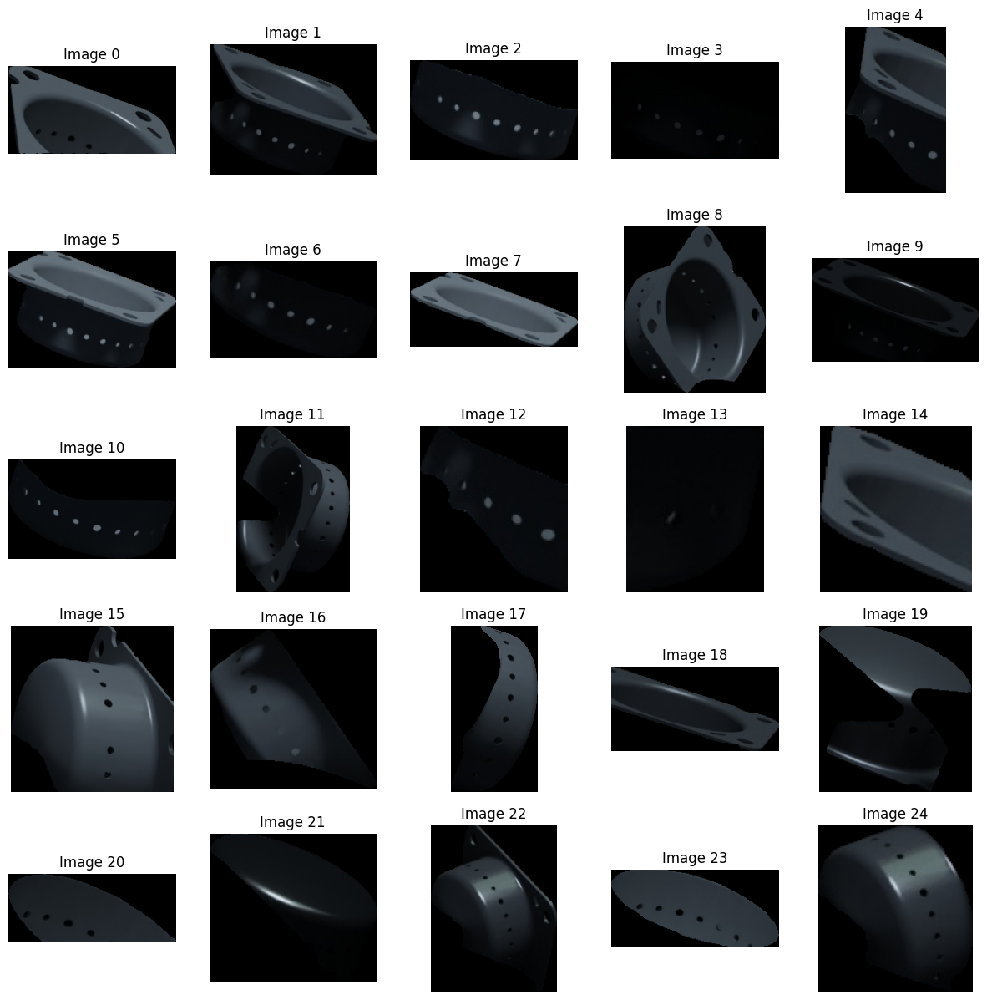

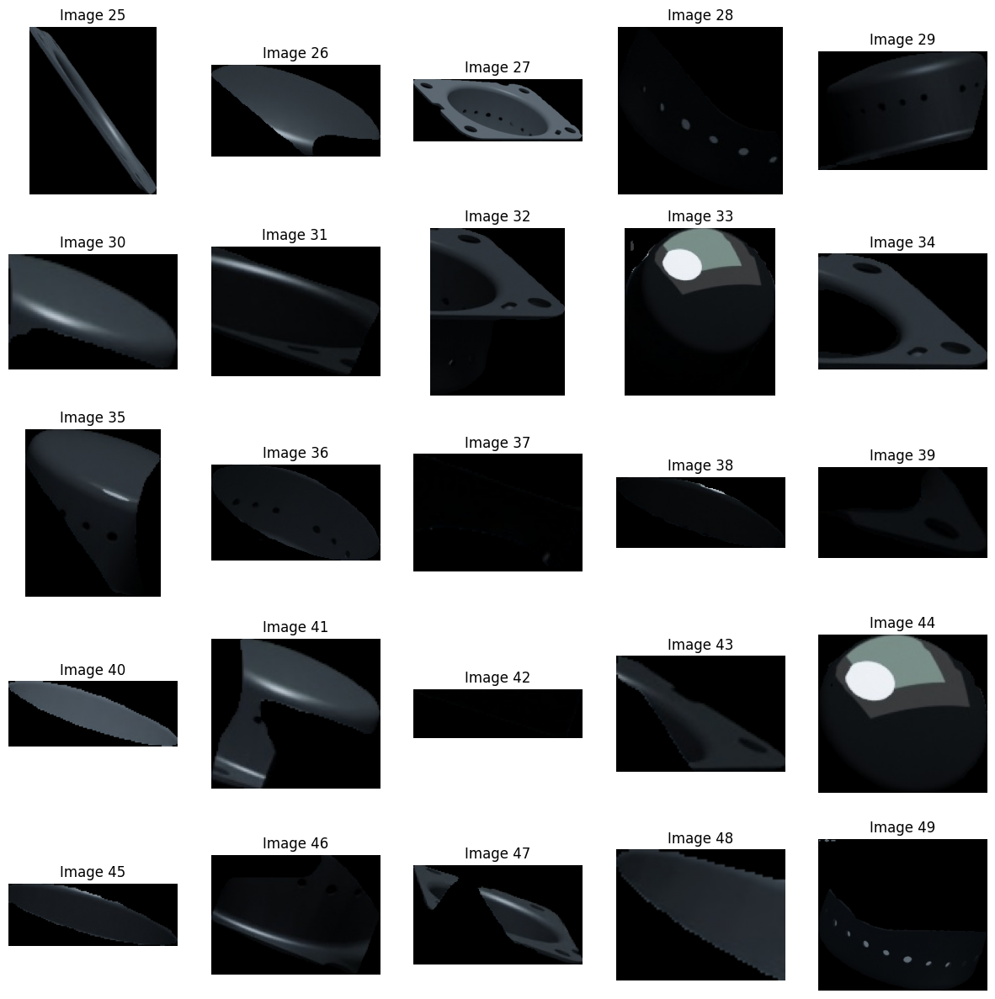

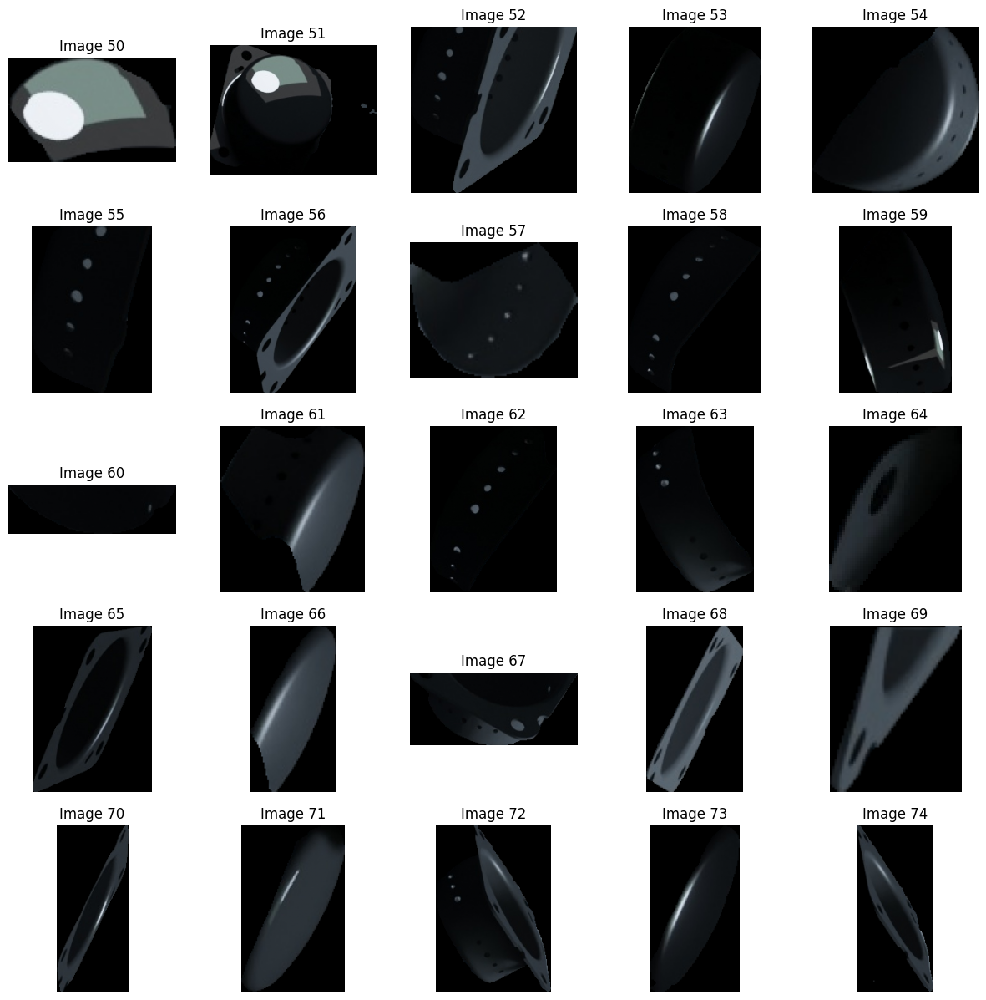

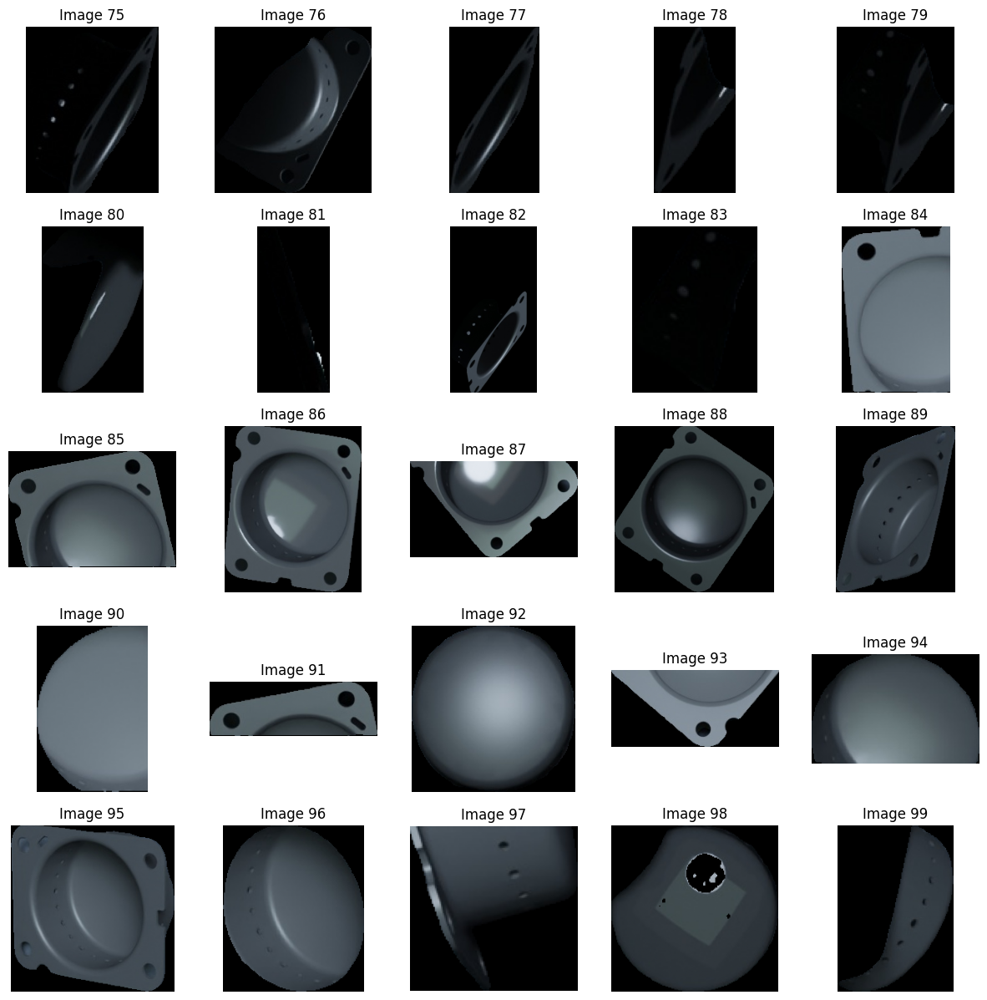

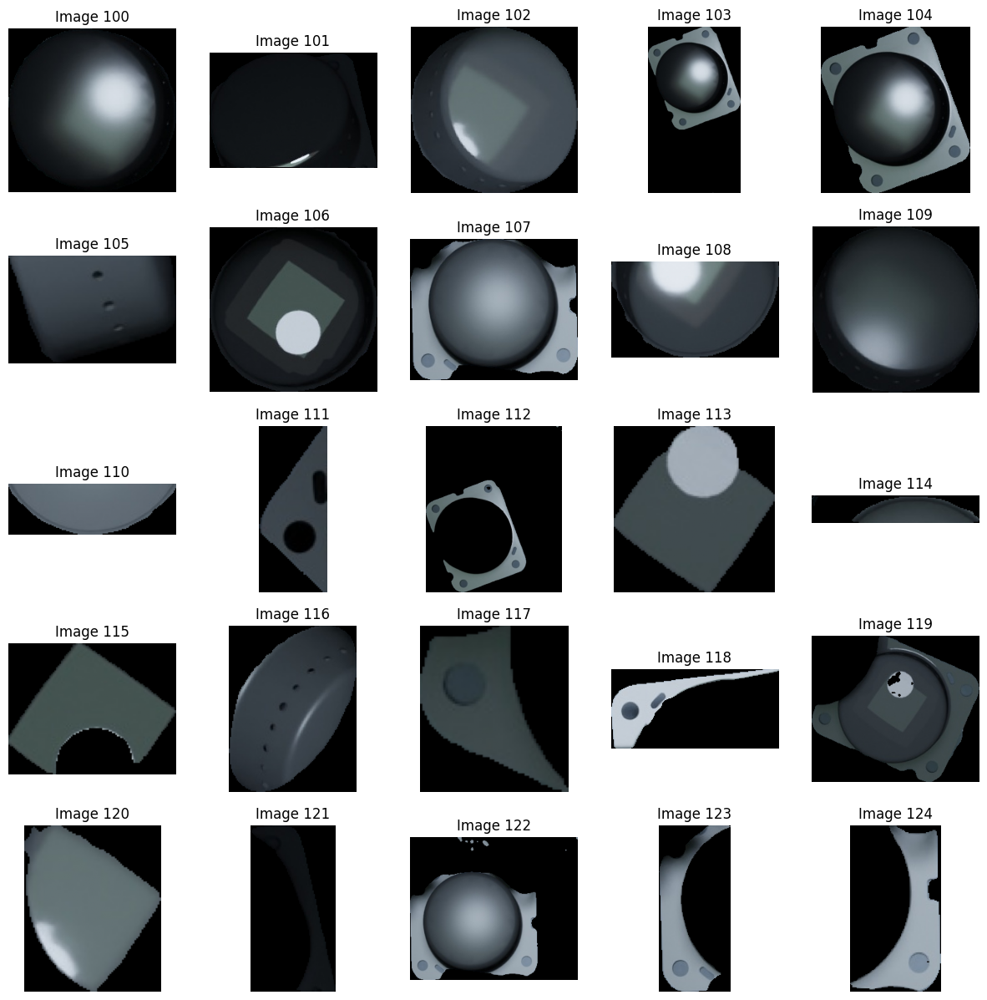

...

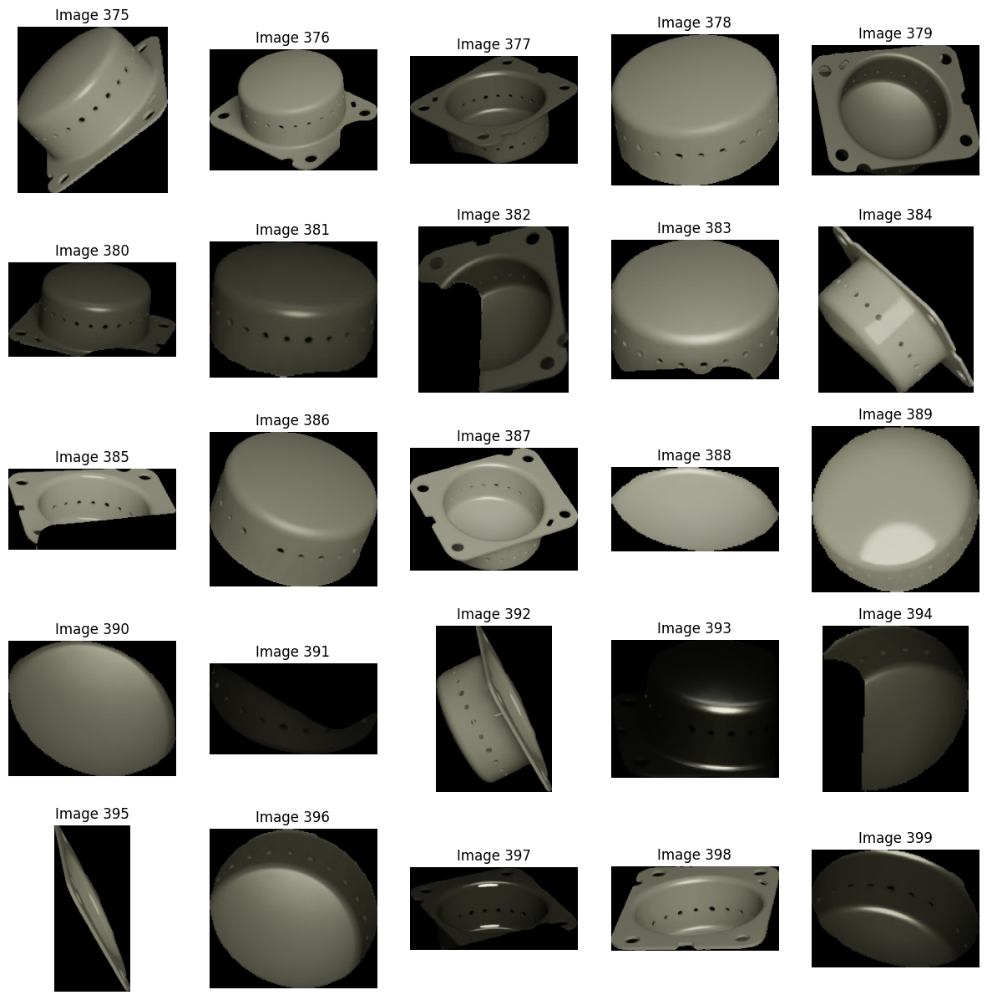

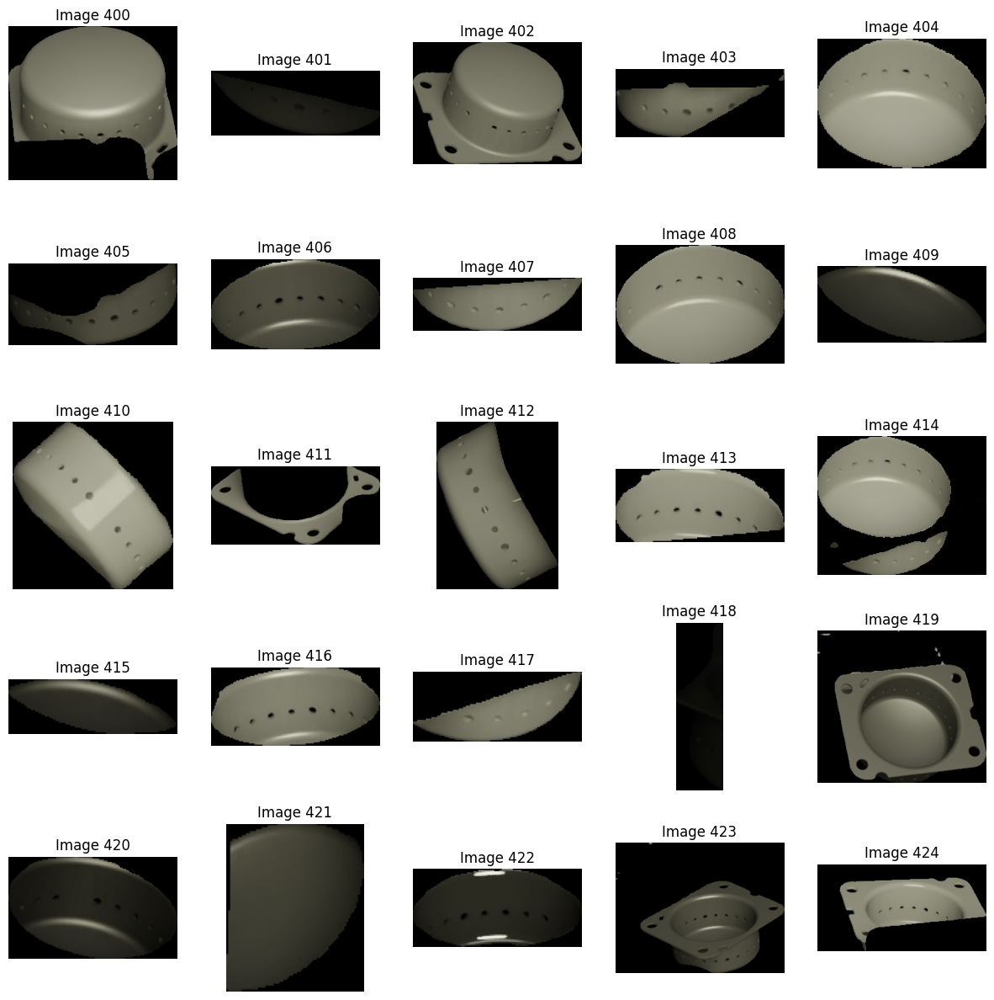

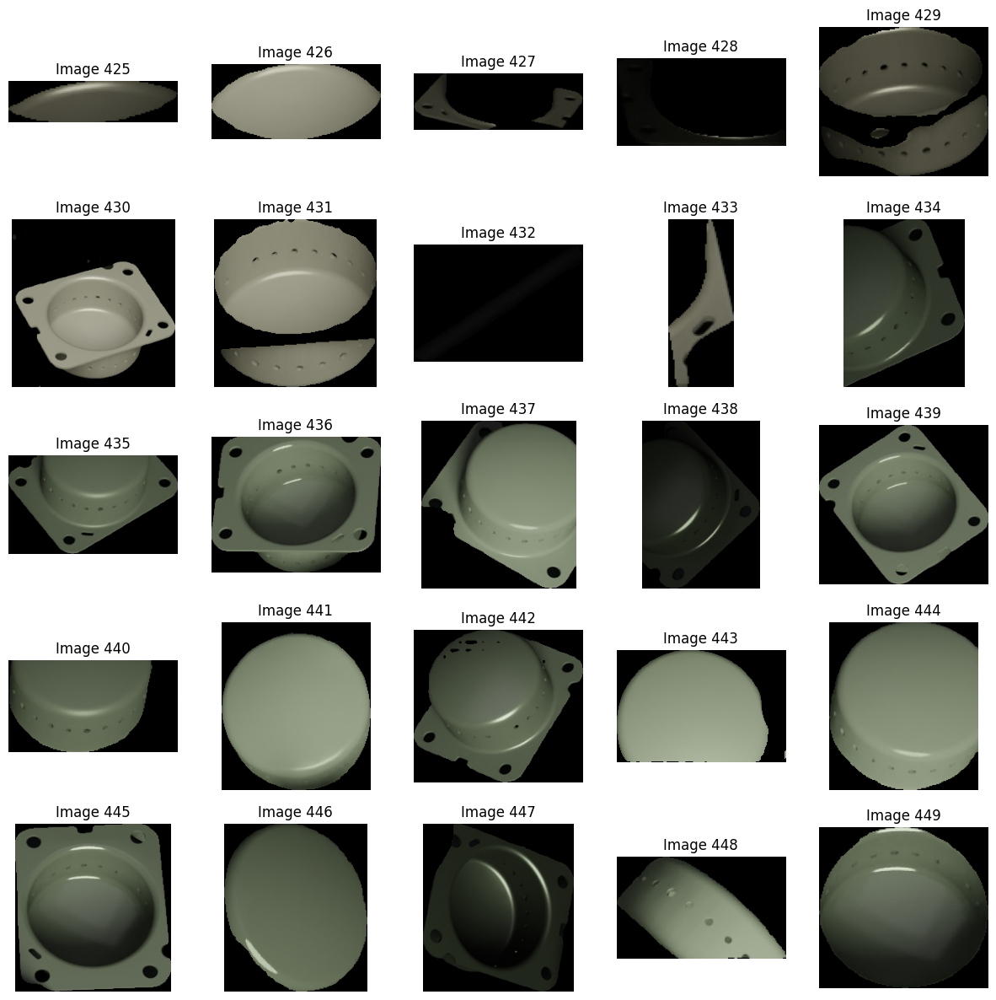

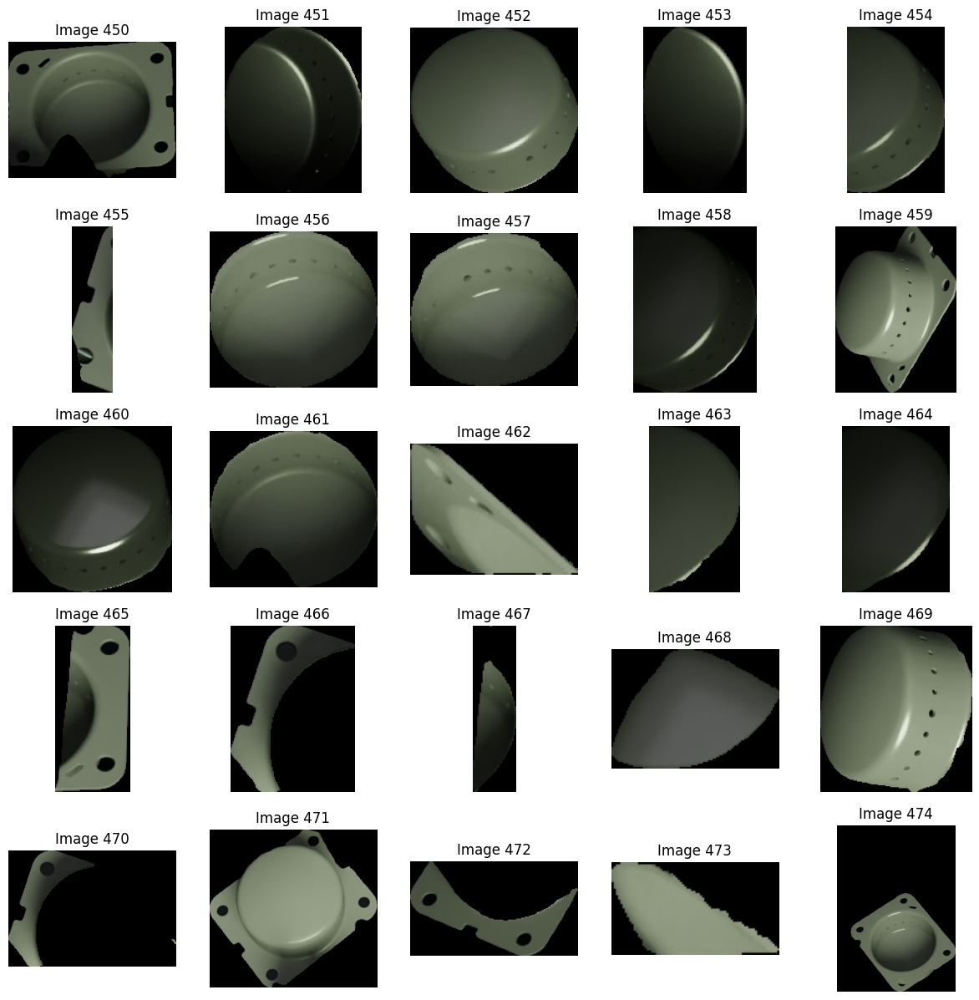

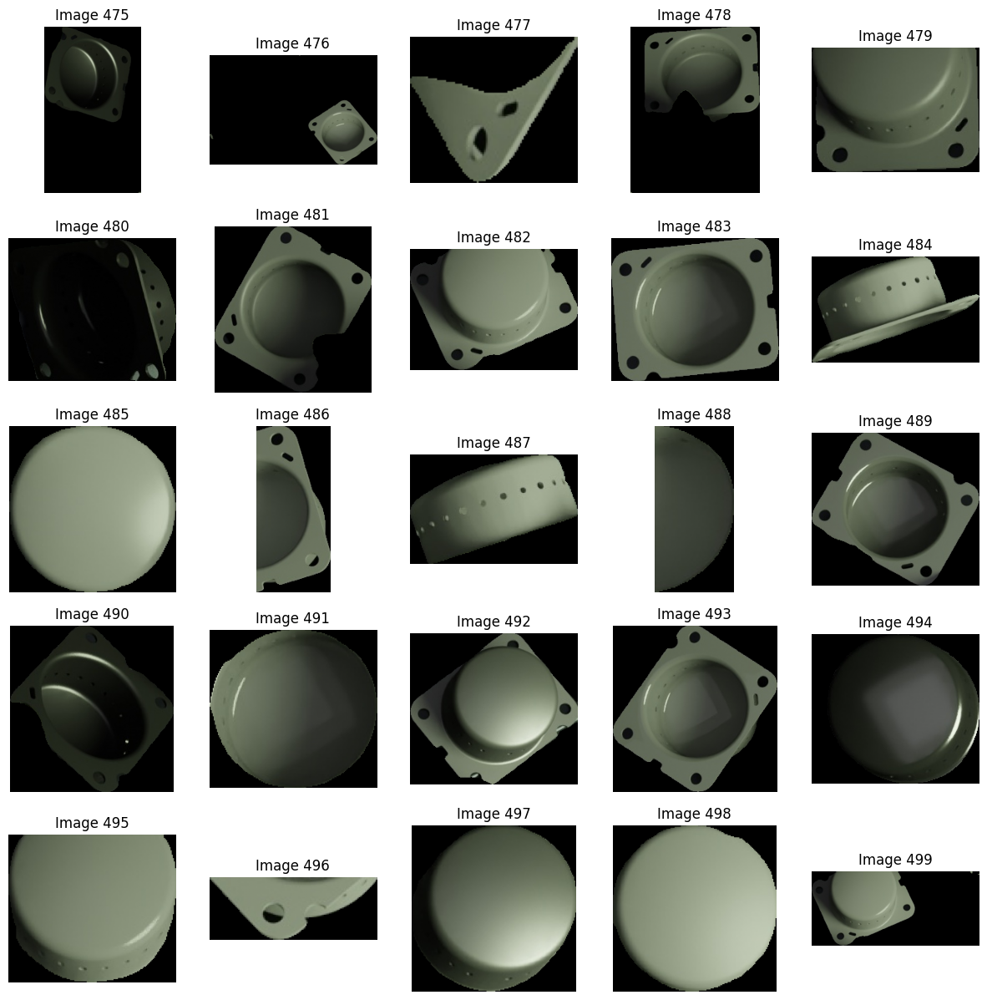

In [2]:
import matplotlib.pyplot as plt
import numpy as np

# Number of images to display at a time
images_per_page = 25

# Define the number of rows and columns for the grid
rows = 5
cols = 5

# Iterate over the images in steps of images_per_page
for i in range(0, 500, images_per_page):
    # Create a new figure for each set of 25 images
    plt.figure(figsize=(15, 15))

    for j in range(images_per_page):
        # Calculate the current image index
        image_index = i + j

        # Check if the image_index is within the bounds of the list
        if image_index >= len(pos):
            break

        # Add a subplot for the current image
        plt.subplot(rows, cols, j + 1)
        plt.imshow(np.array(pos[image_index]["rgb"]))
        plt.title(f"Image {image_index}")
        plt.axis('off')

    # Display the figure containing 25 images
    plt.show()


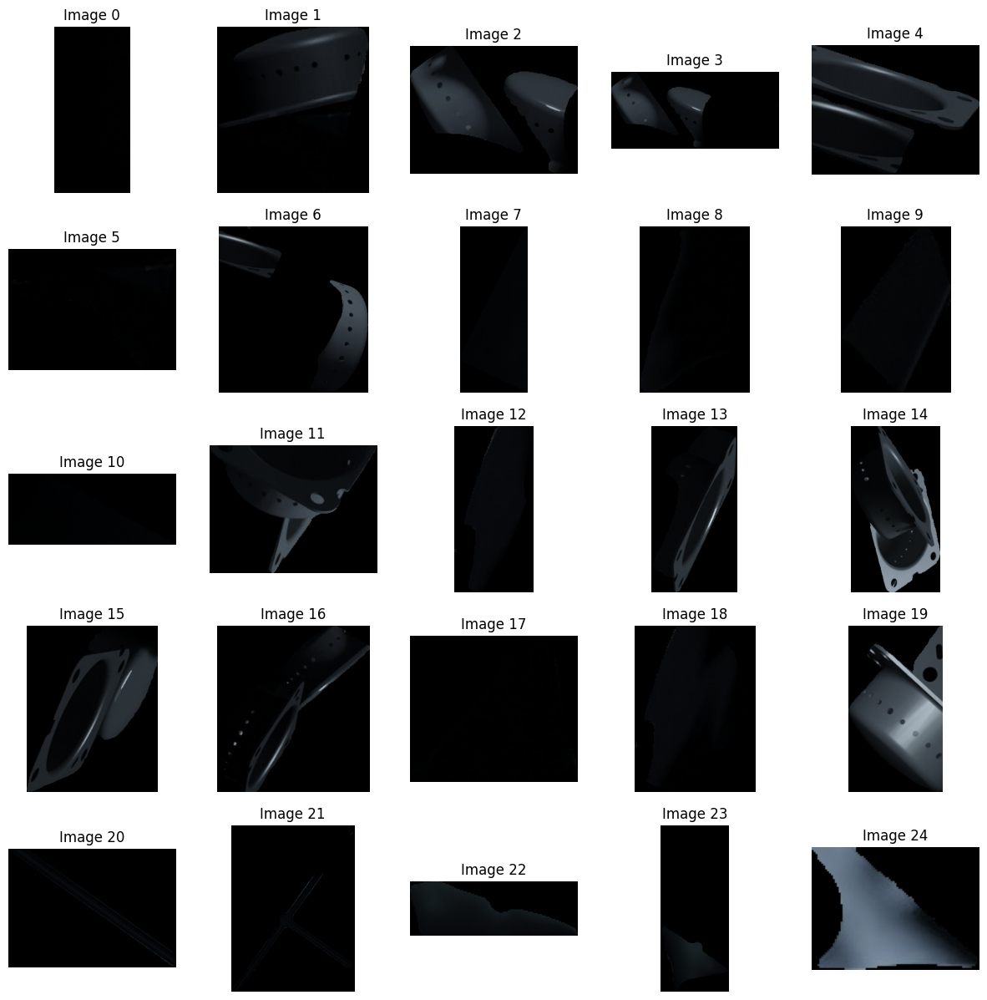

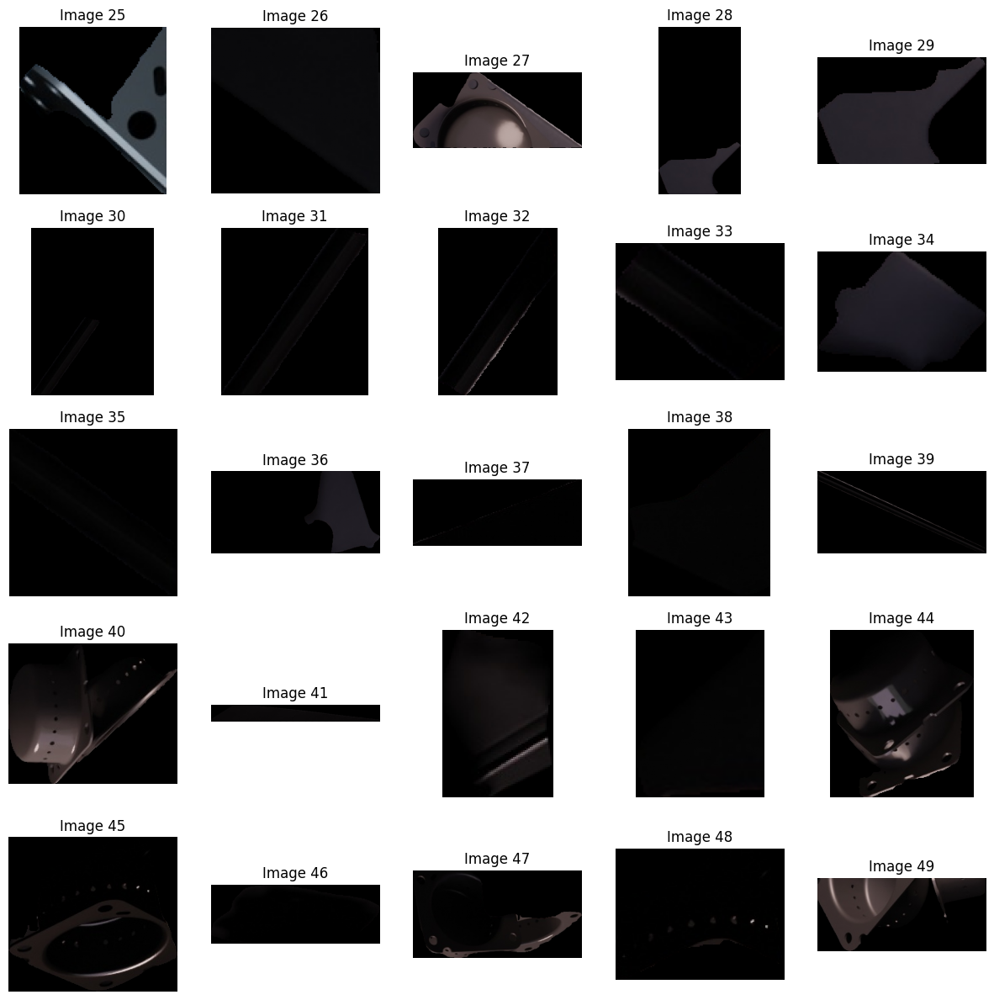

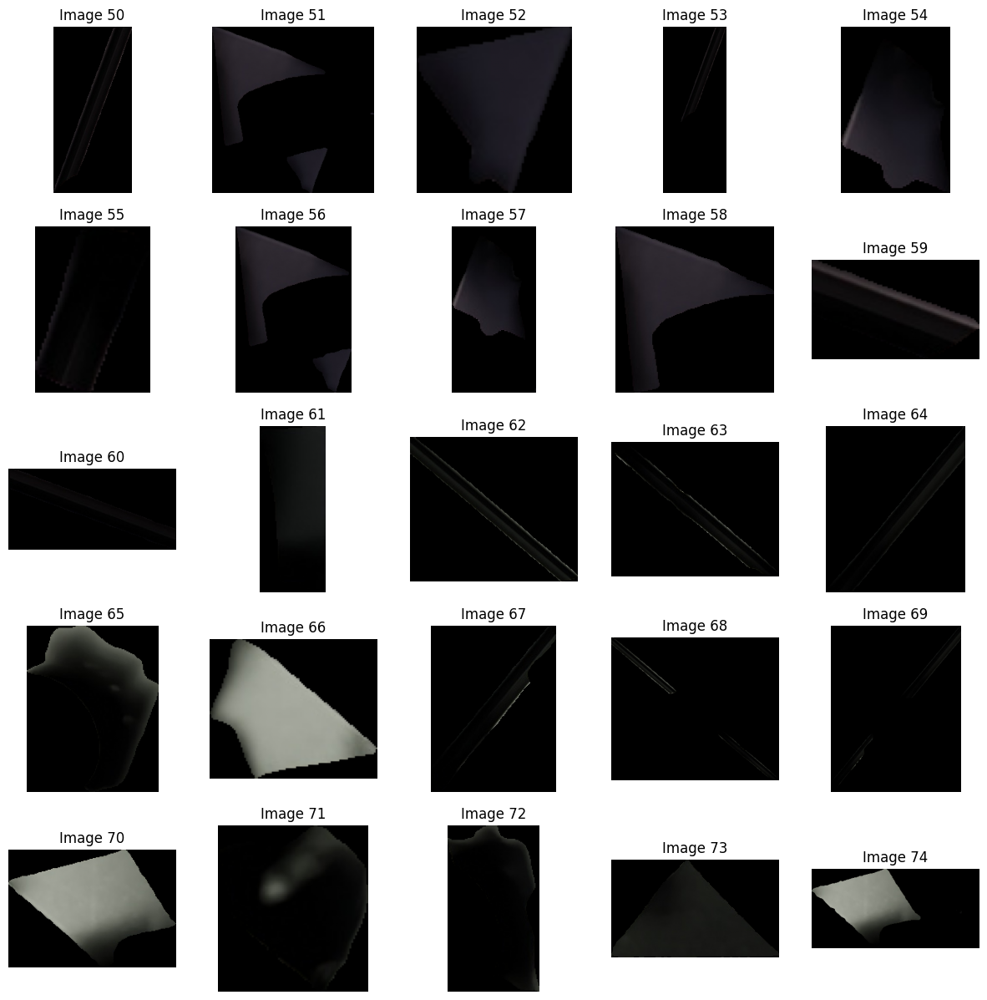

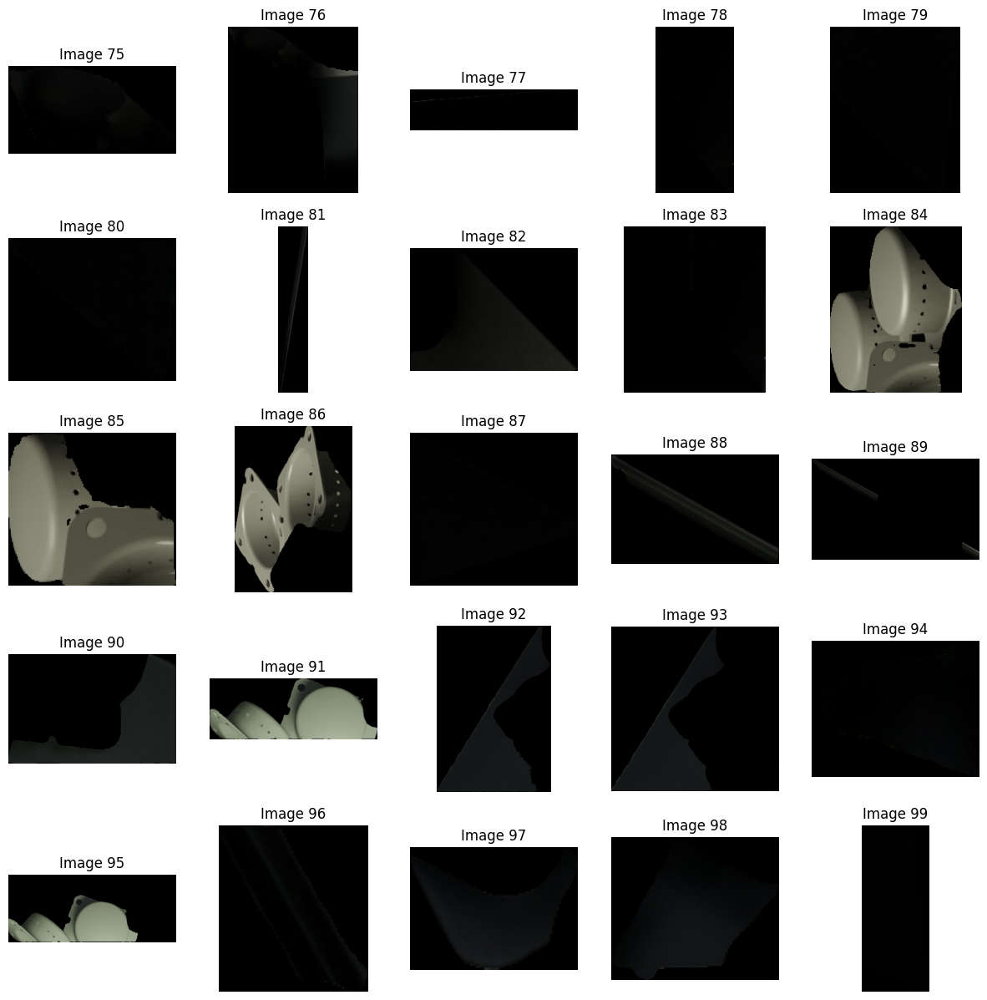

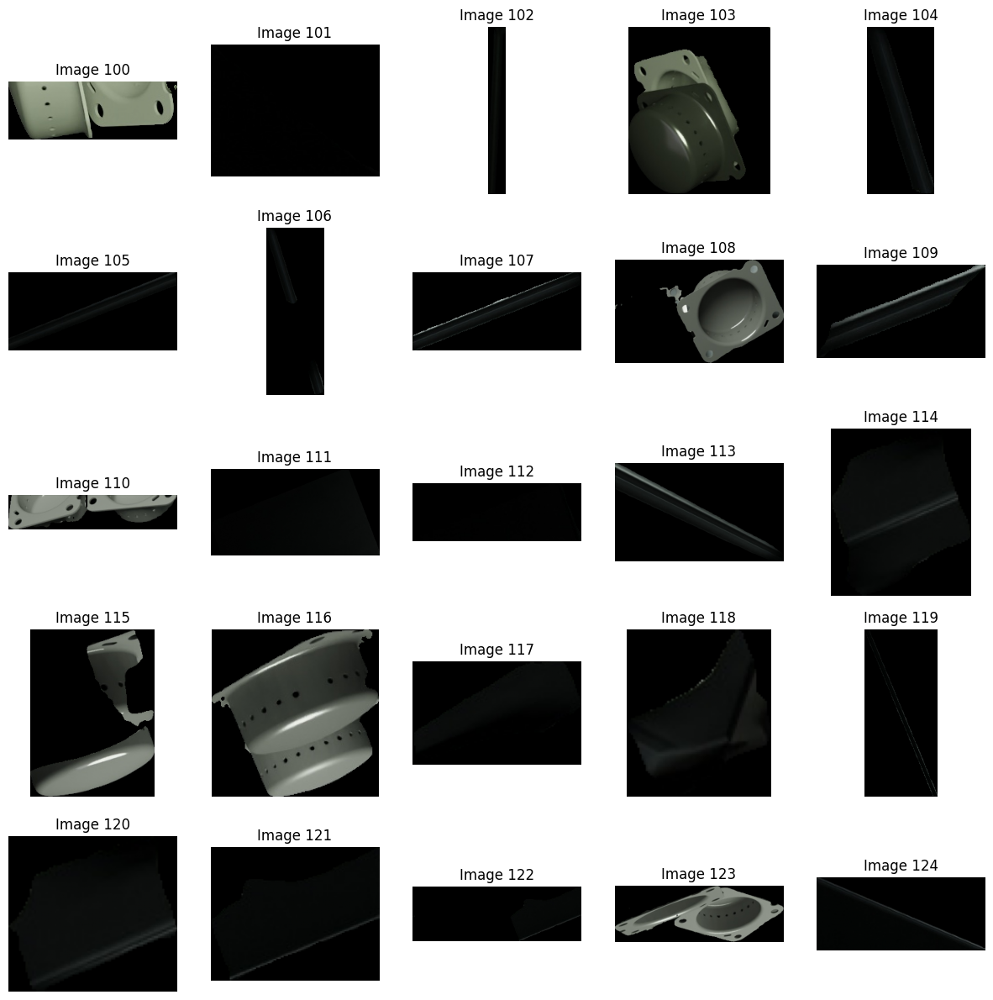

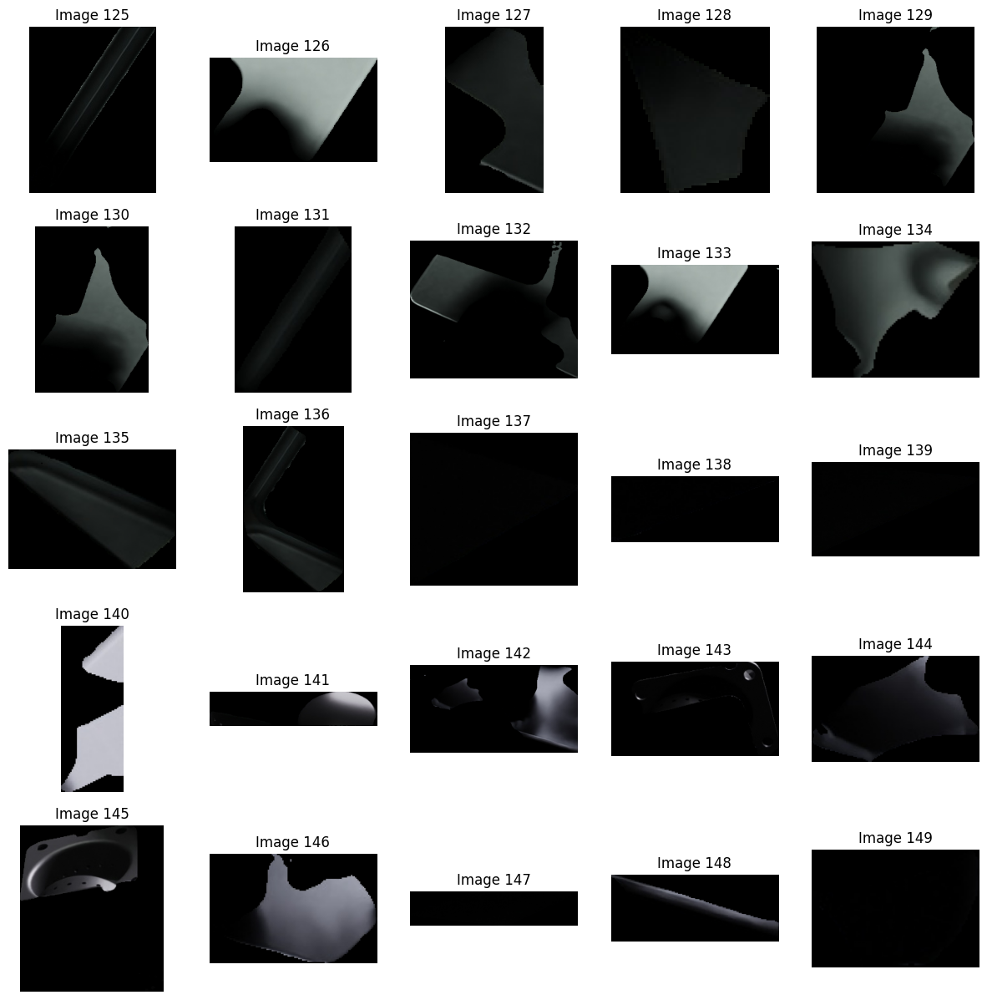

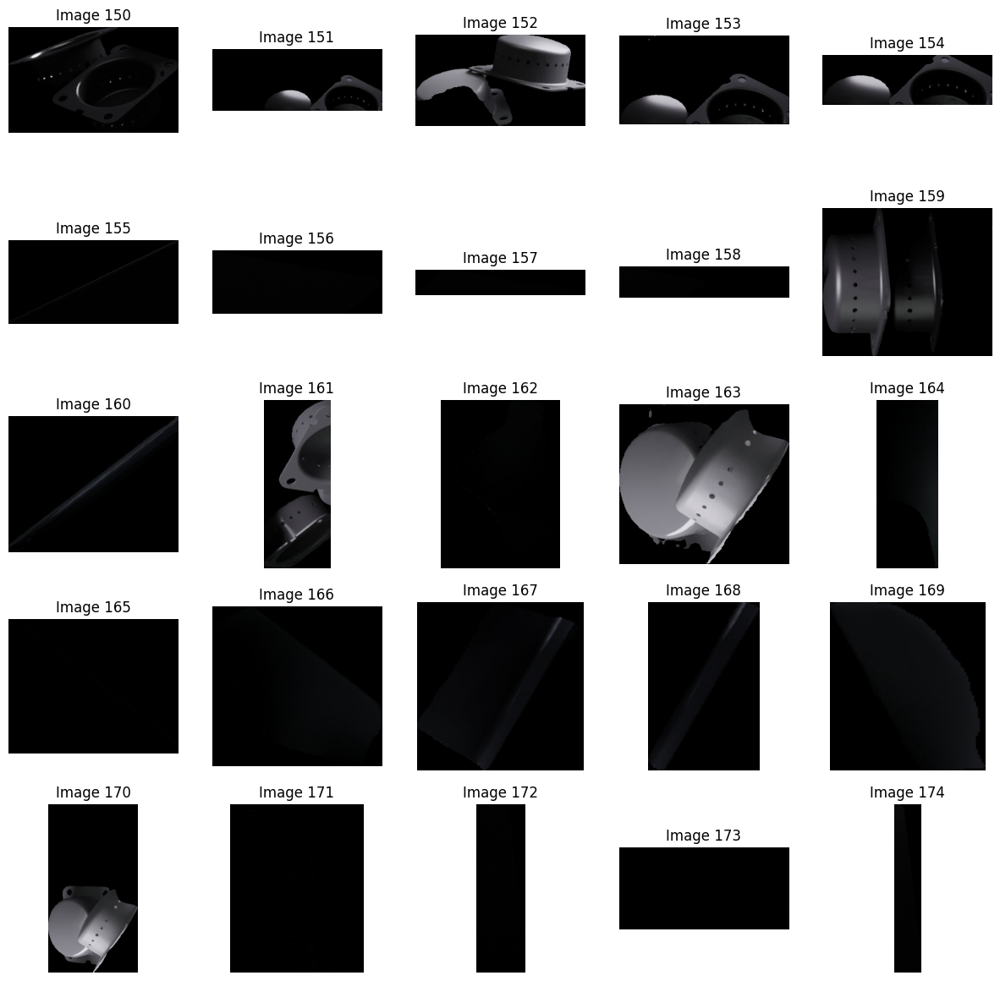

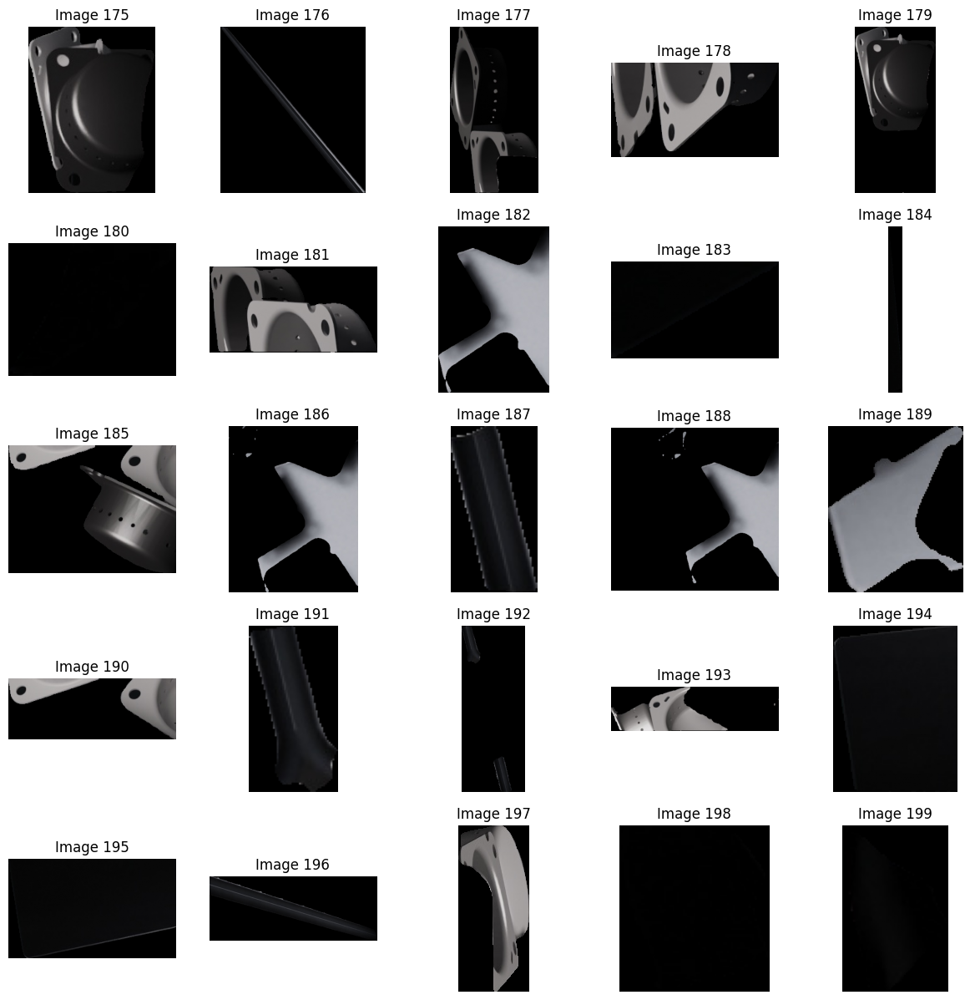

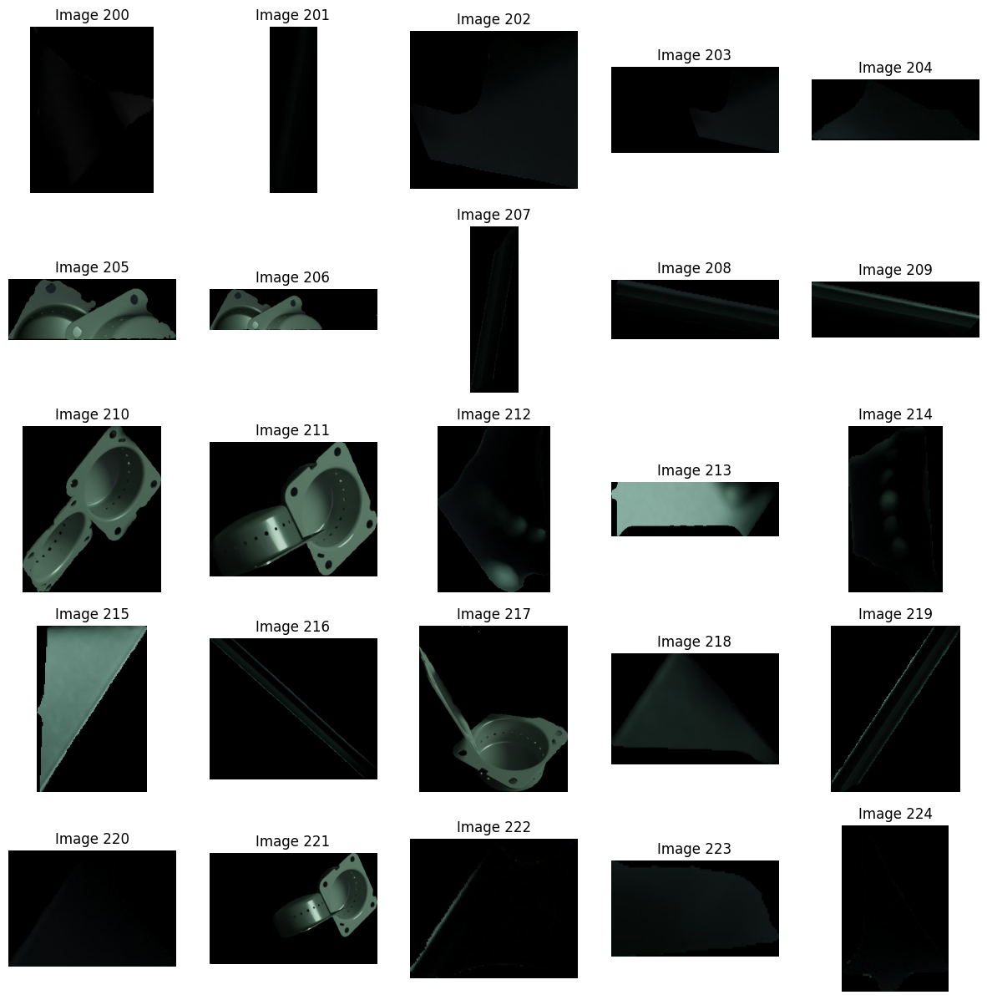

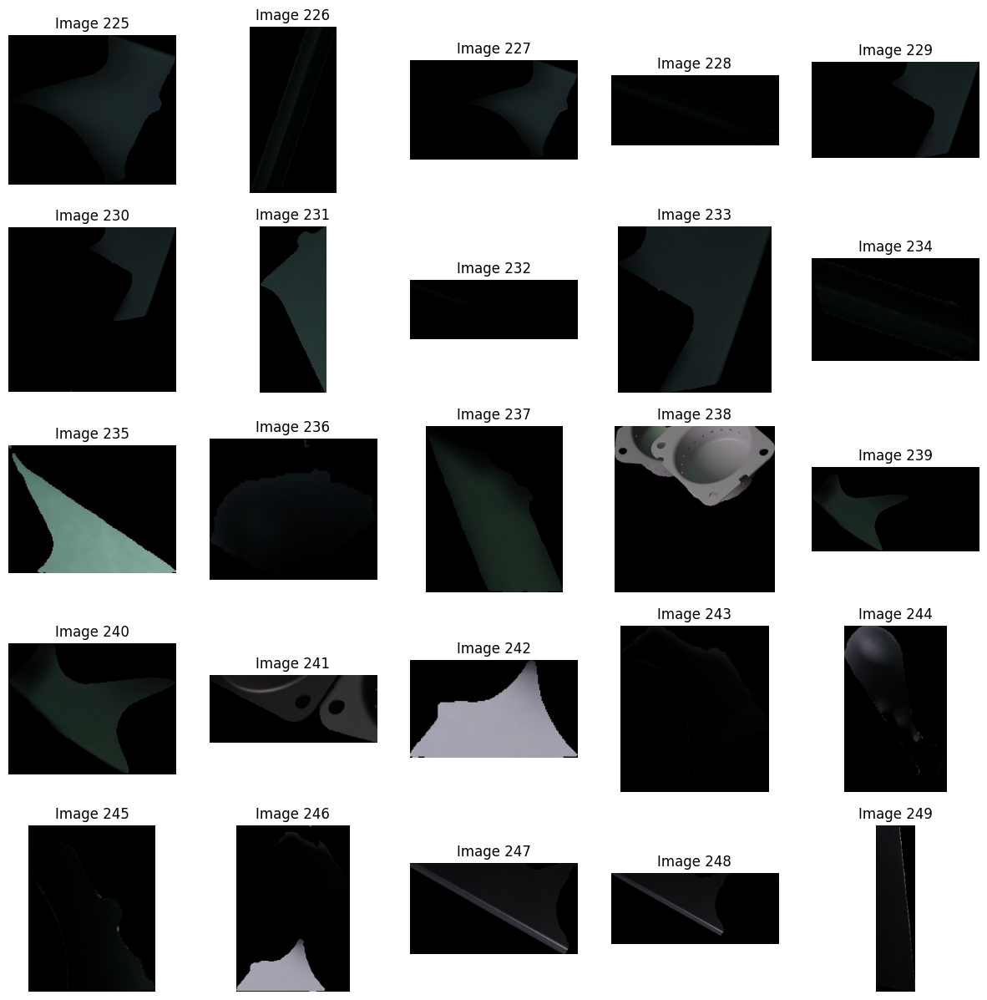

In [3]:
import matplotlib.pyplot as plt
import numpy as np

# Number of images to display at a time
images_per_page = 25

# Define the number of rows and columns for the grid
rows = 5
cols = 5

# Iterate over the images in steps of images_per_page
for i in range(0, 250, images_per_page):
    # Create a new figure for each set of 25 images
    plt.figure(figsize=(15, 15))

    for j in range(images_per_page):
        # Calculate the current image index
        image_index = i + j

        # Check if the image_index is within the bounds of the list
        if image_index >= len(neg):
            break

        # Add a subplot for the current image
        plt.subplot(rows, cols, j + 1)
        plt.imshow(np.array(neg[image_index]))
        plt.title(f"Image {image_index}")
        plt.axis('off')

    # Display the figure containing 25 images
    plt.show()


In [9]:
len(neg)

2417

## 1.2 Create positive and negative pairs
Positive pairs (positive proposal and template with most similar pose)

In [14]:
import torch

from src.model.contrastive_learning_info_nce import ContrastiveLearningModelInfoNCE


# template_paths = "datasets/bop23_challenge/datasets/templates_pyrender/icbin/obj_000001/*.png"
# template_poses_path = "datasets/bop23_challenge/datasets/templates_pyrender/icbin/template_poses.npy"
template_paths = "foundpose_analysis/icbin/templates/train_pbr/obj_000001_original/*.png"
template_poses_path = "foundpose_analysis/icbin/templates/train_pbr/obj_000001_original/poses.pkl"
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = ContrastiveLearningModelInfoNCE(device)
# model.load_state_dict(torch.load("contrastive_learning/saved_checkpoints/icbin_best_model_checkpoint.pth"))

Using cache found in /home/cuong.van-dam/.cache/torch/hub/facebookresearch_dinov2_main
/home/cuong.van-dam/.cache/torch/hub/facebookresearch_dinov2_main/dinov2/layers/swiglu_ffn.py:43: UserWarning: xFormers is available (SwiGLU)
  warnings.warn("xFormers is available (SwiGLU)")
/home/cuong.van-dam/.cache/torch/hub/facebookresearch_dinov2_main/dinov2/layers/attention.py:27: UserWarning: xFormers is available (Attention)
  warnings.warn("xFormers is available (Attention)")
/home/cuong.van-dam/.cache/torch/hub/facebookresearch_dinov2_main/dinov2/layers/block.py:33: UserWarning: xFormers is available (Block)
  warnings.warn("xFormers is available (Block)")
[2024-10-16 17:13:46,113] [INFO] dinov2: using MLP layer as FFN
[2024-10-16 17:13:53,388] [INFO] src.model.contrastive_learning_info_nce: model used is dinov2_vitl14


In [16]:
from src.model.contrastive_learning_info_nce import prepare_dataset
train_dataset, val_dataset, test_dataset, val_set = prepare_dataset(
    template_paths, template_poses_path, pos[:100], neg[:] # build only 1000 postive images
    )

  2%|▏         | 2/100 [00:00<00:25,  3.91it/s][2024-10-16 17:14:10,125] [INFO] src.model.constrastive_learning_utils: Size of pos proposal: (3, 43, 45)
[2024-10-16 17:14:10,139] [INFO] src.model.constrastive_learning_utils: Size of pos proposal: (3, 73, 53)
  7%|▋         | 7/100 [00:01<00:12,  7.35it/s][2024-10-16 17:14:10,653] [INFO] src.model.constrastive_learning_utils: Size of pos proposal: (3, 39, 52)
[2024-10-16 17:14:10,741] [INFO] src.model.constrastive_learning_utils: Size of pos proposal: (3, 35, 30)
  9%|▉         | 9/100 [00:01<00:10,  8.30it/s][2024-10-16 17:14:10,859] [INFO] src.model.constrastive_learning_utils: Size of pos proposal: (3, 40, 45)
[2024-10-16 17:14:10,948] [INFO] src.model.constrastive_learning_utils: Size of pos proposal: (3, 45, 67)
 28%|██▊       | 28/100 [00:04<00:08,  8.04it/s][2024-10-16 17:14:13,907] [INFO] src.model.constrastive_learning_utils: Size of pos proposal: (3, 78, 42)
[2024-10-16 17:14:13,996] [INFO] src.model.constrastive_learning_util

KeyboardInterrupt: 

In [16]:
from torch.utils.data import DataLoader, Dataset


train_loader = DataLoader(train_dataset, batch_size=16, shuffle=True, num_workers=4)
val_loader = DataLoader(val_dataset, batch_size=4, shuffle=True, num_workers=1)

In [17]:
# import matplotlib.pyplot as plt

# # Define the number of pairs to show at a time
# pairs_per_page = 5

# # Iterate over the specified range of pairs, in steps of `pairs_per_page`
# for i in range(20, 40, pairs_per_page):
#     # Create a new figure for each set of 5 pairs
#     plt.figure(figsize=(15, 10))  # Adjusted the figsize for multiple pairs

#     for j in range(pairs_per_page):
#         # Calculate the current pair index
#         pair_index = i + j

#         # Check if the pair_index is within the bounds of the list
#         if pair_index >= len(val_set):
#             break

#         pair = val_set[pair_index]

#         # First image in the pair (img2)
#         plt.subplot(pairs_per_page, 2, 2*j + 1)
#         plt.imshow(pair["pos"].permute(1, 2, 0))
#         plt.axis('off')

#         # Second image in the pair (img1)
#         plt.subplot(pairs_per_page, 2, 2*j + 2)
#         plt.imshow(pair["anchor"].permute(1, 2, 0))
#         plt.axis('off')

#     # Display the figure containing 5 pairs
#     plt.show()


In [18]:
# import matplotlib.pyplot as plt

# # Define the number of pairs to show at a time
# pairs_per_page = 5

# # Iterate over the specified range of pairs, in steps of `pairs_per_page`
# for i in range(20, 40, pairs_per_page):
#     # Create a new figure for each set of 5 pairs
#     plt.figure(figsize=(15, 10))  # Adjusted the figsize for multiple pairs

#     for j in range(pairs_per_page):
#         # Calculate the current pair index
#         pair_index = i + j

#         # Check if the pair_index is within the bounds of the list
#         if pair_index >= len(val_set):
#             break

#         pair = val_set[pair_index]

#         # First image in the pair (img2)
#         plt.subplot(pairs_per_page, 2, 2*j + 1)
#         plt.imshow(pair["neg"].permute(1, 2, 0))
#         plt.axis('off')

#         # Second image in the pair (img1)
#         plt.subplot(pairs_per_page, 2, 2*j + 2)
#         plt.imshow(pair["anchor"].permute(1, 2, 0))
#         plt.axis('off')

#     # Display the figure containing 5 pairs
#     plt.show()


In [19]:
# import matplotlib.pyplot as plt

# # Define the number of pairs to show at a time
# pairs_per_page = 5

# # Iterate over the specified range of pairs, in steps of `pairs_per_page`
# for i in range(20, 40, pairs_per_page):
#     # Create a new figure for each set of 5 pairs
#     plt.figure(figsize=(15, 10))  # Adjusted the figsize for multiple pairs

#     for j in range(pairs_per_page):
#         # Calculate the current pair index
#         pair_index = i + j

#         # Check if the pair_index is within the bounds of the list
#         if pair_index >= len(val_set):
#             break

#         pair = val_set[pair_index]

#         # First image in the pair (img2)
#         plt.subplot(pairs_per_page, 2, 2*j + 1)
#         plt.imshow(pair["neg"].permute(1, 2, 0))
#         plt.axis('off')

#         # Second image in the pair (img1)
#         plt.subplot(pairs_per_page, 2, 2*j + 2)
#         plt.imshow(pair["anchor"].permute(1, 2, 0))
#         plt.axis('off')

#     # Display the figure containing 5 pairs
#     plt.show()


In [20]:
# import matplotlib.pyplot as plt
# for pair in train_negative_pairs[:40]:
#     plt.figure(figsize=(10, 5))
#     plt.subplot(1, 2, 1)
#     plt.imshow(pair["img1"].permute(1,2,0))
#     plt.axis('off')

#     plt.subplot(1, 2, 2)
#     plt.imshow(pair["img2"].permute(1,2,0))
#     plt.axis('off')

#     plt.show()

In [21]:
from src.model.contrastive_learning_info_nce import train_info_nce_loss
dataset = "icbin"
train_info_nce_loss(device, model, train_loader, val_loader, num_epochs=15, dataset=dataset)
# train_contrastive_loss(device, model, train_dataset, val_dataset, test_dataset, num_epochs=25) # this time train_pbr

[2024-10-16 13:43:37,519] [ERROR] wandb.jupyter: Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: Currently logged in as: damvancuong510. Use `wandb login --relogin` to force relogin


Training:   0%|          | 0/15 [00:00<?, ?it/s]/home/cuong.van-dam/miniconda3/envs/cnos/lib/python3.9/site-packages/xformers/ops/unbind.py:46: UserWarning: TypedStorage is deprecated. It will be removed in the future and UntypedStorage will be the only storage class. This should only matter to you if you are using storages directly.  To access UntypedStorage directly, use tensor.untyped_storage() instead of tensor.storage()
  storage_data_ptr = tensors[0].storage().data_ptr()
/home/cuong.van-dam/miniconda3/envs/cnos/lib/python3.9/site-packages/xformers/ops/unbind.py:48: UserWarning: TypedStorage is deprecated. It will be removed in the future and UntypedStorage will be the only storage class. This should only matter to you if you are using storages directly.  To access UntypedStorage directly, use tensor.untyped_storage() instead of tensor.storage()
  if x.storage().data_ptr() != storage_data_ptr:
[2024-10-16 13:59:49,399] [INFO] src.model.contrastive_learning_info_nce: Epoch 1/15 los

best_val_loss:  0.20457328046259743
saving best model at epoch:  0


Training:  20%|██        | 3/15 [49:06<3:15:20, 976.73s/it][2024-10-16 14:48:55,523] [INFO] src.model.contrastive_learning_info_nce: Epoch 4/15 loss: 0.34101
[2024-10-16 14:49:41,792] [INFO] src.model.contrastive_learning_info_nce: Epoch 4/15 Validation Loss: 0.20760
Training:  40%|████      | 6/15 [1:38:14<2:26:37, 977.53s/it][2024-10-16 15:38:04,468] [INFO] src.model.contrastive_learning_info_nce: Epoch 7/15 loss: 0.30555
[2024-10-16 15:38:50,748] [INFO] src.model.contrastive_learning_info_nce: Epoch 7/15 Validation Loss: 0.12424


best_val_loss:  0.12424262591376949
saving best model at epoch:  6


Training:  60%|██████    | 9/15 [2:27:24<1:37:47, 977.83s/it][2024-10-16 16:27:14,624] [INFO] src.model.contrastive_learning_info_nce: Epoch 10/15 loss: 0.30860
[2024-10-16 16:28:00,816] [INFO] src.model.contrastive_learning_info_nce: Epoch 10/15 Validation Loss: 0.17098
Training:  80%|████████  | 12/15 [3:27:25<51:51, 1037.12s/it] 


KeyboardInterrupt: 

# 3. Test

In [59]:
from tqdm import tqdm
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
import torchvision.transforms as transforms
import torch.nn as nn
import glob
import torchvision.transforms as T
import torch

from src.model.contrastive_learning_info_nce import ContrastiveLearningModelInfoNCE
from src.model.constrastive_learning_utils import resize_and_pad_image

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")


model = ContrastiveLearningModelInfoNCE(device)
model.load_state_dict(torch.load("contrastive_learning/saved_checkpoints/icbin_model_checkpoint5.pth"))
model = model.to(device)

Using cache found in /home/cuong.van-dam/.cache/torch/hub/facebookresearch_dinov2_main
[2024-10-16 10:46:08,306] [INFO] dinov2: using MLP layer as FFN
[2024-10-16 10:46:11,439] [INFO] src.model.contrastive_learning_info_nce: model used is dinov2_vitl14_reg with more aumneation method


In [60]:
neg = torch.stack([d[2] for d in test_dataset]).to(device).to(torch.float32)
pos = torch.stack([d[0] for d in test_dataset]).to(device).to(torch.float32)
anchor = torch.stack([d[1] for d in test_dataset]).to(device).to(torch.float32)

In [61]:
model.eval()
with torch.no_grad():
    correct, total = 0, 0
    test_loss = 0.0
    
    pos_out, anchor_out, neg_out = model(pos, anchor, neg)

import torch.nn.functional as F

# Normalize feature vectors
anchor = F.normalize(anchor_out, dim=1)
positive = F.normalize(pos_out, dim=1)
negative = F.normalize(neg_out, dim=1)

# Compute similarity scores
pos_sim = torch.sum(anchor * positive, dim=1)
neg_sim = torch.sum(anchor * negative, dim=1) 

pos_pred = torch.sum(torch.where(pos_sim>0.5,1,0))
neg_pred = torch.sum(torch.where(neg_sim<0.5,1,0))

print(pos_pred, neg_pred)


tensor(250, device='cuda:0') tensor(1197, device='cuda:0')


In [48]:
neg_pred

tensor(1008, device='cuda:0')

In [29]:
pred = torch.where(euclidean_distance<1,1,0)
TP = torch.sum(labels == pred)
TP

tensor(1227, device='cuda:0')

In [30]:
acc = TP/len(labels)
acc

tensor(1., device='cuda:0')

: 